In [7]:
import pandas as pd
import re
maps = pd.read_csv('ROI_MNI_V4.txt',delimiter='\t',header=None)
maps.columns = ['Name', 'cs', 'ID']
maps.set_index('ID', inplace=True)
sts = """FAG & 2001 & 4.26 & IND & 3002 & 6.63 & P1G & 6101 & 20.91 & T2AD & 8212 & 5.51 \\
FAD & 2002 & 11.29 & CIAG & 4001 & 14.28 & P1D & 6102 & 4.62 & T3G & 8301 & 20.59 \\
F1G & 2101 & 6.00 & CIAD & 4002 & 8.30 & P2G & 6201 & 8.20 & T3D & 8302 & 6.68 \\
F1D & 2102 & 4.39 & CINMG & 4011 & 7.06 & P2D & 6202 & 11.92 & CERCRU1G & 9001 & 6.20 \\
F1OG & 2111 & 4.60 & CINMD & 4012 & 5.16 & GSMG & 6211 & 5.63 & CERCRU1D & 9002 & 5.51 \\
F1OD & 2112 & 6.47 & CIPG & 4021 & 41.84 & GSMD & 6212 & 9.12 & CERCRU2G & 9011 & 5.37 \\
F2G & 2201 & 13.93 & CIPD & 4022 & 5.80 & GAG & 6221 & 19.34 & CERCRU2D & 9012 & 5.27 \\
F2D & 2202 & 7.33 & HIPPOG & 4101 & 6.99 & GAD & 6222 & 6.38 & CER3G & 9021 & 5.56 \\
F2OG & 2211 & 6.31 & HIPPOD & 4102 & 11.85 & PQG & 6301 & 7.05 & CER3D & 9022 & 8.09 \\
F2OD & 2212 & 4.31 & PARA_HIPPOG & 4111 & 6.07 & PQD & 6302 & 6.13 & CER4_5G & 9031 & 9.37 \\
F3OPG & 2301 & 5.59 & PARA_HIPPOD & 4112 & 10.64 & LPCG & 6401 & 5.41 & CER4_5D & 9032 & 17.36 \\
F3OPD & 2302 & 4.54 & AMYGDG & 4201 & 5.61 & LPCD & 6402 & 36.82 & CER6G & 9041 & 6.57 \\
F3TG & 2311 & 7.91 & AMYGDD & 4202 & 5.56 & NCG & 7001 & 4.81 & CER6D & 9042 & 6.45 \\
F3TD & 2312 & 7.39 & V1G & 5001 & 5.66 & NCD & 7002 & 5.50 & CER7BG & 9051 & 5.94 \\
F3OG & 2321 & 4.38 & V1D & 5002 & 4.58 & NLG & 7011 & 8.86 & CER7BD & 9052 & 3.91 \\
F3OD & 2322 & 7.33 & QG & 5011 & 37.08 & NLD & 7012 & 20.33 & CER8G & 9061 & 5.22 \\
ORG & 2331 & 7.19 & QD & 5012 & 4.81 & PALLG & 7021 & 5.20 & CER8D & 9062 & 4.80 \\
ORD & 2332 & 5.83 & LINGG & 5021 & 5.70 & PALLD & 7022 & 4.23 & CER9G & 9071 & 13.71 \\
SMAG & 2401 & 6.98 & LINGD & 5022 & 5.20 & THAG & 7101 & 5.33 & CER9D & 9072 & 14.07 \\
SMAD & 2402 & 4.91 & O1G & 5101 & 15.65 & THAD & 7102 & 19.64 & CER10G & 9081 & 4.45 \\
COBG & 2501 & 15.32 & O1D & 5102 & 4.13 & HESCHLG & 8101 & 7.99 & CER10D & 9082 & 10.54 \\
COBD & 2502 & 15.05 & O2G & 5201 & 17.43 & HESCHLD & 8102 & 5.82 & VER1_2 & 9100 & 5.19 \\
FMG & 2601 & 6.13 & O2D & 5202 & 12.82 & T1G & 8111 & 14.52 & VER3 & 9110 & 6.18 \\
FMD & 2602 & 9.94 & O3G & 5301 & 5.31 & T1D & 8112 & 18.70 & VER4_5 & 9120 & 30.68 \\
FMOG & 2611 & 6.39 & O3D & 5302 & 10.85 & T1AG & 8121 & 6.81 & VER6 & 9130 & 5.36 \\
FMOD & 2612 & 4.38 & FUSIG & 5401 & 5.43 & T1AD & 8122 & 10.36 & VER7 & 9140 & 16.97 \\
GRG & 2701 & 5.51 & FUSID & 5402 & 4.20 & T2G & 8201 & 4.12 & VER8 & 9150 & 17.13 \\
GRD & 2702 & 5.87 & PAG & 6001 & 5.96 & T2D & 8202 & 8.62 & VER9 & 9160 & 41.59 \\
ING & 3001 & 4.76 & PAD & 6002 & 7.13 & T2AG & 8211 & 21.91 & VER10 & 9170 & 14.93 \\"""

def replace_columns(input_string, df):
    lines = input_string.strip().split('\\\n')
    for idx, line in enumerate(lines):
        parts = re.split(r' & ', line)  # 分割字符串为列表
        for i in [0, 3, 6, 9]:  # 检查需要替换的位置
            if i < len(parts):
                match = df[df['Name'] == parts[i]]
                if not match.empty:
                    parts[i] = match.iloc[0]['cs']  # 替换成cs列的值
        lines[idx] = ' & '.join(parts) + ' \\\\'
    return '\n'.join(lines)

output_string = replace_columns(sts,maps).replace('_','\_')
print(output_string)


Precentral\_L & 2001 & 4.26 & Insula\_R & 3002 & 6.63 & Parietal\_Sup\_L & 6101 & 20.91 & Temporal\_Pole\_Mid\_R & 8212 & 5.51  \\
Precentral\_R & 2002 & 11.29 & Cingulum\_Ant\_L & 4001 & 14.28 & Parietal\_Sup\_R & 6102 & 4.62 & Temporal\_Inf\_L & 8301 & 20.59  \\
Frontal\_Sup\_L & 2101 & 6.00 & Cingulum\_Ant\_R & 4002 & 8.30 & Parietal\_Inf\_L & 6201 & 8.20 & Temporal\_Inf\_R & 8302 & 6.68  \\
Frontal\_Sup\_R & 2102 & 4.39 & Cingulum\_Mid\_L & 4011 & 7.06 & Parietal\_Inf\_R & 6202 & 11.92 & Cerebelum\_Crus1\_L & 9001 & 6.20  \\
Frontal\_Sup\_Orb\_L & 2111 & 4.60 & Cingulum\_Mid\_R & 4012 & 5.16 & SupraMarginal\_L & 6211 & 5.63 & Cerebelum\_Crus1\_R & 9002 & 5.51  \\
Frontal\_Sup\_Orb\_R & 2112 & 6.47 & Cingulum\_Post\_L & 4021 & 41.84 & SupraMarginal\_R & 6212 & 9.12 & Cerebelum\_Crus2\_L & 9011 & 5.37  \\
Frontal\_Mid\_L & 2201 & 13.93 & Cingulum\_Post\_R & 4022 & 5.80 & Angular\_L & 6221 & 19.34 & Cerebelum\_Crus2\_R & 9012 & 5.27  \\
Frontal\_Mid\_R & 2202 & 7.33 & Hippocampus\_L &

In [2]:
import pandas as pd
df = pd.read_excel('latex.xlsx')
maps = pd.read_csv('ROI_MNI_V4.txt',delimiter='\t',header=None)
maps.columns = ['Name', 'cs', 'ID']
maps.set_index('ID', inplace=True)
print(maps)
MCI = df['ID']
AD = df['ID.1']
SZ = df['ID.2']
PD = df['ID.3']
MCIN = maps.loc[MCI]['cs'].values
ADN = maps.loc[AD]['cs'].values
SZN = maps.loc[SZ]['cs'].values
PDN = maps.loc[PD]['cs'].values

# 将Name列插入到每个ID列的前面
df.insert(df.columns.get_loc("ID"), "Name_ID", MCIN)
df.insert(df.columns.get_loc("ID.1"), "Name_ID.1", ADN)
df.insert(df.columns.get_loc("ID.2"), "Name_ID.2", SZN)
df.insert(df.columns.get_loc("ID.3"), "Name_ID.3", PDN)
df.to_csv('latex.csv')

       Name                 cs
ID                            
2001    FAG       Precentral_L
2002    FAD       Precentral_R
2101    F1G      Frontal_Sup_L
2102    F1D      Frontal_Sup_R
2111   F1OG  Frontal_Sup_Orb_L
...     ...                ...
9130   VER6           Vermis_6
9140   VER7           Vermis_7
9150   VER8           Vermis_8
9160   VER9           Vermis_9
9170  VER10          Vermis_10

[116 rows x 2 columns]


In [28]:
import pandas as pd

df = pd.read_csv('latex.csv')

MCIAD = df.iloc[:,1:11]
SZPD = df.iloc[:,11:]
# formatted_rows = MCIAD.apply(lambda row: '&'.join([f"{num:.3f}" for num in row]), axis=1)

# formatted_rows
def format_row(row):
    formatted_row = []
    for value in row:
        if isinstance(value, float):
            formatted_row.append(f"{value:.3f}")
        else:
            formatted_row.append(str(value))
    return ' & '.join(formatted_row)

formatted_rows = SZPD.apply(format_row, axis=1)

formatted_rows_str = '\\\\\n'.join(formatted_rows)
file_path = 'SZPD.txt'

with open(file_path, 'w') as file:
    file.write(formatted_rows_str)

print(f"Formatted rows saved to {file_path}")

Formatted rows saved to SZPD.txt


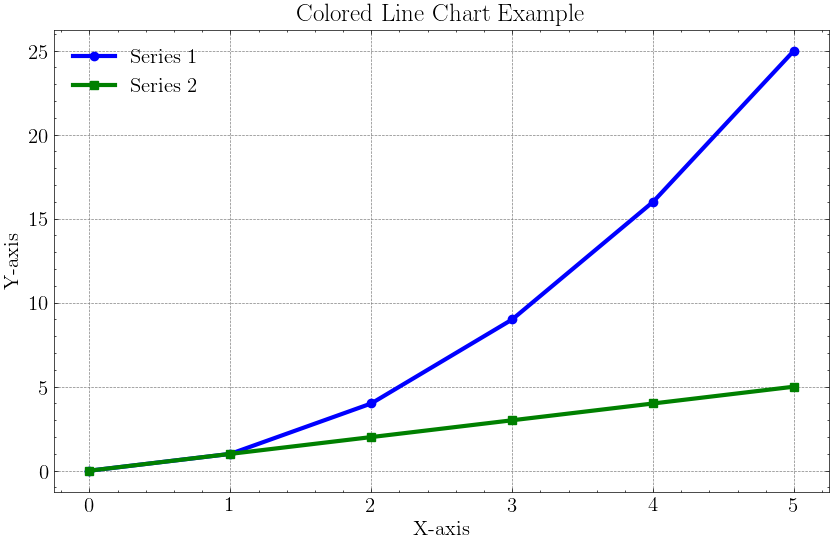

In [6]:
import matplotlib.pyplot as plt

# 示例数据
x = [0, 1, 2, 3, 4, 5]
y1 = [0, 1, 4, 9, 16, 25]
y2 = [0, 1, 2, 3, 4, 5]

plt.figure(figsize=(10, 6))

# 为每条线条使用不同的颜色
plt.plot(x, y1, label='Series 1', color='blue', marker='o')
plt.plot(x, y2, label='Series 2', color='green', marker='s')

# 添加背景网格线颜色
plt.grid(color='gray', linestyle='--', linewidth=0.5)

# 添加图例
plt.legend()

# 添加标题和标签
plt.title('Colored Line Chart Example')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# 显示图表
plt.show()

[(4102, 4), (2332, 15), (6402, 38), (2312, 40), (6302, 49), (2002, 28), (2101, 94), (4202, 89), (4101, 13), (3002, 1), (2311, 50), (7012, 111), (4021, 32), (4201, 72), (8212, 75), (4112, 93), (2331, 5), (2402, 87), (7101, 76), (2612, 85)]
[4, 15, 38, 40, 49, 28, 94, 89, 13, 1, 50, 111, 32, 72, 75, 93, 5, 87, 76, 85]


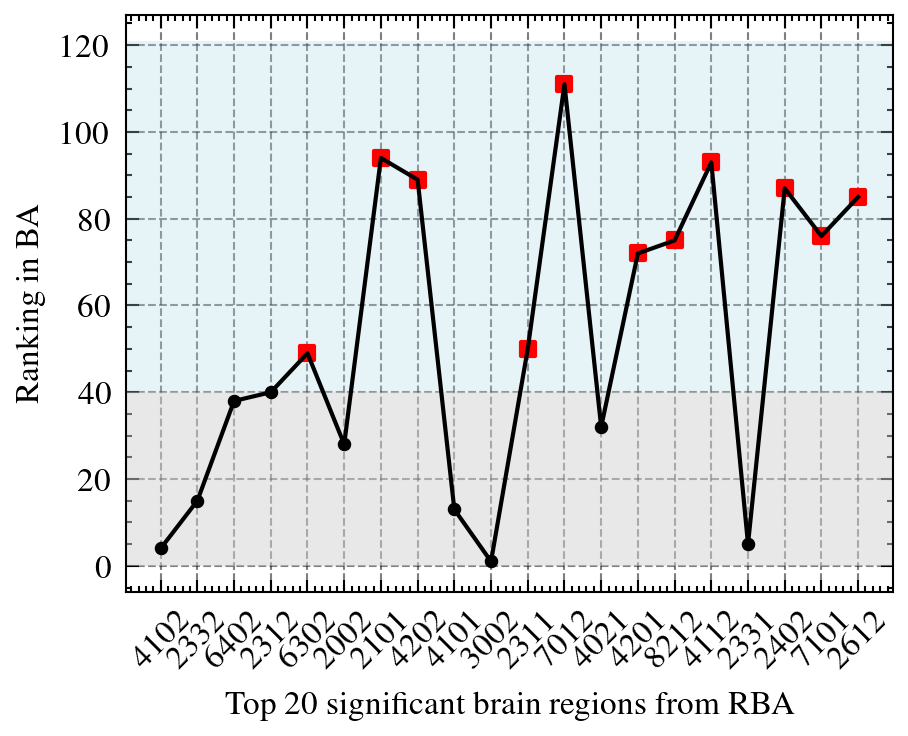

In [4]:
import matplotlib.pyplot as plt
import scienceplots
import numpy as np
# dan = [3002.0, 6102.0, 9170.0, 4102.0, 2331.0, 9110.0, 2302.0, 9130.0, 5102.0, 9140.0, 4001.0, 2601.0, 4101.0, 6301.0, 2332.0, 5101.0, 5011.0, 2501.0, 5001.0, 6202.0, 6222.0, 9120.0, 9012.0, 5302.0, 6101.0, 6002.0, 9052.0, 2002.0, 6211.0, 2401.0, 6001.0, 4021.0, 9100.0, 2611.0, 4011.0, 9082.0, 4111.0, 6402.0, 6201.0, 2312.0, 5202.0, 6401.0, 5201.0, 8302.0, 8121.0, 8202.0, 6212.0, 9002.0, 6302.0, 2311.0, 3001.0, 8112.0, 9021.0, 2322.0, 2321.0, 5401.0, 8122.0, 2102.0, 9011.0, 5021.0, 6221.0, 4012.0, 4002.0, 2301.0, 7001.0, 2202.0, 5002.0, 8201.0, 9150.0, 5012.0, 8301.0, 4201.0, 9032.0, 2001.0, 8212.0, 7101.0, 2201.0, 2502.0, 2701.0, 5402.0, 9001.0, 9042.0, 2212.0, 9022.0, 2612.0, 8111.0, 2402.0, 5022.0, 4202.0, 5301.0, 9071.0, 2112.0, 4112.0, 2101.0, 8102.0, 9031.0, 9072.0, 9081.0, 9041.0, 8211.0, 4022.0, 2211.0, 2602.0, 2702.0, 2111.0, 9062.0, 9160.0, 8101.0, 9061.0, 9051.0, 7012.0, 7002.0, 7011.0, 7021.0, 7022.0, 7102.0]
# overall = [4102,2332,6402,2312,6302,2002,2101,4202,4101,3002,2311,7012,4021,4201,8212,4112,2331,2402,7101,2612,2102,8102,2321,2211,4011,8201,6202,8302,2302,5102,9140,8301,5012,8122,5402,2611,4111,2401,3001,6002,5002,4012,2322,2301,2701,7102,2111,5021,6221,2702,6222,5201,2112,5401,4022,6212,4002,2202,9051,7001,2501,2602,4001,5101,7002,9001,2601,2201,9062,2502,6201,8202,6001,9130,9071,6401,6102,9012,9031,9042,9081,5202,5001,9082,9011,7011,8211,2212,6211,9041,9072,5302,9170,6101,6301,9110,8121,5022,8112,5011,7021,9002,9061,2001,8101,7022,9100,9021,5301,9120,9022,9150,8111,9052,9160,9032]
# dan = [int(x) for x in dan]

#AD和MCI共有脑区 4101 4102 2002 4201 4202 2332 7012 4021 4112 7101

#MCI
overall = [3002.0, 6102.0, 9170.0, 4102.0, 2331.0, 9110.0, 2302.0, 9130.0, 5102.0, 9140.0, 4001.0, 2601.0, 4101.0, 6301.0, 2332.0, 5101.0, 5011.0, 2501.0, 5001.0, 6202.0, 6222.0, 9120.0, 9012.0, 5302.0, 6101.0, 6002.0, 9052.0, 2002.0, 6211.0, 2401.0, 6001.0, 4021.0, 9100.0, 2611.0, 4011.0, 9082.0, 4111.0, 6402.0, 6201.0, 2312.0, 5202.0, 6401.0, 5201.0, 8302.0, 8121.0, 8202.0, 6212.0, 9002.0, 6302.0, 2311.0, 3001.0, 8112.0, 9021.0, 2322.0, 2321.0, 5401.0, 8122.0, 2102.0, 9011.0, 5021.0, 6221.0, 4012.0, 4002.0, 2301.0, 7001.0, 2202.0, 5002.0, 8201.0, 9150.0, 5012.0, 8301.0, 4201.0, 9032.0, 2001.0, 8212.0, 7101.0, 2201.0, 2502.0, 2701.0, 5402.0, 9001.0, 9042.0, 2212.0, 9022.0, 2612.0, 8111.0, 2402.0, 5022.0, 4202.0, 5301.0, 9071.0, 2112.0, 4112.0, 2101.0, 8102.0, 9031.0, 9072.0, 9081.0, 9041.0, 8211.0, 4022.0, 2211.0, 2602.0, 2702.0, 2111.0, 9062.0, 9160.0, 8101.0, 9061.0, 9051.0, 7012.0, 7002.0, 7011.0, 7021.0, 7022.0, 7102.0]
dan = [4102,2332,6402,2312,6302,2002,2101,4202,4101,3002,2311,7012,4021,4201,8212,4112,2331,2402,7101,2612,2102,8102,2321,2211,4011,8201,6202,8302,2302,5102,9140,8301,5012,8122,5402,2611,4111,2401,3001,6002,5002,4012,2322,2301,2701,7102,2111,5021,6221,2702,6222,5201,2112,5401,4022,6212,4002,2202,9051,7001,2501,2602,4001,5101,7002,9001,2601,2201,9062,2502,6201,8202,6001,9130,9071,6401,6102,9012,9031,9042,9081,5202,5001,9082,9011,7011,8211,2212,6211,9041,9072,5302,9170,6101,6301,9110,8121,5022,8112,5011,7021,9002,9061,2001,8101,7022,9100,9021,5301,9120,9022,9150,8111,9052,9160,9032]
overall = [int(x) for x in overall]

#AD
# overall = [9170.0, 9081.0, 9100.0, 9110.0, 8102.0, 2331.0, 4102.0, 2332.0, 3002.0, 9051.0, 4001.0, 2111.0, 4111.0, 8301.0, 6202.0, 8211.0, 2321.0, 4112.0, 6402.0, 2302.0, 4002.0, 6212.0, 2601.0, 6001.0, 8121.0, 2401.0, 6102.0, 3001.0, 2311.0, 4101.0, 2701.0, 2212.0, 2301.0, 9082.0, 8112.0, 2502.0, 5402.0, 6211.0, 2322.0, 2211.0, 2501.0, 8302.0, 6302.0, 8212.0, 2602.0, 8122.0, 5001.0, 6101.0, 2112.0, 6301.0, 2201.0, 2402.0, 5022.0, 6201.0, 8201.0, 2702.0, 6002.0, 7002.0, 9052.0, 9072.0, 6222.0, 4012.0, 2101.0, 5021.0, 9022.0, 5401.0, 8111.0, 5002.0, 4011.0, 5012.0, 5011.0, 8202.0, 2002.0, 6221.0, 2102.0, 5102.0, 9021.0, 2001.0, 2312.0, 9120.0, 2612.0, 9071.0, 9130.0, 4202.0, 6401.0, 9062.0, 2202.0, 9061.0, 7001.0, 2611.0, 9001.0, 8101.0, 5301.0, 9011.0, 5302.0, 5101.0, 4021.0, 9012.0, 5202.0, 5201.0, 9002.0, 9031.0, 9140.0, 9032.0, 9041.0, 4201.0, 4022.0, 9160.0, 9042.0, 7101.0, 9150.0, 7012.0, 7011.0, 7022.0, 7021.0, 7102.0]
# dan = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
# overall = [int(x) for x in overall]
threshold = 40

#SZ
# overall = [9140.0, 9100.0, 9110.0, 2331.0, 3001.0, 2301.0, 2111.0, 2702.0, 2311.0, 8301.0, 3002.0, 2321.0, 2201.0, 2332.0, 2612.0, 2101.0, 6211.0, 8201.0, 2211.0, 2602.0, 2502.0, 9170.0, 4002.0, 4012.0, 2402.0, 9130.0, 6001.0, 4001.0, 6221.0, 2601.0, 4102.0, 5301.0, 6201.0, 6402.0, 2701.0, 6202.0, 2302.0, 4112.0, 2001.0, 2401.0, 5001.0, 8102.0, 2501.0, 5402.0, 5201.0, 9150.0, 6212.0, 9120.0, 5022.0, 2202.0, 6302.0, 2002.0, 8111.0, 2102.0, 6101.0, 4101.0, 4202.0, 9001.0, 9072.0, 5401.0, 2312.0, 8302.0, 8112.0, 6002.0, 5011.0, 4011.0, 9021.0, 9022.0, 8122.0, 5021.0, 6102.0, 7002.0, 6301.0, 2322.0, 9011.0, 5012.0, 9041.0, 9160.0, 5002.0, 4111.0, 9031.0, 8202.0, 2611.0, 9012.0, 6401.0, 2212.0, 8211.0, 9002.0, 6222.0, 4022.0, 9042.0, 8121.0, 9052.0, 8101.0, 4201.0, 9032.0, 5101.0, 2112.0, 4021.0, 9071.0, 9062.0, 9061.0, 8212.0, 5302.0, 7011.0, 9051.0, 5102.0, 7012.0, 7001.0, 5202.0, 7021.0, 7022.0, 7102.0, 9081.0, 9082.0, 7101.0]
# dan = [4002,2331,4001,2302,2401,2332,2602,8111,2601,2312,8102,2322,6211,2112,7012,2611,3001,2211,2311,7001,2212,2201,6222,8122,2002,2702,4012,2301,2612,7002,3002,9062,6212,2102,8201,2402,2001,8101,2101,6002,4102,6401,2501,6102,4011,4112,8211,7101,7011,2502,2202,4021,5301,8202,2321,9001,7102,8121,2111,7021,6302,9032,6101,5022,5021,5302,4022,9011,2701,8112,4111,5401,9082,5001,8302,6001,4101,9160,5002,6221,9081,4202,5011,9072,5402,8212,6201,9051,4201,7022,9061,6402,6301,5201,9110,9140,6202,9170,8301,9071,9052,9042,9150,9021,5102,5202,9022,9012,5101,9002,9031,5012,9041,9100,9130,9120]
# overall = [int(x) for x in overall]
# 中央沟盖 脑岛 岛盖部额下回 眶部额上回 回直肌 三角部额下回 颞下回 眶部额下回 额中回

#PD
# overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
# dan = [4011,2302,7012,4001,6301,2001,8111,7101,8301,4002,2331,4102,9110,6302,2501,8212,2612,2601,8122,3001,6001,9042,2401,4012,2301,7011,6401,8102,5011,7102,8121,6221,9001,8101,4201,4101,5402,4202,2602,2322,9170,9061,6212,7001,9002,9031,2402,3002,2102,2002,2312,8202,2332,5301,5001,5002,6201,9150,4022,2201,9012,2202,8211,4112,5201,7022,9071,5401,9062,9032,5022,4021,5021,9140,5012,4111,2321,2212,6211,9120,7021,9041,2502,2611,9081,9022,9100,2101,9160,8112,6102,9021,6101,7002,2112,2211,5302,9082,6222,5101,2702,6002,2311,6202,9130,9051,2701,9052,8201,2111,8302,6402,5102,5202,9011,9072]
# overall = [int(x) for x in overall]
#眶部额中回 眶部额上回 脑岛 中央沟盖 颞下回 眶部额下回 回直肌


# 为每个点设置颜色
# overall = np.array(overall)
# dan = np.array(dan)

# 创建映射从编号到在overall列表中的索引
overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# 提取dan列表的前20个脑区编号
top_20_dan = dan[:20]

# 找出这些脑区在overall中的索引位置
top_20_overall_indices = [overall_index_map[num]+1 for num in top_20_dan if num in overall_index_map]
print(list(zip(top_20_dan,top_20_overall_indices)))
print(top_20_overall_indices)
top_20_dan = [str(x) for x in top_20_dan]

colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]

top_20_overall_indices = np.array(top_20_overall_indices)
plt.style.use(['science','ieee','grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]}) 
# plt.rcParams['font.size'] = 16  # 你可以根据需要调整这里的数字
# plt.style.use(['science','vibrant'])
# plt.rcParams['font.weight'] = 'bold'
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titleweight'] = 'bold'
# plt.rcParams['font.family'] = t[0]
# plt.rcParams['axes.titleweight'] = 'bold'

# 设置全局线条宽度
plt.rcParams['lines.linewidth'] = 1  # 

plt.axhspan(0, threshold, facecolor='lightgrey', alpha=0.5)
plt.axhspan(threshold, max(top_20_overall_indices)+10, facecolor='lightblue', alpha=0.3)
# 绘制累积差异曲线图
# plt.figure(figsize=(6, 4))
plt.plot(top_20_dan, top_20_overall_indices, linestyle='-')

above_threshold = top_20_overall_indices > threshold
plt.scatter(np.array(top_20_dan)[above_threshold], top_20_overall_indices[above_threshold],
            color='red', s=10, marker='s', label='Above Threshold')  # 使用三角形表示

# 绘制不大于阈值的点
below_threshold = np.logical_not(above_threshold)
plt.scatter(np.array(top_20_dan)[below_threshold], top_20_overall_indices[below_threshold],
            color='black', s=5, marker='o', label='Below Threshold') 


# plt.title('Cumulative Rank Difference Curve for Top 20 Brain Regions in Dan')
plt.xlabel('Top 20 significant brain regions from RBA')
plt.ylabel('Ranking in BA')
plt.xticks(rotation=45)  # Rotate labels for better visibility
plt.savefig(f"figures/MCIF.png",dpi=300, pad_inches=0)
plt.show()


#MCI 6302 2101 4202 2311 7012 4201 8212 4112 2402 7101 2612
#AD  2002 7101 4201 4021 7102 7012 2312 5002 2612 
#SZ  8111 2312 8102 2322 2112 7012 2611 7001
#PD  7012 6301 2001 8111 7101 4002 9110 6302 2612 8122 3001

默认图形大小: [3.3, 2.5]
默认字体大小: 10.0


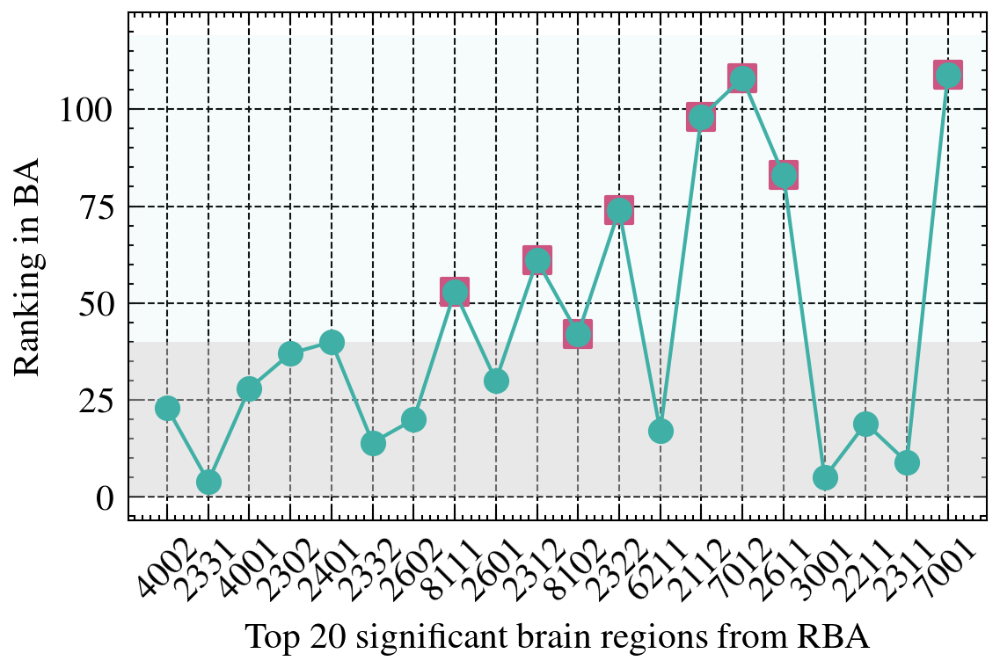

In [101]:
import numpy as np
import scienceplots
import matplotlib.pyplot as plt

#MCI
# overall = [3002.0, 6102.0, 9170.0, 4102.0, 2331.0, 9110.0, 2302.0, 9130.0, 5102.0, 9140.0, 4001.0, 2601.0, 4101.0, 6301.0, 2332.0, 5101.0, 5011.0, 2501.0, 5001.0, 6202.0, 6222.0, 9120.0, 9012.0, 5302.0, 6101.0, 6002.0, 9052.0, 2002.0, 6211.0, 2401.0, 6001.0, 4021.0, 9100.0, 2611.0, 4011.0, 9082.0, 4111.0, 6402.0, 6201.0, 2312.0, 5202.0, 6401.0, 5201.0, 8302.0, 8121.0, 8202.0, 6212.0, 9002.0, 6302.0, 2311.0, 3001.0, 8112.0, 9021.0, 2322.0, 2321.0, 5401.0, 8122.0, 2102.0, 9011.0, 5021.0, 6221.0, 4012.0, 4002.0, 2301.0, 7001.0, 2202.0, 5002.0, 8201.0, 9150.0, 5012.0, 8301.0, 4201.0, 9032.0, 2001.0, 8212.0, 7101.0, 2201.0, 2502.0, 2701.0, 5402.0, 9001.0, 9042.0, 2212.0, 9022.0, 2612.0, 8111.0, 2402.0, 5022.0, 4202.0, 5301.0, 9071.0, 2112.0, 4112.0, 2101.0, 8102.0, 9031.0, 9072.0, 9081.0, 9041.0, 8211.0, 4022.0, 2211.0, 2602.0, 2702.0, 2111.0, 9062.0, 9160.0, 8101.0, 9061.0, 9051.0, 7012.0, 7002.0, 7011.0, 7021.0, 7022.0, 7102.0]
# dan = [4102,2332,6402,2312,6302,2002,2101,4202,4101,3002,2311,7012,4021,4201,8212,4112,2331,2402,7101,2612,2102,8102,2321,2211,4011,8201,6202,8302,2302,5102,9140,8301,5012,8122,5402,2611,4111,2401,3001,6002,5002,4012,2322,2301,2701,7102,2111,5021,6221,2702,6222,5201,2112,5401,4022,6212,4002,2202,9051,7001,2501,2602,4001,5101,7002,9001,2601,2201,9062,2502,6201,8202,6001,9130,9071,6401,6102,9012,9031,9042,9081,5202,5001,9082,9011,7011,8211,2212,6211,9041,9072,5302,9170,6101,6301,9110,8121,5022,8112,5011,7021,9002,9061,2001,8101,7022,9100,9021,5301,9120,9022,9150,8111,9052,9160,9032]
# overall = [int(x) for x in overall]

#AD
# overall = [9170.0, 9081.0, 9100.0, 9110.0, 8102.0, 2331.0, 4102.0, 2332.0, 3002.0, 9051.0, 4001.0, 2111.0, 4111.0, 8301.0, 6202.0, 8211.0, 2321.0, 4112.0, 6402.0, 2302.0, 4002.0, 6212.0, 2601.0, 6001.0, 8121.0, 2401.0, 6102.0, 3001.0, 2311.0, 4101.0, 2701.0, 2212.0, 2301.0, 9082.0, 8112.0, 2502.0, 5402.0, 6211.0, 2322.0, 2211.0, 2501.0, 8302.0, 6302.0, 8212.0, 2602.0, 8122.0, 5001.0, 6101.0, 2112.0, 6301.0, 2201.0, 2402.0, 5022.0, 6201.0, 8201.0, 2702.0, 6002.0, 7002.0, 9052.0, 9072.0, 6222.0, 4012.0, 2101.0, 5021.0, 9022.0, 5401.0, 8111.0, 5002.0, 4011.0, 5012.0, 5011.0, 8202.0, 2002.0, 6221.0, 2102.0, 5102.0, 9021.0, 2001.0, 2312.0, 9120.0, 2612.0, 9071.0, 9130.0, 4202.0, 6401.0, 9062.0, 2202.0, 9061.0, 7001.0, 2611.0, 9001.0, 8101.0, 5301.0, 9011.0, 5302.0, 5101.0, 4021.0, 9012.0, 5202.0, 5201.0, 9002.0, 9031.0, 9140.0, 9032.0, 9041.0, 4201.0, 4022.0, 9160.0, 9042.0, 7101.0, 9150.0, 7012.0, 7011.0, 7022.0, 7021.0, 7102.0]
# dan = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
# overall = [int(x) for x in overall]
threshold = 40

#SZ
overall = [9140.0, 9100.0, 9110.0, 2331.0, 3001.0, 2301.0, 2111.0, 2702.0, 2311.0, 8301.0, 3002.0, 2321.0, 2201.0, 2332.0, 2612.0, 2101.0, 6211.0, 8201.0, 2211.0, 2602.0, 2502.0, 9170.0, 4002.0, 4012.0, 2402.0, 9130.0, 6001.0, 4001.0, 6221.0, 2601.0, 4102.0, 5301.0, 6201.0, 6402.0, 2701.0, 6202.0, 2302.0, 4112.0, 2001.0, 2401.0, 5001.0, 8102.0, 2501.0, 5402.0, 5201.0, 9150.0, 6212.0, 9120.0, 5022.0, 2202.0, 6302.0, 2002.0, 8111.0, 2102.0, 6101.0, 4101.0, 4202.0, 9001.0, 9072.0, 5401.0, 2312.0, 8302.0, 8112.0, 6002.0, 5011.0, 4011.0, 9021.0, 9022.0, 8122.0, 5021.0, 6102.0, 7002.0, 6301.0, 2322.0, 9011.0, 5012.0, 9041.0, 9160.0, 5002.0, 4111.0, 9031.0, 8202.0, 2611.0, 9012.0, 6401.0, 2212.0, 8211.0, 9002.0, 6222.0, 4022.0, 9042.0, 8121.0, 9052.0, 8101.0, 4201.0, 9032.0, 5101.0, 2112.0, 4021.0, 9071.0, 9062.0, 9061.0, 8212.0, 5302.0, 7011.0, 9051.0, 5102.0, 7012.0, 7001.0, 5202.0, 7021.0, 7022.0, 7102.0, 9081.0, 9082.0, 7101.0]
dan = [4002,2331,4001,2302,2401,2332,2602,8111,2601,2312,8102,2322,6211,2112,7012,2611,3001,2211,2311,7001,2212,2201,6222,8122,2002,2702,4012,2301,2612,7002,3002,9062,6212,2102,8201,2402,2001,8101,2101,6002,4102,6401,2501,6102,4011,4112,8211,7101,7011,2502,2202,4021,5301,8202,2321,9001,7102,8121,2111,7021,6302,9032,6101,5022,5021,5302,4022,9011,2701,8112,4111,5401,9082,5001,8302,6001,4101,9160,5002,6221,9081,4202,5011,9072,5402,8212,6201,9051,4201,7022,9061,6402,6301,5201,9110,9140,6202,9170,8301,9071,9052,9042,9150,9021,5102,5202,9022,9012,5101,9002,9031,5012,9041,9100,9130,9120]
overall = [int(x) for x in overall]
# 中央沟盖 脑岛 岛盖部额下回 眶部额上回 回直肌 三角部额下回 颞下回 眶部额下回 额中回

#PD
# overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
# dan = [4011,2302,7012,4001,6301,2001,8111,7101,8301,4002,2331,4102,9110,6302,2501,8212,2612,2601,8122,3001,6001,9042,2401,4012,2301,7011,6401,8102,5011,7102,8121,6221,9001,8101,4201,4101,5402,4202,2602,2322,9170,9061,6212,7001,9002,9031,2402,3002,2102,2002,2312,8202,2332,5301,5001,5002,6201,9150,4022,2201,9012,2202,8211,4112,5201,7022,9071,5401,9062,9032,5022,4021,5021,9140,5012,4111,2321,2212,6211,9120,7021,9041,2502,2611,9081,9022,9100,2101,9160,8112,6102,9021,6101,7002,2112,2211,5302,9082,6222,5101,2702,6002,2311,6202,9130,9051,2701,9052,8201,2111,8302,6402,5102,5202,9011,9072]
# overall = [int(x) for x in overall]

overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# 提取dan列表的前20个脑区编号
top_20_dan = dan[:20]

# 找出这些脑区在overall中的索引位置
top_20_overall_indices = [overall_index_map[num]+1 for num in top_20_dan if num in overall_index_map]

# 设置颜色
top_20_overall_indices = np.array(top_20_overall_indices)
colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]

plt.style.use(['science','ieee','grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]}) 
plt.rcParams['font.size'] = 10  # 你可以根据需要调整这里的数字
# plt.style.use(['science','vibrant'])
# plt.rcParams['font.weight'] = 'bold'
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titleweight'] = 'bold'
# plt.rcParams['font.family'] = t[0]
# plt.rcParams['axes.titleweight'] = 'bold'

# 设置全局线条宽度
plt.rcParams['lines.linewidth'] = 1  # 
plt.figure(figsize=(4.2, 2.5)) 
default_figsize = plt.rcParams['figure.figsize']
fontsize = plt.rcParams['font.size']
print("默认图形大小:", default_figsize)
print("默认字体大小:", fontsize)
# 绘图
# plt.figure(figsize=(12, 6))
top_20_dan = dan[:20]
top_20_dan = [str(x) for x in top_20_dan]
# 添加背景区域
plt.axhspan(0, threshold, facecolor='lightgrey', alpha=0.5)
plt.axhspan(threshold, max(top_20_overall_indices)+10, facecolor='lightblue', alpha=0.1)

# 绘制折线图
plt.plot(top_20_dan, top_20_overall_indices, linestyle='-', marker='o', color='#40B0A6', label='Cumulative Rank Difference')

# 绘制超过阈值的点
above_threshold = np.array(top_20_overall_indices) > threshold
plt.scatter(np.array(top_20_dan)[above_threshold], np.array(top_20_overall_indices)[above_threshold],
            color='#CD5582', s=50, marker='s', label='Above Threshold')

# 绘制不超过阈值的点
below_threshold = ~above_threshold
plt.scatter(np.array(top_20_dan)[below_threshold], np.array(top_20_overall_indices)[below_threshold],
            color='black', s=5, marker='o', label='Below Threshold')

# 添加注释
# for i, txt in enumerate(top_20_dan):
#     plt.annotate(txt, (dan[i], top_20_overall_indices[i]), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

# 添加网格
plt.grid(True, linestyle='--', alpha=1)

# 添加标题和标签
# plt.title('Cumulative Rank Difference Curve for Top 20 Brain Regions in Dan', fontsize=14)
plt.xlabel('Top 20 significant brain regions from RBA')
plt.ylabel('Ranking in BA')
plt.xticks(rotation=45)

# 添加图例
# plt.legend()
# custom_colors = [
#     "#40B0A6",  # muted blue
#     "#E1BE6A",  # safety orange
#     "#A38E89",  # cooked asparagus green
#     "#CC141E",  # brick red
#     "#CD5582",  # muted purple
#     "#6E579A",  # chestnut brown
#     "#6D8EF7",  # raspberry yogurt pink
#     "#EC6B2D",  # middle gray
#     "#A5C8DD",  # curry yellow-green
#     "#E89A7A",  # blue-teal
#     "#FFECC2"
#     # ... add more colors as needed ...
# ]

# 保存图表
plt.savefig(f"figures/SZF.png", dpi=300, bbox_inches='tight')

# 显示图表
plt.show()


['4011', '2302', '7012', '4001', '6301', '2001', '8111', '7101', '8301', '4002', '2331', '4102', '9110', '6302', '2501', '8212', '2612', '2601', '8122', '3001']
默认图形大小: [3.3, 2.5]
默认字体大小: 11.0


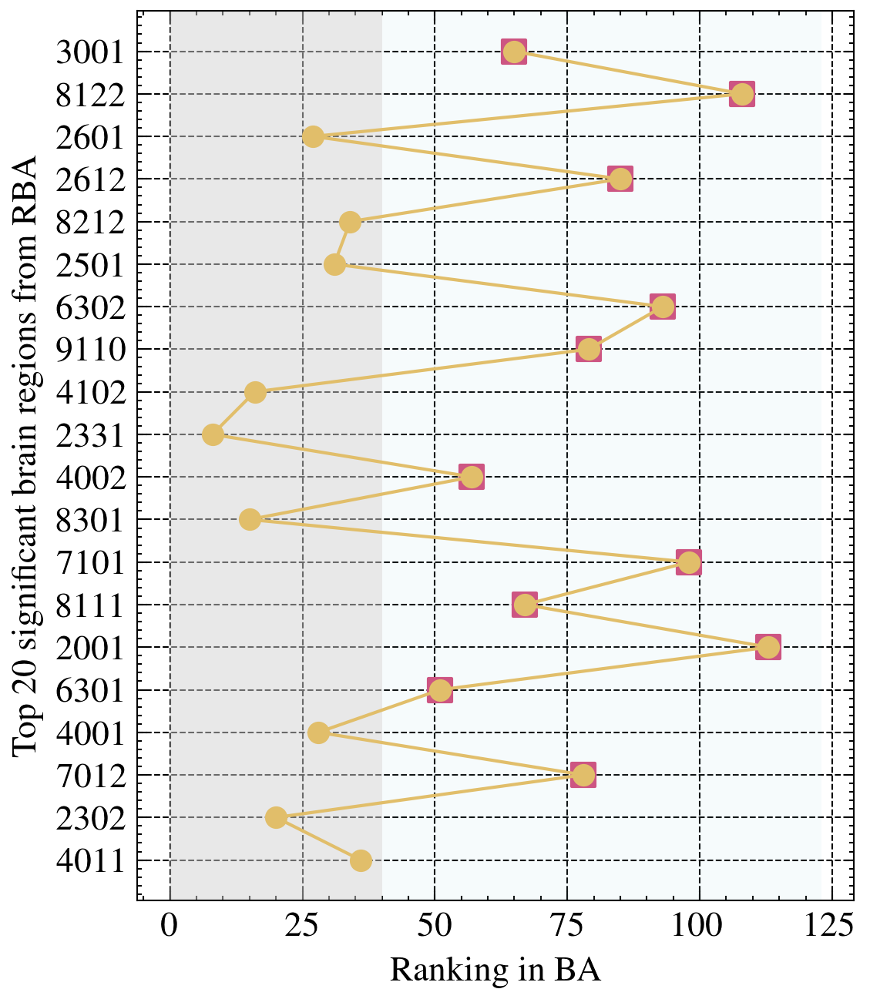

In [114]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
import pandas as pd

def map_id_to_name(i,mapping_table):  
    return str(mapping_table[mapping_table['Mricro'] == i]['English'].values[0]) 
a = pd.read_excel("Corrected_Translated_Book1.xlsx")

# Data
overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
dan = [4011, 2302, 7012, 4001, 6301, 2001, 8111, 7101, 8301, 4002, 2331, 4102, 9110, 6302, 2501, 8212, 2612, 2601, 8122, 3001, 6001, 9042, 2401, 4012, 2301, 7011, 6401, 8102, 5011, 7102, 8121, 6221, 9001, 8101, 4201, 4101, 5402, 4202, 2602, 2322, 9170, 9061, 6212, 7001, 9002, 9031, 2402, 3002, 2102, 2002, 2312, 8202, 2332, 5301, 5001, 5002, 6201, 9150, 4022, 2201, 9012, 2202, 8211, 4112, 5201, 7022, 9071, 5401, 9062, 9032, 5022, 4021, 5021, 9140, 5012, 4111, 2321, 2212, 6211, 9120, 7021, 9041, 2502, 2611, 9081, 9022, 9100, 2101, 9160, 8112, 6102, 9021, 6101, 7002, 2112, 2211, 5302, 9082, 6222, 5101, 2702, 6002, 2311, 6202, 9130, 9051, 2701, 9052, 8201, 2111, 8302, 6402, 5102, 5202, 9011, 9072]
strs = []
for j in dan:
    mapped_names = map_id_to_name(j,a)
    strs.append(mapped_names)
# Parameters
threshold = 40
overall = [int(x) for x in overall]

# Map overall values to their indices
overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# Extract top 20 brain regions from dan list
top_20_dan = dan[:20]



# Find the indices of these regions in the overall list
top_20_overall_indices = [overall_index_map[num]+1 for num in top_20_dan]

# Set colors
top_20_overall_indices = np.array(top_20_overall_indices)
colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]

plt.style.use(['science','ieee','grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]}) 
plt.rcParams['font.size'] = 11
# Global line width setting
plt.rcParams['lines.linewidth'] = 1

# Invert x and y arrays
at = strs[:20]
top_20_dan = [str(x) for x in top_20_dan]
print(top_20_dan)
plt.figure(figsize=(4, 5)) 
default_figsize = plt.rcParams['figure.figsize']
fontsize = plt.rcParams['font.size']
print("默认图形大小:", default_figsize)
print("默认字体大小:", fontsize)

plt.axvspan(0, threshold, facecolor='lightgrey', alpha=0.5)
plt.axvspan(threshold, max(top_20_overall_indices)+10, facecolor='lightblue', alpha=0.1)

# Plot with inverted axes
plt.plot(top_20_overall_indices, top_20_dan, linestyle='-', marker='o', color='#E1BE6A', label='Cumulative Rank Difference')

# Points above threshold
above_threshold = np.array(top_20_overall_indices) > threshold
plt.scatter(np.array(top_20_overall_indices)[above_threshold], np.array(top_20_dan)[above_threshold],
            color='#CD5582', s=50, marker='s', label='Above Threshold')

# Points below threshold
below_threshold = ~above_threshold
# plt.scatter(np.array(top_20_overall_indices)[below_threshold], np.array(top_20_dan)[below_threshold],
#             color='black', s=5, marker='o', label='Below Threshold')

# Annotations
# for i, txt in enumerate(at):
#     plt.annotate(txt, (top_20_overall_indices[i], top_20_dan[i]), textcoords="offset points", xytext=(0,5), ha='center', fontsize=4)

# Grid
plt.grid(True, linestyle='--', alpha=1)

# Labels and ticks
plt.xlabel('Ranking in BA')
plt.ylabel('Top 20 significant brain regions from RBA')
plt.yticks()

# Save and show plot
# custom_colors = [
#     "#40B0A6",  # muted blue
#     "#E1BE6A",  # safety orange
#     "#A38E89",  # cooked asparagus green
#     "#CC141E",  # brick red
#     "#CD5582",  # muted purple
#     "#6E579A",  # chestnut brown
#     "#6D8EF7",  # raspberry yogurt pink
#     "#EC6B2D",  # middle gray
#     "#A5C8DD",  # curry yellow-green
#     "#E89A7A",  # blue-teal
#     "#FFECC2"
#     # ... add more colors as needed ...
# ]
# plt.savefig(f"figures/PDF_inverted_axes.png", dpi=300, bbox_inches='tight')
plt.savefig(f"figures/PDF.png", dpi=300, bbox_inches='tight')
plt.show()


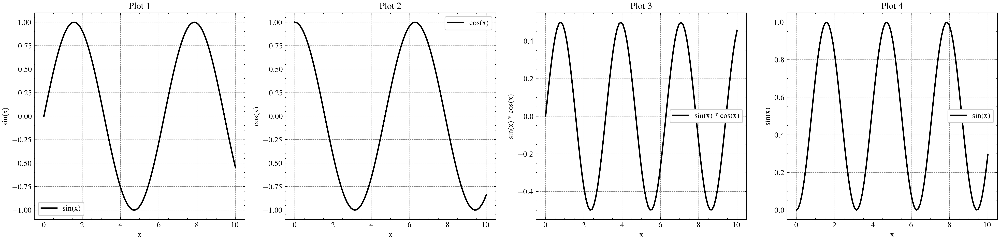

In [51]:
import matplotlib.pyplot as plt
import numpy as np

# 示例数据
x = np.linspace(0, 10, 100)
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.sin(x) * np.cos(x)
y4 = np.sin(x) ** 2

# 创建一个1行4列的子图布局
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# 第一个折线图
axs[0].plot(x, y1, label='sin(x)')
axs[0].set_title('Plot 1')
axs[0].set_xlabel('x')
axs[0].set_ylabel('sin(x)')
axs[0].legend()

# 第二个折线图
axs[1].plot(x, y2, label='cos(x)')
axs[1].set_title('Plot 2')
axs[1].set_xlabel('x')
axs[1].set_ylabel('cos(x)')
axs[1].legend()

# 第三个折线图
axs[2].plot(x, y3, label='sin(x) * cos(x)')
axs[2].set_title('Plot 3')
axs[2].set_xlabel('x')
axs[2].set_ylabel('sin(x) * cos(x)')
axs[2].legend()

# 第四个折线图
axs[3].plot(x, y4, label='sin(x)')
axs[3].set_title('Plot 4')
axs[3].set_xlabel('x')
axs[3].set_ylabel('sin(x)')
axs[3].legend()

# 调整子图之间的间距
plt.tight_layout()

# 显示图形
plt.show()


['4011', '2302', '7012', '4001', '6301', '2001', '8111', '7101', '8301', '4002', '2331', '4102', '9110', '6302', '2501', '8212', '2612', '2601', '8122', '3001']
默认图形大小: [3.3, 2.5]
默认字体大小: 11.0
Default subplots_adjust settings:
left: 0.125
right: 0.9
bottom: 0.11
top: 0.88
wspace: 0.2
hspace: 0.2


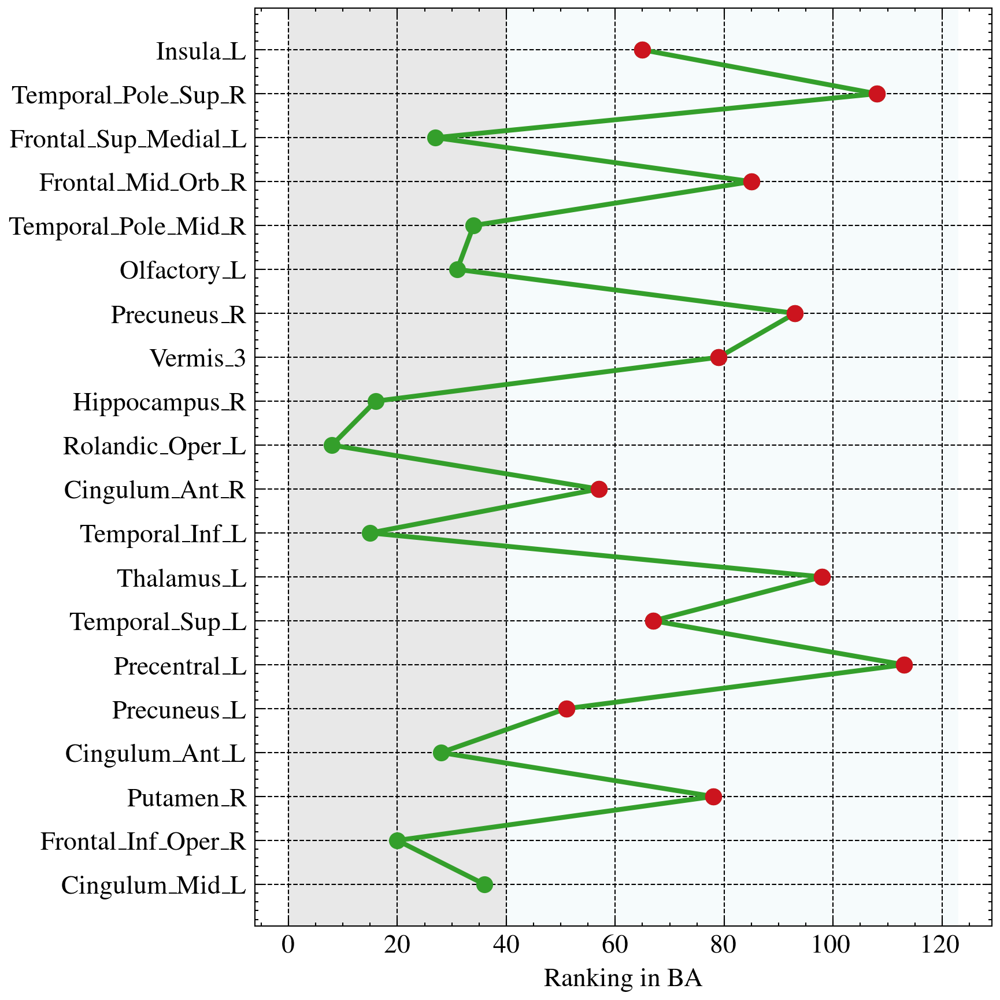

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
import pandas as pd
import re


def map_id_to_name(i,mapping_table):  
    return str(mapping_table[mapping_table['Mricro'] == i]['Mricro命名'].values[0]) 
a = pd.read_excel("Corrected_Translated_Book1.xlsx")

strs = []
#MCI
# overall = [3002.0, 6102.0, 9170.0, 4102.0, 2331.0, 9110.0, 2302.0, 9130.0, 5102.0, 9140.0, 4001.0, 2601.0, 4101.0, 6301.0, 2332.0, 5101.0, 5011.0, 2501.0, 5001.0, 6202.0, 6222.0, 9120.0, 9012.0, 5302.0, 6101.0, 6002.0, 9052.0, 2002.0, 6211.0, 2401.0, 6001.0, 4021.0, 9100.0, 2611.0, 4011.0, 9082.0, 4111.0, 6402.0, 6201.0, 2312.0, 5202.0, 6401.0, 5201.0, 8302.0, 8121.0, 8202.0, 6212.0, 9002.0, 6302.0, 2311.0, 3001.0, 8112.0, 9021.0, 2322.0, 2321.0, 5401.0, 8122.0, 2102.0, 9011.0, 5021.0, 6221.0, 4012.0, 4002.0, 2301.0, 7001.0, 2202.0, 5002.0, 8201.0, 9150.0, 5012.0, 8301.0, 4201.0, 9032.0, 2001.0, 8212.0, 7101.0, 2201.0, 2502.0, 2701.0, 5402.0, 9001.0, 9042.0, 2212.0, 9022.0, 2612.0, 8111.0, 2402.0, 5022.0, 4202.0, 5301.0, 9071.0, 2112.0, 4112.0, 2101.0, 8102.0, 9031.0, 9072.0, 9081.0, 9041.0, 8211.0, 4022.0, 2211.0, 2602.0, 2702.0, 2111.0, 9062.0, 9160.0, 8101.0, 9061.0, 9051.0, 7012.0, 7002.0, 7011.0, 7021.0, 7022.0, 7102.0]
# dan = [4102,2332,6402,2312,6302,2002,2101,4202,4101,3002,2311,7012,4021,4201,8212,4112,2331,2402,7101,2612,2102,8102,2321,2211,4011,8201,6202,8302,2302,5102,9140,8301,5012,8122,5402,2611,4111,2401,3001,6002,5002,4012,2322,2301,2701,7102,2111,5021,6221,2702,6222,5201,2112,5401,4022,6212,4002,2202,9051,7001,2501,2602,4001,5101,7002,9001,2601,2201,9062,2502,6201,8202,6001,9130,9071,6401,6102,9012,9031,9042,9081,5202,5001,9082,9011,7011,8211,2212,6211,9041,9072,5302,9170,6101,6301,9110,8121,5022,8112,5011,7021,9002,9061,2001,8101,7022,9100,9021,5301,9120,9022,9150,8111,9052,9160,9032]
# overall = [int(x) for x in overall]

#AD
# overall = [9170.0, 9081.0, 9100.0, 9110.0, 8102.0, 2331.0, 4102.0, 2332.0, 3002.0, 9051.0, 4001.0, 2111.0, 4111.0, 8301.0, 6202.0, 8211.0, 2321.0, 4112.0, 6402.0, 2302.0, 4002.0, 6212.0, 2601.0, 6001.0, 8121.0, 2401.0, 6102.0, 3001.0, 2311.0, 4101.0, 2701.0, 2212.0, 2301.0, 9082.0, 8112.0, 2502.0, 5402.0, 6211.0, 2322.0, 2211.0, 2501.0, 8302.0, 6302.0, 8212.0, 2602.0, 8122.0, 5001.0, 6101.0, 2112.0, 6301.0, 2201.0, 2402.0, 5022.0, 6201.0, 8201.0, 2702.0, 6002.0, 7002.0, 9052.0, 9072.0, 6222.0, 4012.0, 2101.0, 5021.0, 9022.0, 5401.0, 8111.0, 5002.0, 4011.0, 5012.0, 5011.0, 8202.0, 2002.0, 6221.0, 2102.0, 5102.0, 9021.0, 2001.0, 2312.0, 9120.0, 2612.0, 9071.0, 9130.0, 4202.0, 6401.0, 9062.0, 2202.0, 9061.0, 7001.0, 2611.0, 9001.0, 8101.0, 5301.0, 9011.0, 5302.0, 5101.0, 4021.0, 9012.0, 5202.0, 5201.0, 9002.0, 9031.0, 9140.0, 9032.0, 9041.0, 4201.0, 4022.0, 9160.0, 9042.0, 7101.0, 9150.0, 7012.0, 7011.0, 7022.0, 7021.0, 7102.0]
# dan = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
# overall = [int(x) for x in overall]
threshold = 40

#SZ
# overall = [9140.0, 9100.0, 9110.0, 2331.0, 3001.0, 2301.0, 2111.0, 2702.0, 2311.0, 8301.0, 3002.0, 2321.0, 2201.0, 2332.0, 2612.0, 2101.0, 6211.0, 8201.0, 2211.0, 2602.0, 2502.0, 9170.0, 4002.0, 4012.0, 2402.0, 9130.0, 6001.0, 4001.0, 6221.0, 2601.0, 4102.0, 5301.0, 6201.0, 6402.0, 2701.0, 6202.0, 2302.0, 4112.0, 2001.0, 2401.0, 5001.0, 8102.0, 2501.0, 5402.0, 5201.0, 9150.0, 6212.0, 9120.0, 5022.0, 2202.0, 6302.0, 2002.0, 8111.0, 2102.0, 6101.0, 4101.0, 4202.0, 9001.0, 9072.0, 5401.0, 2312.0, 8302.0, 8112.0, 6002.0, 5011.0, 4011.0, 9021.0, 9022.0, 8122.0, 5021.0, 6102.0, 7002.0, 6301.0, 2322.0, 9011.0, 5012.0, 9041.0, 9160.0, 5002.0, 4111.0, 9031.0, 8202.0, 2611.0, 9012.0, 6401.0, 2212.0, 8211.0, 9002.0, 6222.0, 4022.0, 9042.0, 8121.0, 9052.0, 8101.0, 4201.0, 9032.0, 5101.0, 2112.0, 4021.0, 9071.0, 9062.0, 9061.0, 8212.0, 5302.0, 7011.0, 9051.0, 5102.0, 7012.0, 7001.0, 5202.0, 7021.0, 7022.0, 7102.0, 9081.0, 9082.0, 7101.0]
# dan = [4002,2331,4001,2302,2401,2332,2602,8111,2601,2312,8102,2322,6211,2112,7012,2611,3001,2211,2311,7001,2212,2201,6222,8122,2002,2702,4012,2301,2612,7002,3002,9062,6212,2102,8201,2402,2001,8101,2101,6002,4102,6401,2501,6102,4011,4112,8211,7101,7011,2502,2202,4021,5301,8202,2321,9001,7102,8121,2111,7021,6302,9032,6101,5022,5021,5302,4022,9011,2701,8112,4111,5401,9082,5001,8302,6001,4101,9160,5002,6221,9081,4202,5011,9072,5402,8212,6201,9051,4201,7022,9061,6402,6301,5201,9110,9140,6202,9170,8301,9071,9052,9042,9150,9021,5102,5202,9022,9012,5101,9002,9031,5012,9041,9100,9130,9120]
# overall = [int(x) for x in overall]
# 中央沟盖 脑岛 岛盖部额下回 眶部额上回 回直肌 三角部额下回 颞下回 眶部额下回 额中回

#PD
overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
dan = [4011,2302,7012,4001,6301,2001,8111,7101,8301,4002,2331,4102,9110,6302,2501,8212,2612,2601,8122,3001,6001,9042,2401,4012,2301,7011,6401,8102,5011,7102,8121,6221,9001,8101,4201,4101,5402,4202,2602,2322,9170,9061,6212,7001,9002,9031,2402,3002,2102,2002,2312,8202,2332,5301,5001,5002,6201,9150,4022,2201,9012,2202,8211,4112,5201,7022,9071,5401,9062,9032,5022,4021,5021,9140,5012,4111,2321,2212,6211,9120,7021,9041,2502,2611,9081,9022,9100,2101,9160,8112,6102,9021,6101,7002,2112,2211,5302,9082,6222,5101,2702,6002,2311,6202,9130,9051,2701,9052,8201,2111,8302,6402,5102,5202,9011,9072]
overall = [int(x) for x in overall]

# Parameters
threshold = 40
overall = [int(x) for x in overall]

# Map overall values to their indices
overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# Extract top 20 brain regions from dan list
top_20_dan = dan[:20]



# Find the indices of these regions in the overall list
top_20_overall_indices = [overall_index_map[num]+1 for num in top_20_dan]

# Set colors
top_20_overall_indices = np.array(top_20_overall_indices)
colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]

plt.style.use(['science','ieee','grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]}) 
plt.rcParams['font.size'] = 11
# Global line width setting
plt.rcParams['lines.linewidth'] = 2

# Invert x and y arrays
at = strs[:20]

label = [map_id_to_name(i,a) for i in top_20_dan ]
top_20_dan = [str(x) for x in top_20_dan]
print(top_20_dan)
plt.figure(figsize=(6, 6)) 
default_figsize = plt.rcParams['figure.figsize']
fontsize = plt.rcParams['font.size']
print("默认图形大小:", default_figsize)
print("默认字体大小:", fontsize)

plt.axvspan(0, threshold, facecolor='lightgrey', alpha=0.5, zorder=0)
plt.axvspan(threshold, max(top_20_overall_indices)+10, facecolor='lightblue', alpha=0.1, zorder=0)

# Plot with inverted axes
plt.plot(top_20_overall_indices, top_20_dan, linestyle='-', marker='o', color='#349f2b', label='Cumulative Rank Difference',zorder=1)

# Points above threshold
above_threshold = np.array(top_20_overall_indices) > threshold
plt.scatter(np.array(top_20_overall_indices)[above_threshold], np.array(top_20_dan)[above_threshold],
            color='#CC141E', s=37, marker='o', label='Above Threshold',zorder=2)

# Points below threshold
below_threshold = ~above_threshold
# plt.scatter(np.array(top_20_overall_indices)[below_threshold], np.array(top_20_dan)[below_threshold],
#             color='black', s=5, marker='o', label='Below Threshold')

# Annotations
# for i, txt in enumerate(at):
#     plt.annotate(txt, (top_20_overall_indices[i], top_20_dan[i]), textcoords="offset points", xytext=(0,5), ha='center', fontsize=4)
# plt.yticks(range(len(at)), at)
# Grid
plt.grid(True, linestyle='--', alpha=1)

# Labels and ticks
plt.xlabel('Ranking in BA')
# plt.ylabel('Top 20 significant brain regions from RBA')
plt.yticks(range(len(top_20_dan)),label)

default_left = plt.rcParams['figure.subplot.left']
default_right = plt.rcParams['figure.subplot.right']
default_bottom = plt.rcParams['figure.subplot.bottom']
default_top = plt.rcParams['figure.subplot.top']
default_wspace = plt.rcParams['figure.subplot.wspace']
default_hspace = plt.rcParams['figure.subplot.hspace']

print(f"Default subplots_adjust settings:")
print(f"left: {default_left}")
print(f"right: {default_right}")
print(f"bottom: {default_bottom}")
print(f"top: {default_top}")
print(f"wspace: {default_wspace}")
print(f"hspace: {default_hspace}")

# Save and show plot
# custom_colors = [
#     "#40B0A6",  # muted blue
#     "#E1BE6A",  # safety orange
#     "#A38E89",  # cooked asparagus green
#     "#CC141E",  # brick red
#     "#CD5582",  # muted purple
#     "#6E579A",  # chestnut brown
#     "#6D8EF7",  # raspberry yogurt pink
#     "#EC6B2D",  # middle gray
#     "#A5C8DD",  # curry yellow-green
#     "#E89A7A",  # blue-teal
#     "#FFECC2"
#     # ... add more colors as needed ...
# ]
# plt.savefig(f"figures/PDF_inverted_axes.png", dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.savefig(f"figures/PDF.png", dpi=300,)
plt.show()


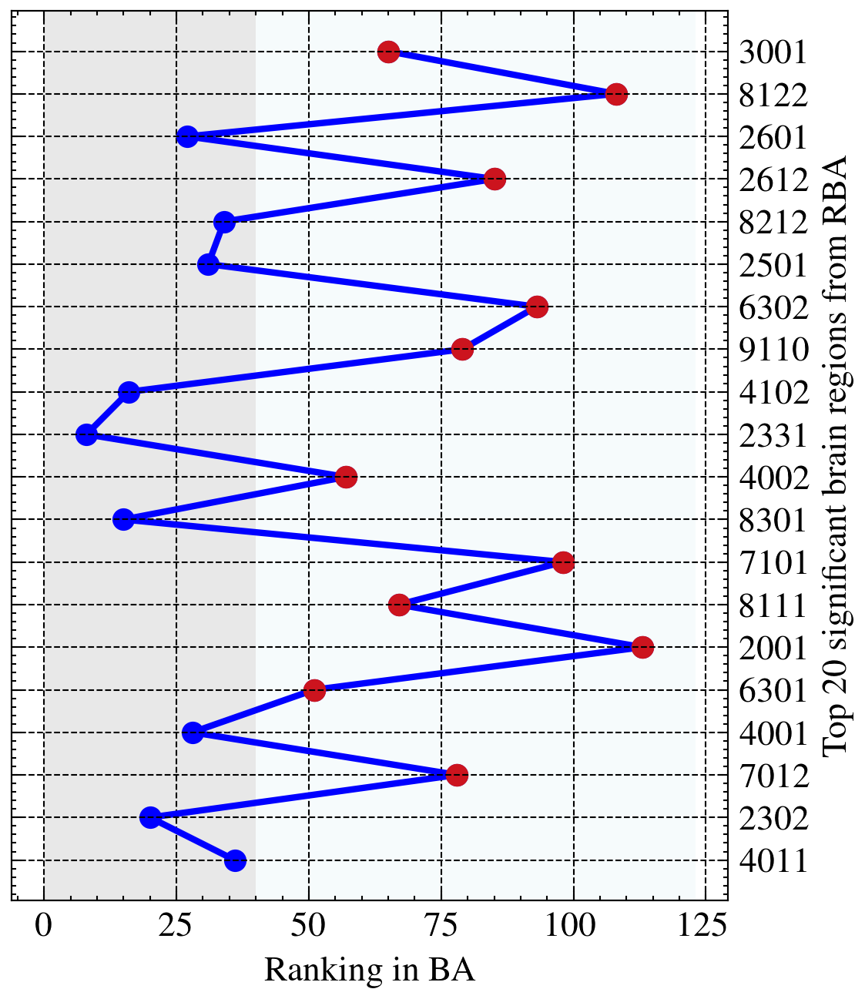

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
import pandas as pd

def map_id_to_name(i, mapping_table):  
    return str(mapping_table[mapping_table['Mricro'] == i]['English'].values[0]) 

a = pd.read_excel("Corrected_Translated_Book1.xlsx")


#AD
# overall = [9170.0, 9081.0, 9100.0, 9110.0, 8102.0, 2331.0, 4102.0, 2332.0, 3002.0, 9051.0, 4001.0, 2111.0, 4111.0, 8301.0, 6202.0, 8211.0, 2321.0, 4112.0, 6402.0, 2302.0, 4002.0, 6212.0, 2601.0, 6001.0, 8121.0, 2401.0, 6102.0, 3001.0, 2311.0, 4101.0, 2701.0, 2212.0, 2301.0, 9082.0, 8112.0, 2502.0, 5402.0, 6211.0, 2322.0, 2211.0, 2501.0, 8302.0, 6302.0, 8212.0, 2602.0, 8122.0, 5001.0, 6101.0, 2112.0, 6301.0, 2201.0, 2402.0, 5022.0, 6201.0, 8201.0, 2702.0, 6002.0, 7002.0, 9052.0, 9072.0, 6222.0, 4012.0, 2101.0, 5021.0, 9022.0, 5401.0, 8111.0, 5002.0, 4011.0, 5012.0, 5011.0, 8202.0, 2002.0, 6221.0, 2102.0, 5102.0, 9021.0, 2001.0, 2312.0, 9120.0, 2612.0, 9071.0, 9130.0, 4202.0, 6401.0, 9062.0, 2202.0, 9061.0, 7001.0, 2611.0, 9001.0, 8101.0, 5301.0, 9011.0, 5302.0, 5101.0, 4021.0, 9012.0, 5202.0, 5201.0, 9002.0, 9031.0, 9140.0, 9032.0, 9041.0, 4201.0, 4022.0, 9160.0, 9042.0, 7101.0, 9150.0, 7012.0, 7011.0, 7022.0, 7021.0, 7102.0]
# dan = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
# overall = [int(x) for x in overall]

# 数据PD
overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
dan = [4011, 2302, 7012, 4001, 6301, 2001, 8111, 7101, 8301, 4002, 2331, 4102, 9110, 6302, 2501, 8212, 2612, 2601, 8122, 3001, 6001, 9042, 2401, 4012, 2301, 7011, 6401, 8102, 5011, 7102, 8121, 6221, 9001, 8101, 4201, 4101, 5402, 4202, 2602, 2322, 9170, 9061, 6212, 7001, 9002, 9031, 2402, 3002, 2102, 2002, 2312, 8202, 2332, 5301, 5001, 5002, 6201, 9150, 4022, 2201, 9012, 2202, 8211, 4112, 5201, 7022, 9071, 5401, 9062, 9032, 5022, 4021, 5021, 9140, 5012, 4111, 2321, 2212, 6211, 9120, 7021, 9041, 2502, 2611, 9081, 9022, 9100, 2101, 9160, 8112, 6102, 9021, 6101, 7002, 2112, 2211, 5302, 9082, 6222, 5101, 2702, 6002, 2311, 6202, 9130, 9051, 2701, 9052, 8201, 2111, 8302, 6402, 5102, 5202, 9011, 9072]
overall = [int(x) for x in overall]

for j in dan:
    mapped_names = map_id_to_name(j, a)
    strs.append(mapped_names)

# 参数
threshold = 40
overall = [int(x) for x in overall]

# 映射overall值到其索引
overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# 提取dan列表的前20个脑区
top_20_dan = dan[:20]

# 在overall列表中找到这些脑区的索引
top_20_overall_indices = [overall_index_map[num] + 1 for num in top_20_dan]

# 设置颜色
top_20_overall_indices = np.array(top_20_overall_indices)
colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]


top_20_dan = [str(x) for x in top_20_dan]

plt.style.use(['science', 'ieee', 'grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]})
plt.rcParams['font.size'] = 11
plt.rcParams['lines.linewidth'] = 2

# 创建图形和轴

fig, ax1 = plt.subplots(figsize=(4, 5))
# plt.subplots_adjust(left=0.108, right=0.9, top=0.88, bottom=0.11)
# 背景区域
ax1.axvspan(0, threshold, facecolor='lightgrey', alpha=0.5, zorder=0)
ax1.axvspan(threshold, max(top_20_overall_indices) + 10, facecolor='lightblue', alpha=0.1, zorder=0)

# 画图
ax1.plot(top_20_overall_indices, top_20_dan, linestyle='-', marker='o', color='blue', label='Cumulative Rank Difference',zorder=1)

# 阈值以上的点
above_threshold = np.array(top_20_overall_indices) > threshold
ax1.scatter(np.array(top_20_overall_indices)[above_threshold], np.array(top_20_dan)[above_threshold],
            color='#CC141E', s=37, marker='o', label='Above Threshold',zorder=2)

# 阈值以下的点
# below_threshold = ~above_threshold
# ax1.scatter(np.array(top_20_overall_indices)[below_threshold], np.array(range(len(top_20_dan)))[below_threshold],
#             color='black', s=5, marker='o', label='Below Threshold')

# 隐藏左侧y轴
# ax1.set_yticks(range(len(at)))
ax1.grid(True, linestyle='--', alpha=1, zorder=0)
ax1.yaxis.set_ticks_position('none') 
ax1.tick_params(labelleft=False)
ax1.yaxis.grid(False)
# ax1.tick_params(left=False)

# 创建一个共享x轴的辅助y轴
ax2 = ax1.twinx()

# 设置右侧y轴刻度和标签
ax2.set_yticks(range(len(top_20_dan)))
ax2.set_yticklabels(top_20_dan)
ax2.set_ylabel('Top 20 significant brain regions from RBA')

# 确保左侧和右侧的 y 轴对齐
ax2.set_ylim(ax1.get_ylim())

# 在辅助轴上显示网格，并包括纵向网格线
ax2.yaxis.grid(True, linestyle='--', alpha=1,zorder=0)
# ax2.xaxis.grid(True, linestyle='--', alpha=1)

# 设置x轴标签在主轴上
ax1.set_xlabel('Ranking in BA')

# 保存和显示图形
plt.savefig(f"figures/PDF.png", dpi=300, bbox_inches='tight')
plt.show()


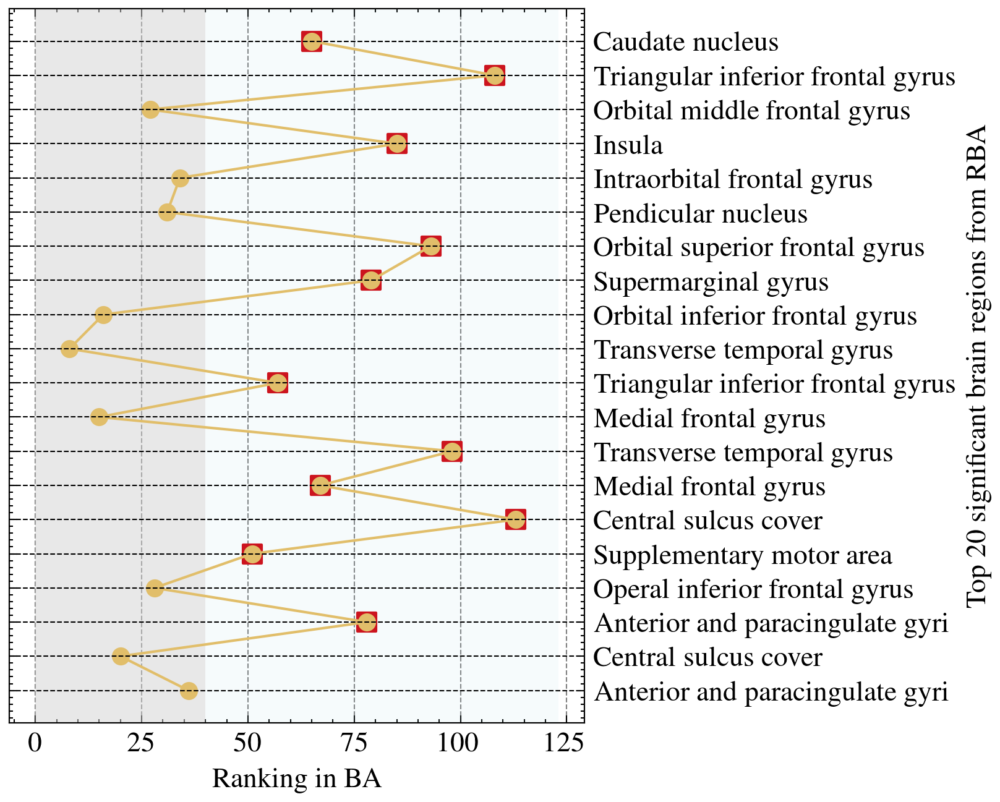

In [151]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
import pandas as pd

def map_id_to_name(i, mapping_table):  
    return str(mapping_table[mapping_table['Mricro'] == i]['English'].values[0]) 

a = pd.read_excel("Corrected_Translated_Book1.xlsx")


#AD
overall = [9170.0, 9081.0, 9100.0, 9110.0, 8102.0, 2331.0, 4102.0, 2332.0, 3002.0, 9051.0, 4001.0, 2111.0, 4111.0, 8301.0, 6202.0, 8211.0, 2321.0, 4112.0, 6402.0, 2302.0, 4002.0, 6212.0, 2601.0, 6001.0, 8121.0, 2401.0, 6102.0, 3001.0, 2311.0, 4101.0, 2701.0, 2212.0, 2301.0, 9082.0, 8112.0, 2502.0, 5402.0, 6211.0, 2322.0, 2211.0, 2501.0, 8302.0, 6302.0, 8212.0, 2602.0, 8122.0, 5001.0, 6101.0, 2112.0, 6301.0, 2201.0, 2402.0, 5022.0, 6201.0, 8201.0, 2702.0, 6002.0, 7002.0, 9052.0, 9072.0, 6222.0, 4012.0, 2101.0, 5021.0, 9022.0, 5401.0, 8111.0, 5002.0, 4011.0, 5012.0, 5011.0, 8202.0, 2002.0, 6221.0, 2102.0, 5102.0, 9021.0, 2001.0, 2312.0, 9120.0, 2612.0, 9071.0, 9130.0, 4202.0, 6401.0, 9062.0, 2202.0, 9061.0, 7001.0, 2611.0, 9001.0, 8101.0, 5301.0, 9011.0, 5302.0, 5101.0, 4021.0, 9012.0, 5202.0, 5201.0, 9002.0, 9031.0, 9140.0, 9032.0, 9041.0, 4201.0, 4022.0, 9160.0, 9042.0, 7101.0, 9150.0, 7012.0, 7011.0, 7022.0, 7021.0, 7102.0]
dan = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
overall = [int(x) for x in overall]

# 数据PD
# overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
# dan = [4011, 2302, 7012, 4001, 6301, 2001, 8111, 7101, 8301, 4002, 2331, 4102, 9110, 6302, 2501, 8212, 2612, 2601, 8122, 3001, 6001, 9042, 2401, 4012, 2301, 7011, 6401, 8102, 5011, 7102, 8121, 6221, 9001, 8101, 4201, 4101, 5402, 4202, 2602, 2322, 9170, 9061, 6212, 7001, 9002, 9031, 2402, 3002, 2102, 2002, 2312, 8202, 2332, 5301, 5001, 5002, 6201, 9150, 4022, 2201, 9012, 2202, 8211, 4112, 5201, 7022, 9071, 5401, 9062, 9032, 5022, 4021, 5021, 9140, 5012, 4111, 2321, 2212, 6211, 9120, 7021, 9041, 2502, 2611, 9081, 9022, 9100, 2101, 9160, 8112, 6102, 9021, 6101, 7002, 2112, 2211, 5302, 9082, 6222, 5101, 2702, 6002, 2311, 6202, 9130, 9051, 2701, 9052, 8201, 2111, 8302, 6402, 5102, 5202, 9011, 9072]
# overall = [int(x) for x in overall]

for j in dan:
    mapped_names = map_id_to_name(j, a)
    strs.append(mapped_names)

# 参数
threshold = 40
overall = [int(x) for x in overall]

# 映射overall值到其索引
overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# 提取dan列表的前20个脑区
top_20_dan = dan[:20]

# 在overall列表中找到这些脑区的索引
top_20_overall_indices = [overall_index_map[num] + 1 for num in top_20_dan]

# 设置颜色
top_20_overall_indices = np.array(top_20_overall_indices)
colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]

plt.style.use(['science', 'ieee', 'grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]})
plt.rcParams['font.size'] = 11
plt.rcParams['lines.linewidth'] = 1

# 创建图形和轴
fig, ax1 = plt.subplots(figsize=(4, 5))

# 背景区域
ax1.axvspan(0, threshold, facecolor='lightgrey', alpha=0.5)
ax1.axvspan(threshold, max(top_20_overall_indices) + 10, facecolor='lightblue', alpha=0.1)

# 画图
ax1.plot(top_20_overall_indices, range(len(top_20_dan)), linestyle='-', marker='o', color='#E1BE6A', label='Cumulative Rank Difference')

# 阈值以上的点
above_threshold = np.array(top_20_overall_indices) > threshold
ax1.scatter(np.array(top_20_overall_indices)[above_threshold], np.array(range(len(top_20_dan)))[above_threshold],
            color='#CC141E', s=50, marker='s', label='Above Threshold')

# 阈值以下的点
below_threshold = ~above_threshold
ax1.scatter(np.array(top_20_overall_indices)[below_threshold], np.array(range(len(top_20_dan)))[below_threshold],
            color='black', s=5, marker='o', label='Below Threshold')

# 隐藏左侧y轴
ax1.set_yticks(range(len(at)))
ax1.yaxis.set_ticks_position('none') 
ax1.tick_params(labelleft=False)
ax1.yaxis.grid(False)
# ax1.tick_params(left=False)

# 创建一个共享x轴的辅助y轴
ax2 = ax1.twinx()

# 设置右侧y轴刻度和标签
ax2.set_yticks(range(len(at)))
ax2.set_yticklabels(at)
ax2.set_ylabel('Top 20 significant brain regions from RBA')

# 确保左侧和右侧的 y 轴对齐
ax2.set_ylim(ax1.get_ylim())

# 在辅助轴上显示网格，并包括纵向网格线
ax2.yaxis.grid(True, linestyle='--', alpha=1)
# ax2.xaxis.grid(True, linestyle='--', alpha=1)

# 设置x轴标签在主轴上
ax1.set_xlabel('Ranking in BA')

# 保存和显示图形
plt.savefig(f"figures/PDF.png", dpi=300, bbox_inches='tight')
plt.show()


In [43]:
a[a['Mricro'] == 4011]['Mricro命名'].values[0]

'Cingulum_Mid_L'

In [67]:
print(type(dan[0]))
print(dan[0])
str(a[a['Mricro'] == 2002]['English'][0])

<class 'int'>
4011


KeyError: 0

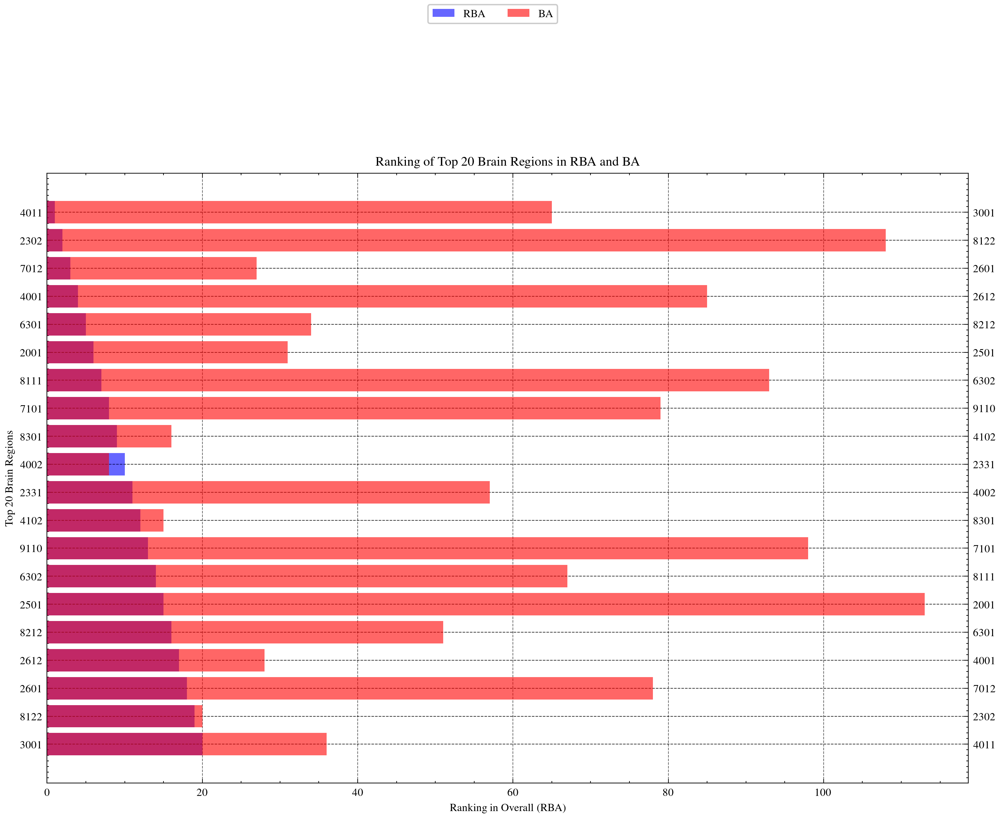

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Data
overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
dan = [4011, 2302, 7012, 4001, 6301, 2001, 8111, 7101, 8301, 4002, 2331, 4102, 9110, 6302, 2501, 8212, 2612, 2601, 8122, 3001, 6001, 9042, 2401, 4012, 2301, 7011, 6401, 8102, 5011, 7102, 8121, 6221, 9001, 8101, 4201, 4101, 5402, 4202, 2602, 2322, 9170, 9061, 6212, 7001, 9002, 9031, 2402, 3002, 2102, 2002, 2312, 8202, 2332, 5301, 5001, 5002, 6201, 9150, 4022, 2201, 9012, 2202, 8211, 4112, 5201, 7022, 9071, 5401, 9062, 9032, 5022, 4021, 5021, 9140, 5012, 4111, 2321, 2212, 6211, 9120, 7021, 9041, 2502, 2611]

# Extract top 20 brain regions from overall list
top_20_dan = dan[:20]
top_20_dan_labels = [str(x) for x in top_20_dan]

# Indices in the overall and dan lists
top_20_dan_indices = [dan.index(region) + 1 for region in top_20_dan]
top_20_overall_indices = [overall.index(region) + 1 for region in top_20_dan]

# Plot settings
fig, ax1 = plt.subplots(figsize=(12, 8))

# Create the bar plot for RBA (left y-axis)
ax1.barh(top_20_dan_labels, top_20_dan_indices, color='blue', alpha=0.6, label='RBA')
ax1.set_xlabel('Ranking in Overall (RBA)')
ax1.set_ylabel('Top 20 Brain Regions')
ax1.invert_yaxis()  # Reverse the order for better readability

# Create a second x-axis for BA
ax2 = ax1.twinx()
ax2.barh(top_20_dan_labels[:len(top_20_dan_indices)], top_20_overall_indices, color='red', alpha=0.6, label='BA')
ax2.set_xlabel('Ranking in Dan (BA)')

# Add a legend
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=2)

# Add grid and title
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.set_title('Ranking of Top 20 Brain Regions in RBA and BA')

# Show plot
plt.show()



[(4102, 4), (2332, 15), (6402, 38), (2312, 40), (6302, 49), (2002, 28), (2101, 94), (4202, 89), (4101, 13), (3002, 1), (2311, 50), (7012, 111), (4021, 32), (4201, 72), (8212, 75), (4112, 93), (2331, 5), (2402, 87), (7101, 76), (2612, 85)]
[4, 15, 38, 40, 49, 28, 94, 89, 13, 1, 50, 111, 32, 72, 75, 93, 5, 87, 76, 85]


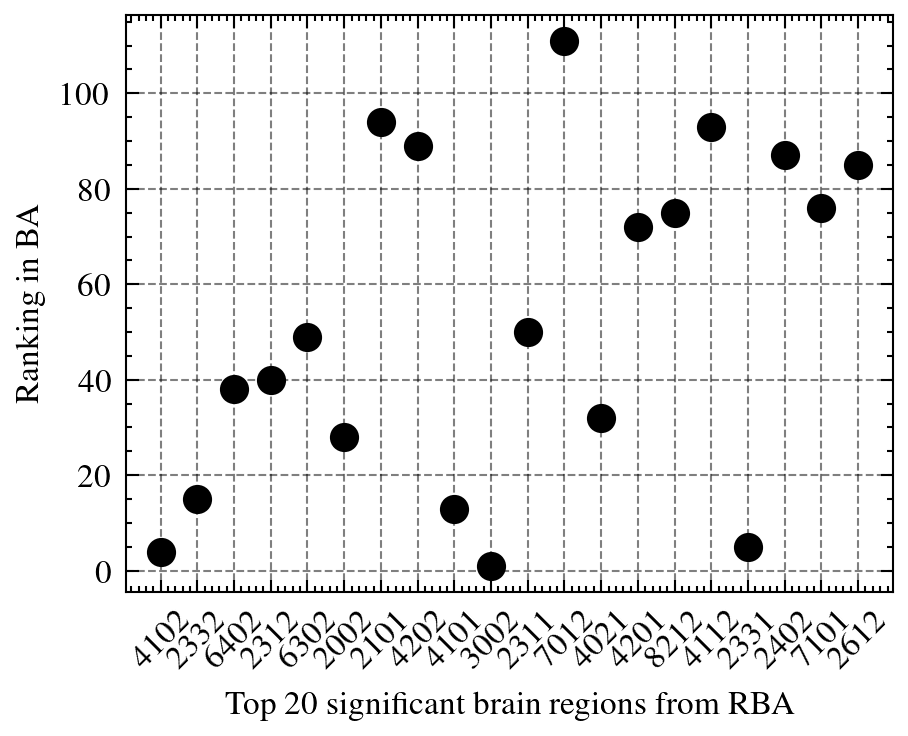

In [10]:
import matplotlib.pyplot as plt
import scienceplots
import numpy as np
# dan = [3002.0, 6102.0, 9170.0, 4102.0, 2331.0, 9110.0, 2302.0, 9130.0, 5102.0, 9140.0, 4001.0, 2601.0, 4101.0, 6301.0, 2332.0, 5101.0, 5011.0, 2501.0, 5001.0, 6202.0, 6222.0, 9120.0, 9012.0, 5302.0, 6101.0, 6002.0, 9052.0, 2002.0, 6211.0, 2401.0, 6001.0, 4021.0, 9100.0, 2611.0, 4011.0, 9082.0, 4111.0, 6402.0, 6201.0, 2312.0, 5202.0, 6401.0, 5201.0, 8302.0, 8121.0, 8202.0, 6212.0, 9002.0, 6302.0, 2311.0, 3001.0, 8112.0, 9021.0, 2322.0, 2321.0, 5401.0, 8122.0, 2102.0, 9011.0, 5021.0, 6221.0, 4012.0, 4002.0, 2301.0, 7001.0, 2202.0, 5002.0, 8201.0, 9150.0, 5012.0, 8301.0, 4201.0, 9032.0, 2001.0, 8212.0, 7101.0, 2201.0, 2502.0, 2701.0, 5402.0, 9001.0, 9042.0, 2212.0, 9022.0, 2612.0, 8111.0, 2402.0, 5022.0, 4202.0, 5301.0, 9071.0, 2112.0, 4112.0, 2101.0, 8102.0, 9031.0, 9072.0, 9081.0, 9041.0, 8211.0, 4022.0, 2211.0, 2602.0, 2702.0, 2111.0, 9062.0, 9160.0, 8101.0, 9061.0, 9051.0, 7012.0, 7002.0, 7011.0, 7021.0, 7022.0, 7102.0]
# overall = [4102,2332,6402,2312,6302,2002,2101,4202,4101,3002,2311,7012,4021,4201,8212,4112,2331,2402,7101,2612,2102,8102,2321,2211,4011,8201,6202,8302,2302,5102,9140,8301,5012,8122,5402,2611,4111,2401,3001,6002,5002,4012,2322,2301,2701,7102,2111,5021,6221,2702,6222,5201,2112,5401,4022,6212,4002,2202,9051,7001,2501,2602,4001,5101,7002,9001,2601,2201,9062,2502,6201,8202,6001,9130,9071,6401,6102,9012,9031,9042,9081,5202,5001,9082,9011,7011,8211,2212,6211,9041,9072,5302,9170,6101,6301,9110,8121,5022,8112,5011,7021,9002,9061,2001,8101,7022,9100,9021,5301,9120,9022,9150,8111,9052,9160,9032]
# dan = [int(x) for x in dan]

#AD和MCI共有脑区 4101 4102 2002 4201 4202 2332 7012 4021 4112 7101

#MCI
overall = [3002.0, 6102.0, 9170.0, 4102.0, 2331.0, 9110.0, 2302.0, 9130.0, 5102.0, 9140.0, 4001.0, 2601.0, 4101.0, 6301.0, 2332.0, 5101.0, 5011.0, 2501.0, 5001.0, 6202.0, 6222.0, 9120.0, 9012.0, 5302.0, 6101.0, 6002.0, 9052.0, 2002.0, 6211.0, 2401.0, 6001.0, 4021.0, 9100.0, 2611.0, 4011.0, 9082.0, 4111.0, 6402.0, 6201.0, 2312.0, 5202.0, 6401.0, 5201.0, 8302.0, 8121.0, 8202.0, 6212.0, 9002.0, 6302.0, 2311.0, 3001.0, 8112.0, 9021.0, 2322.0, 2321.0, 5401.0, 8122.0, 2102.0, 9011.0, 5021.0, 6221.0, 4012.0, 4002.0, 2301.0, 7001.0, 2202.0, 5002.0, 8201.0, 9150.0, 5012.0, 8301.0, 4201.0, 9032.0, 2001.0, 8212.0, 7101.0, 2201.0, 2502.0, 2701.0, 5402.0, 9001.0, 9042.0, 2212.0, 9022.0, 2612.0, 8111.0, 2402.0, 5022.0, 4202.0, 5301.0, 9071.0, 2112.0, 4112.0, 2101.0, 8102.0, 9031.0, 9072.0, 9081.0, 9041.0, 8211.0, 4022.0, 2211.0, 2602.0, 2702.0, 2111.0, 9062.0, 9160.0, 8101.0, 9061.0, 9051.0, 7012.0, 7002.0, 7011.0, 7021.0, 7022.0, 7102.0]
dan = [4102,2332,6402,2312,6302,2002,2101,4202,4101,3002,2311,7012,4021,4201,8212,4112,2331,2402,7101,2612,2102,8102,2321,2211,4011,8201,6202,8302,2302,5102,9140,8301,5012,8122,5402,2611,4111,2401,3001,6002,5002,4012,2322,2301,2701,7102,2111,5021,6221,2702,6222,5201,2112,5401,4022,6212,4002,2202,9051,7001,2501,2602,4001,5101,7002,9001,2601,2201,9062,2502,6201,8202,6001,9130,9071,6401,6102,9012,9031,9042,9081,5202,5001,9082,9011,7011,8211,2212,6211,9041,9072,5302,9170,6101,6301,9110,8121,5022,8112,5011,7021,9002,9061,2001,8101,7022,9100,9021,5301,9120,9022,9150,8111,9052,9160,9032]
overall = [int(x) for x in overall]

#AD
# overall = [9170.0, 9081.0, 9100.0, 9110.0, 8102.0, 2331.0, 4102.0, 2332.0, 3002.0, 9051.0, 4001.0, 2111.0, 4111.0, 8301.0, 6202.0, 8211.0, 2321.0, 4112.0, 6402.0, 2302.0, 4002.0, 6212.0, 2601.0, 6001.0, 8121.0, 2401.0, 6102.0, 3001.0, 2311.0, 4101.0, 2701.0, 2212.0, 2301.0, 9082.0, 8112.0, 2502.0, 5402.0, 6211.0, 2322.0, 2211.0, 2501.0, 8302.0, 6302.0, 8212.0, 2602.0, 8122.0, 5001.0, 6101.0, 2112.0, 6301.0, 2201.0, 2402.0, 5022.0, 6201.0, 8201.0, 2702.0, 6002.0, 7002.0, 9052.0, 9072.0, 6222.0, 4012.0, 2101.0, 5021.0, 9022.0, 5401.0, 8111.0, 5002.0, 4011.0, 5012.0, 5011.0, 8202.0, 2002.0, 6221.0, 2102.0, 5102.0, 9021.0, 2001.0, 2312.0, 9120.0, 2612.0, 9071.0, 9130.0, 4202.0, 6401.0, 9062.0, 2202.0, 9061.0, 7001.0, 2611.0, 9001.0, 8101.0, 5301.0, 9011.0, 5302.0, 5101.0, 4021.0, 9012.0, 5202.0, 5201.0, 9002.0, 9031.0, 9140.0, 9032.0, 9041.0, 4201.0, 4022.0, 9160.0, 9042.0, 7101.0, 9150.0, 7012.0, 7011.0, 7022.0, 7021.0, 7102.0]
# dan = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
# overall = [int(x) for x in overall]
threshold = 40

#SZ
# overall = [9140.0, 9100.0, 9110.0, 2331.0, 3001.0, 2301.0, 2111.0, 2702.0, 2311.0, 8301.0, 3002.0, 2321.0, 2201.0, 2332.0, 2612.0, 2101.0, 6211.0, 8201.0, 2211.0, 2602.0, 2502.0, 9170.0, 4002.0, 4012.0, 2402.0, 9130.0, 6001.0, 4001.0, 6221.0, 2601.0, 4102.0, 5301.0, 6201.0, 6402.0, 2701.0, 6202.0, 2302.0, 4112.0, 2001.0, 2401.0, 5001.0, 8102.0, 2501.0, 5402.0, 5201.0, 9150.0, 6212.0, 9120.0, 5022.0, 2202.0, 6302.0, 2002.0, 8111.0, 2102.0, 6101.0, 4101.0, 4202.0, 9001.0, 9072.0, 5401.0, 2312.0, 8302.0, 8112.0, 6002.0, 5011.0, 4011.0, 9021.0, 9022.0, 8122.0, 5021.0, 6102.0, 7002.0, 6301.0, 2322.0, 9011.0, 5012.0, 9041.0, 9160.0, 5002.0, 4111.0, 9031.0, 8202.0, 2611.0, 9012.0, 6401.0, 2212.0, 8211.0, 9002.0, 6222.0, 4022.0, 9042.0, 8121.0, 9052.0, 8101.0, 4201.0, 9032.0, 5101.0, 2112.0, 4021.0, 9071.0, 9062.0, 9061.0, 8212.0, 5302.0, 7011.0, 9051.0, 5102.0, 7012.0, 7001.0, 5202.0, 7021.0, 7022.0, 7102.0, 9081.0, 9082.0, 7101.0]
# dan = [4002,2331,4001,2302,2401,2332,2602,8111,2601,2312,8102,2322,6211,2112,7012,2611,3001,2211,2311,7001,2212,2201,6222,8122,2002,2702,4012,2301,2612,7002,3002,9062,6212,2102,8201,2402,2001,8101,2101,6002,4102,6401,2501,6102,4011,4112,8211,7101,7011,2502,2202,4021,5301,8202,2321,9001,7102,8121,2111,7021,6302,9032,6101,5022,5021,5302,4022,9011,2701,8112,4111,5401,9082,5001,8302,6001,4101,9160,5002,6221,9081,4202,5011,9072,5402,8212,6201,9051,4201,7022,9061,6402,6301,5201,9110,9140,6202,9170,8301,9071,9052,9042,9150,9021,5102,5202,9022,9012,5101,9002,9031,5012,9041,9100,9130,9120]
# overall = [int(x) for x in overall]
# 中央沟盖 脑岛 岛盖部额下回 眶部额上回 回直肌 三角部额下回 颞下回 眶部额下回 额中回

#PD
# overall = [9082.0, 9170.0, 2212.0, 2112.0, 9052.0, 9081.0, 3002.0, 2331.0, 8302.0, 2322.0, 2111.0, 2332.0, 2701.0, 9051.0, 8301.0, 4102.0, 9062.0, 9022.0, 2321.0, 2302.0, 9011.0, 5401.0, 9100.0, 5402.0, 9061.0, 2611.0, 2601.0, 4001.0, 5021.0, 5002.0, 2501.0, 4101.0, 2211.0, 8212.0, 4111.0, 4011.0, 9012.0, 5001.0, 6212.0, 5301.0, 9021.0, 8202.0, 2502.0, 5302.0, 8211.0, 9140.0, 5022.0, 8121.0, 4012.0, 2401.0, 6301.0, 4021.0, 5012.0, 2312.0, 9042.0, 8112.0, 4002.0, 5102.0, 8102.0, 8201.0, 9130.0, 9150.0, 9002.0, 6211.0, 3001.0, 2702.0, 8111.0, 8101.0, 5202.0, 9071.0, 5011.0, 2102.0, 9032.0, 7001.0, 7011.0, 6222.0, 9072.0, 7012.0, 9110.0, 2301.0, 4112.0, 6202.0, 6221.0, 5201.0, 2612.0, 5101.0, 2311.0, 2202.0, 9120.0, 6102.0, 7022.0, 2002.0, 6302.0, 9041.0, 6201.0, 6401.0, 6002.0, 7101.0, 7021.0, 4201.0, 9001.0, 4202.0, 4022.0, 9031.0, 6001.0, 2602.0, 2402.0, 8122.0, 2201.0, 6101.0, 9160.0, 6402.0, 2001.0, 7102.0, 2101.0, 7002.0]
# dan = [4011,2302,7012,4001,6301,2001,8111,7101,8301,4002,2331,4102,9110,6302,2501,8212,2612,2601,8122,3001,6001,9042,2401,4012,2301,7011,6401,8102,5011,7102,8121,6221,9001,8101,4201,4101,5402,4202,2602,2322,9170,9061,6212,7001,9002,9031,2402,3002,2102,2002,2312,8202,2332,5301,5001,5002,6201,9150,4022,2201,9012,2202,8211,4112,5201,7022,9071,5401,9062,9032,5022,4021,5021,9140,5012,4111,2321,2212,6211,9120,7021,9041,2502,2611,9081,9022,9100,2101,9160,8112,6102,9021,6101,7002,2112,2211,5302,9082,6222,5101,2702,6002,2311,6202,9130,9051,2701,9052,8201,2111,8302,6402,5102,5202,9011,9072]
# overall = [int(x) for x in overall]
#眶部额中回 眶部额上回 脑岛 中央沟盖 颞下回 眶部额下回 回直肌


# 为每个点设置颜色
# overall = np.array(overall)
# dan = np.array(dan)

# 创建映射从编号到在overall列表中的索引
overall_index_map = {int(value): idx for idx, value in enumerate(overall)}

# 提取dan列表的前20个脑区编号
top_20_dan = dan[:20]

# 找出这些脑区在overall中的索引位置
top_20_overall_indices = [overall_index_map[num]+1 for num in top_20_dan if num in overall_index_map]
print(list(zip(top_20_dan,top_20_overall_indices)))
print(top_20_overall_indices)
top_20_dan = [str(x) for x in top_20_dan]

colors = ['red' if value > threshold else 'black' for value in top_20_overall_indices]

top_20_overall_indices = np.array(top_20_overall_indices)
plt.style.use(['science','ieee','grid'])
plt.rcParams.update({'figure.dpi': '300'})
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"]}) 
# plt.rcParams['font.size'] = 16  # 你可以根据需要调整这里的数字
# plt.style.use(['science','vibrant'])
# plt.rcParams['font.weight'] = 'bold'
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titleweight'] = 'bold'
# plt.rcParams['font.family'] = t[0]
# plt.rcParams['axes.titleweight'] = 'bold'

# 设置全局线条宽度
plt.rcParams['lines.linewidth'] = 1  # 
# 绘制累积差异曲线图
# plt.figure(figsize=(6, 4))
plt.scatter(top_20_dan, top_20_overall_indices, linestyle='-')

# above_threshold = top_20_overall_indices > threshold
# plt.scatter(np.array(top_20_dan)[above_threshold], top_20_overall_indices[above_threshold],
#             color='red', s=5, marker='^', label='Above Threshold')  # 使用三角形表示

# # 绘制不大于阈值的点
# below_threshold = np.logical_not(above_threshold)
# plt.scatter(np.array(top_20_dan)[below_threshold], top_20_overall_indices[below_threshold],
#             color='black', s=5, marker='o', label='Below Threshold') 


# plt.title('Cumulative Rank Difference Curve for Top 20 Brain Regions in Dan')
plt.xlabel('Top 20 significant brain regions from RBA')
plt.ylabel('Ranking in BA')
plt.xticks(rotation=45)  # Rotate labels for better visibility
# plt.savefig(f"figures/MCIF.png",dpi=300, pad_inches=0)
plt.show()


#MCI 6302 2101 4202 2311 7012 4201 8212 4112 2402 7101 2612
#AD  2002 7101 4201 4021 7102 7012 2312 5002 2612 
#SZ  8111 2312 8102 2322 2112 7012 2611 7001
#PD  7012 6301 2001 8111 7101 4002 9110 6302 2612 8122 3001

In [7]:
import matplotlib.font_manager

fonts = matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')
# 现在打印出所有的 ttf 字体的名称
print([matplotlib.font_manager.FontProperties(fname=font).get_name() for font in fonts])


['Liberation Sans Narrow', 'Liberation Sans Narrow', 'Liberation Sans Narrow', 'Lato', 'DejaVu Sans Mono', 'Liberation Sans', 'DejaVu Sans', 'Lato', 'Liberation Sans', 'Lato', 'Droid Sans Fallback', 'Liberation Mono', 'Noto Mono', 'Lato', 'DejaVu Sans', 'Lato', 'DejaVu Serif', 'Liberation Sans', 'Lato', 'Lato', 'Lato', 'Lato', 'Liberation Serif', 'Liberation Serif', 'Lato', 'Liberation Mono', 'Liberation Serif', 'Lato', 'Liberation Sans Narrow', 'Lato', 'Liberation Serif', 'DejaVu Serif', 'DejaVu Sans Mono', 'Lato', 'Liberation Sans', 'Lato', 'Lato', 'Liberation Mono', 'Lato', 'Lato', 'Lato', 'Liberation Mono']


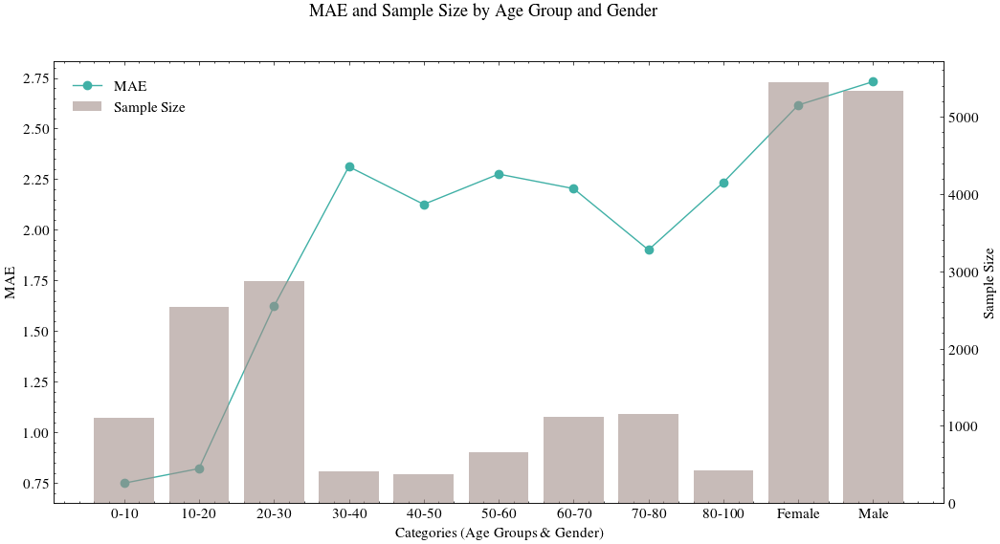

In [1]:
# Female 2.61626935005188 5441
# Male 2.7320404052734375 5335
# 0-10 0.749 1108
# 10-20 0.8209345936775208 2544
# 20-30 1.6220321655273438 2879 
# 30-40 2.3121120929718018 407
# 40-50 2.1258962154388428 380
# 50-60 2.275303363800049 664
# 60-70 2.2036631107330322 1121
# 70-80 1.9010264873504639 1150
# 80-100 2.234222173690796 423


import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import seaborn as sns

plt.style.use('science')
plt.rcParams.update({
    "font.family": "serif",   # specify font family here
    "font.serif": ["Times"],  # specify font here
    "font.size":11})  

categories = ["0-10", "10-20", "20-30", "30-40", "40-50", "50-60", "60-70", "70-80", "80-100", "Female", "Male"]
combined_mae = [0.749, 0.8209345936775208, 1.6220321655273438, 2.3121120929718018, 2.1258962154388428,
                2.275303363800049, 2.2036631107330322, 1.9010264873504639, 2.234222173690796, 2.61626935005188, 2.7320404052734375]
combined_samples = [1108, 2544, 2879, 407, 380, 664, 1121, 1150, 423, 5441, 5335]
with plt.style.context('science'):
# Creating a figure and a twin axis for the sample sizes
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Plotting MAE as a line plot
    ax1.plot(categories, combined_mae, marker='o', linestyle='-', color='#40B0A6', label='MAE')
    ax1.set_xlabel('Categories (Age Groups \& Gender)')
    ax1.set_ylabel('MAE')
    ax1.tick_params(axis='y')

    # Creating a twin axis for sample sizes
    ax2 = ax1.twinx()
    ax2.bar(categories, combined_samples, color='#A38E89', alpha=0.6, label='Sample Size')
    ax2.set_ylabel('Sample Size')
    ax2.tick_params(axis='y')

    # Adding titles and legends
    fig.suptitle('MAE and Sample Size by Age Group and Gender')
    fig.legend(loc='upper left', bbox_to_anchor=(0.13, 0.87))
#     plt.show()


    fig.savefig(f"figures/MAELEN.png",dpi=300,bbox_inches='tight', pad_inches=0)
    plt.show()
# plt.savefig(f"figures/{k}z.png",dpi=300, bbox_inches='tight', pad_inches=0)

In [169]:
(2.503862142562866+
2.595798969268799+
2.455207347869873+
2.543898582458496+
2.463637351989746)/5

2.512480878829956

In [ ]:
2.503862142562866
2.595798969268799
2.455207347869873
2.543898582458496
2.463637351989746
平均 2.512480878829956

In [142]:
custom_colors = [
    "#40B0A6",  # muted blue
    "#E1BE6A",  # safety orange
    "#A38E89",  # cooked asparagus green
    "#CC141E",  # brick red
    "#CD5582",  # muted purple
    "#6E579A",  # chestnut brown
    "#6D8EF7",  # raspberry yogurt pink
    "#EC6B2D",  # middle gray
    "#A5C8DD",  # curry yellow-green
    "#E89A7A",  # blue-teal
    "#FFECC2"
    # ... add more colors as needed ...
]
print(len(custom_colors))

11


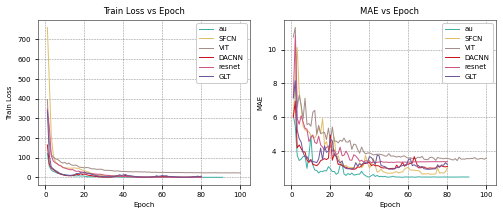

In [151]:
# Loss图
import re
import matplotlib.pyplot as plt
import scienceplots
# File paths
file_paths = {
    'au': 'loss/attentinu.txt',
    'SFCN': 'loss/SFCN.txt',
    'VIT': 'loss/VIT.txt',
    'DACNN': 'loss/DACNN.txt',
    'resnet': 'loss/resnet.txt',
    'GLT': 'loss/GLT.txt'
}

# Read file contents
file_contents = {name: open(path, 'r').read() for name, path in file_paths.items()}

# Structure to hold extracted data
data = {
    'au': {'epochs': [], 'train_loss': [], 'test_loss': [], 'MAE': []},
    'SFCN': {'epochs': [], 'train_loss': [], 'test_loss': [], 'MAE': []},
    'VIT': {'epochs': [], 'train_loss': [], 'test_loss': [], 'MAE': []},
    'DACNN': {'epochs': [], 'train_loss': [], 'test_loss': [], 'MAE': []},
    'resnet': {'epochs': [], 'train_loss': [], 'test_loss': [], 'MAE': []},
    'GLT': {'epochs': [], 'train_loss': [], 'test_loss': [], 'MAE': []}
}

# Regular expression pattern
pattern = r"Epoch:(\d+)/\d+.*train_loss:(\d+.\d+).*test_loss:(\d+.\d+).*R:tensor\(\[(\d+.\d+)\].*R\^2:(\d+.\d+).*MAE:(\d+.\d+)"

# Extracting data using regex
for model, content in file_contents.items():
    matches = re.finditer(pattern, content)
    for match in matches:
        data[model]['epochs'].append(int(match.group(1)))
        data[model]['train_loss'].append(float(match.group(2)))
        data[model]['test_loss'].append(float(match.group(3)))
        # R and R^2 are captured but not used in plotting as per the current requirements.
        data[model]['MAE'].append(float(match.group(6)))

# Now, let's plot the graphs.
with plt.style.context(['nature','grid','light']):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7, 3))
    
    # Plot for train_loss vs epoch
    for i,(model, values) in enumerate(data.items()):
        axes[0].plot(values['epochs'], values['train_loss'], color=custom_colors[i],label=model)
    axes[0].set_title('Train Loss vs Epoch')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Train Loss')
    axes[0].legend()
    
    # Plot for MAE vs epoch
    for i,(model, values) in enumerate(data.items()):
        axes[1].plot(values['epochs'], values['MAE'], color=custom_colors[i], label=model)
    axes[1].set_title('MAE vs Epoch')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('MAE')
    axes[1].legend()
    plt.tight_layout()
    plt.savefig('figures/loss.jpg',dpi=300)
    plt.show()



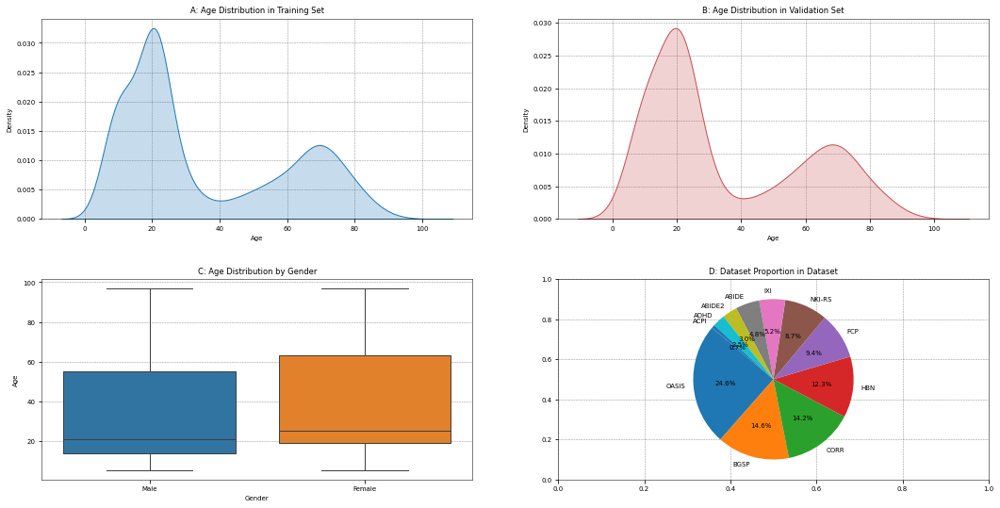

In [143]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'train_IXI' and 'val_IXI' dataframes and 'df' dataframe are already loaded
# Extracting the age column
train_ages = train_IXI.iloc[:, 1]
val_ages = val_IXI.iloc[:, 1]

# Setting the style
plt.style.use(['nature', 'grid'])

# Creating subplots with adjusted spacing
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 9), gridspec_kw={'hspace': 0.3, 'wspace': 0.2})

# Plotting the age distribution in the training set
sns.kdeplot(train_ages, shade=True, ax=axes[0][0])
axes[0][0].set_title('A: Age Distribution in Training Set')
axes[0][0].set_xlabel('Age')
axes[0][0].set_ylabel('Density')

# Plotting the age distribution in the validation set
sns.kdeplot(val_ages, shade=True, color="r", ax=axes[0][1])
axes[0][1].set_title('B: Age Distribution in Validation Set')
axes[0][1].set_xlabel('Age')
axes[0][1].set_ylabel('Density')

# Plotting the age distribution by gender
sns.boxplot(x='gender', y='age', data=df, ax=axes[1][0])
axes[1][0].set_title('C: Age Distribution by Gender')
axes[1][0].set_xlabel('Gender')
axes[1][0].set_ylabel('Age')
axes[1][0].set_xticks(ticks=[0, 1], labels=['Male', 'Female'])  # Assuming 0 is Male, 1 is Female

# Plotting the dataset proportion in the dataset
dataset_counts = df['dataset'].value_counts()
# Enlarging the pie chart
axes[1][1] = fig.add_subplot(2,2,4)
axes[1][1].pie(dataset_counts, labels=dataset_counts.index, autopct='%1.1f%%', startangle=140)
axes[1][1].set_title('D: Dataset Proportion in Dataset')

# Save and display the plot
plt.savefig('figures/dataset.jpg', dpi=300)
plt.show()


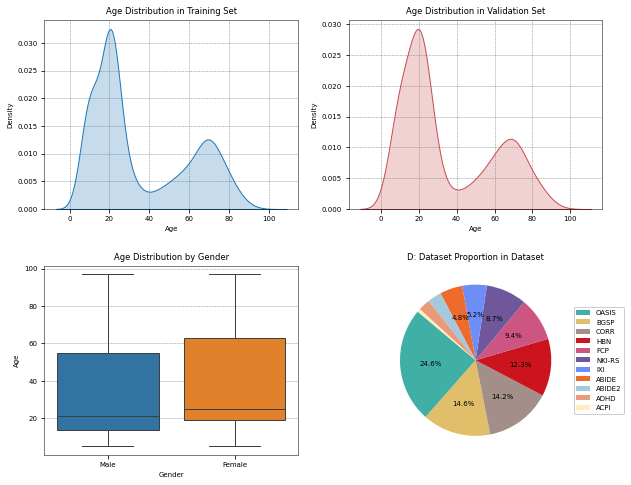

In [149]:
# 数据集统计图
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import seaborn as sns

k = 1
dataframe_paths = [f'5-fold/train_{k}.csv', f'5-fold/val_{k}.csv']
# 读取数据
train_IXI = pd.read_csv(dataframe_paths[0], header=None)
val_IXI = pd.read_csv(dataframe_paths[1], header=None)

# 提取年龄列
train_ages = train_IXI.iloc[:, 1]
val_ages = val_IXI.iloc[:, 1]
df = pd.read_excel('Datause.xlsx')
def custom_autopct(pct):
    return ('%1.1f%%' % pct) if pct > 4 else ''
with plt.style.context(['nature','grid']):
# 绘制分布
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.3, 'wspace': 0.2})
    # 绘制训练集年龄分布

    sns.kdeplot(train_ages, shade=True, ax=axes[0][0])
    axes[0][0].set_title('Age Distribution in Training Set')
    axes[0][0].set_xlabel('Age')
    axes[0][0].set_ylabel('Density')

    
    # 绘制测试集年龄分布
    sns.kdeplot(val_ages, shade=True, color="r", ax=axes[0][1])
    axes[0][1].set_title('Age Distribution in Validation Set')
    axes[0][1].set_xlabel('Age')
    axes[0][1].set_ylabel('Density')
    


    sns.boxplot(x='gender', y='age', data=df, ax=axes[1][0])
    axes[1][0].set_title('Age Distribution by Gender')
    axes[1][0].set_xlabel('Gender')
    axes[1][0].set_ylabel('Age')
    axes[1][0].set_xticks(ticks=[0, 1], labels=['Male', 'Female'])  # 假设0是男性，1是女性

    dataset_counts = df['dataset'].value_counts()
    # axes[1][1].pie(dataset_counts, labels=dataset_counts.index, autopct='%1.1f%%', startangle=140)
    # axes[1][1].set_title('Dataset Proportion in Dataset')
    # Enlarging the pie chart

    colors = sns.color_palette('deep', len(dataset_counts)+2)
    
    patches, texts, autotexts = axes[1][1].pie(dataset_counts, autopct=custom_autopct, startangle=140,colors=custom_colors)
    axes[1][1].set_title('D: Dataset Proportion in Dataset')
    # Adding a legend
    plt.legend(patches, dataset_counts.index, loc="center left", bbox_to_anchor=(1, 0.5))
    plt.savefig('figures/dataset.jpg',dpi=400)
    plt.show()


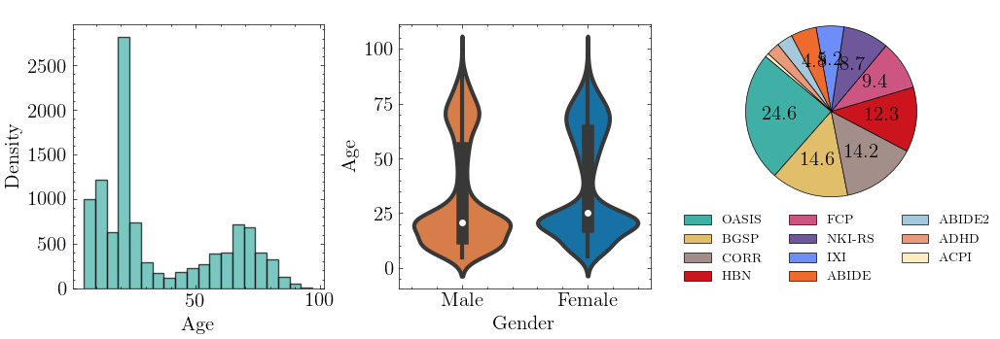

In [5]:

# 数据集统计图
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import seaborn as sns

custom_colors = [
    "#40B0A6",  # muted blue
    "#E1BE6A",  # safety orange
    "#A38E89",  # cooked asparagus green
    "#CC141E",  # brick red
    "#CD5582",  # muted purple
    "#6E579A",  # chestnut brown
    "#6D8EF7",  # raspberry yogurt pink
    "#EC6B2D",  # middle gray
    "#A5C8DD",  # curry yellow-green
    "#E89A7A",  # blue-teal
    "#FFECC2"
    # ... add more colors as needed ...
]

t = ['Arial', 'Helvetica', 'Times New Roman', 'Times', 'Symbol', 'Courier']
# plt.rcParams['font.family'] = 'Arial'

# plt.rcParams['font.weight'] = 'bold'

plt.rcParams['font.size'] = 15  # 你可以根据需要调整这里的数字
plt.style.use(['science','vibrant'])
# plt.rcParams['font.weight'] = 'bold'
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['font.family'] = t[0]
plt.rcParams['axes.titleweight'] = 'bold'

# 设置全局线条宽度
plt.rcParams['lines.linewidth'] = 3  # 同样，调整这里的数字以满足你的需求

k = 1
# dataframe_paths = [f'5-fold/train_{k}.csv', f'5-fold/val_{k}.csv']
# # 读取数据
# train_IXI = pd.read_csv(dataframe_paths[0], header=None)
# val_IXI = pd.read_csv(dataframe_paths[1], header=None)

# 提取年龄列
# train_ages = train_IXI.iloc[:, 1]
# val_ages = val_IXI.iloc[:, 1]
df = pd.read_excel('Datause.xlsx')
age = df.iloc[:,5]

def custom_autopct(pct):
    return ('%1.1f%%' % pct) if pct > 4 else ''

# 绘制分布
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), gridspec_kw={'wspace': 0.3})
# 绘制训练集年龄分布

# plt.hist(nv, bins=20, color='blue', alpha=0.7)
# plt.show()

# plt.hist(nan, bins=20, color='blue', alpha=0.7)
# plt.show()

# sns.kdeplot(nan, shade=True, ax=axes[0][0],clip=(5.05, None))

axes[0].hist(age, bins=20,alpha=0.7,color=custom_colors[0],edgecolor='black')
# axes[0].set_title(r'(a) Age Distribution',fontsize=17,fontweight=900,y=-0.25)
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Density')






sns.violinplot(x='gender', y='age', data=df, ax=axes[1])
# axes[1].set_title(r'(b) Violin Plot of Age Distribution',fontsize=17,fontweight=900,y=-0.25)
axes[1].set_xlabel('Gender')
axes[1].set_ylabel('Age')
# axes[1][0].set_xticks(ticks=[0, 1], labels=['Male', 'Female'])  # 假设0是男性，1是女性
axes[1].set_xticks(ticks=[0, 1])

# 设置对应的刻度标签
axes[1].set_xticklabels(labels=['Male', 'Female'])

dataset_counts = df['dataset'].value_counts()
# axes[1][1].pie(dataset_counts, labels=dataset_counts.index, autopct='%1.1f%%', startangle=140)
# axes[1][1].set_title('Dataset Proportion in Dataset')
# Enlarging the pie chart

colors = sns.color_palette('deep', len(dataset_counts)+2)
wedge_properties = {"edgecolor": "black", 'linewidth': 0.5}
patches, texts, autotexts = axes[2].pie(dataset_counts, autopct=custom_autopct, startangle=140,colors=custom_colors,wedgeprops=wedge_properties)
# axes[2].set_title(r'(c) Different Dataset Proportion',fontsize=17,fontweight=900,y=-0.41)

fig.subplots_adjust(bottom=0.2)  # Adjust the bottom space to make room for the legend
axes[2].set_position([0.65, 0.38, 0.25, 0.55])  # Move the pie chart slightly upwards

# Place the legend below the pie chart
fig.legend(patches, dataset_counts.index, loc="upper center", bbox_to_anchor=(0.78, 0.42), ncol=3,fontsize=10)
# Adding a legend
# plt.legend(patches, dataset_counts.index, loc="center left", bbox_to_anchor=(0.8, 0.2), ncol=3)
plt.savefig('figures/dataset.jpg',dpi=400)
plt.show()

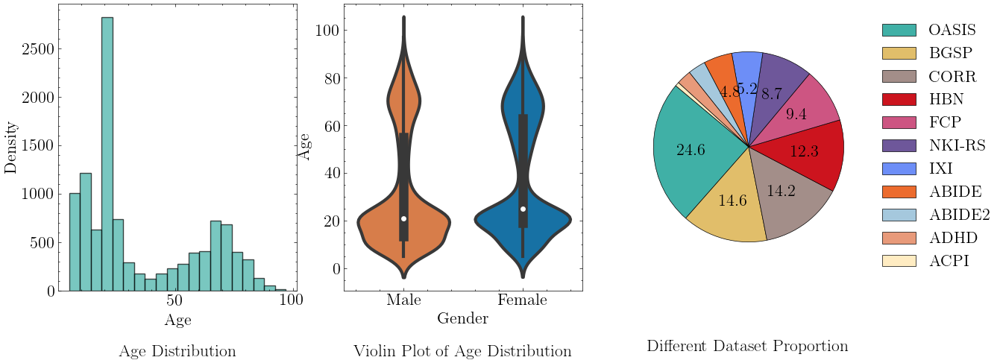

In [9]:

# 数据集统计图
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import seaborn as sns

custom_colors = [
    "#40B0A6",  # muted blue
    "#E1BE6A",  # safety orange
    "#A38E89",  # cooked asparagus green
    "#CC141E",  # brick red
    "#CD5582",  # muted purple
    "#6E579A",  # chestnut brown
    "#6D8EF7",  # raspberry yogurt pink
    "#EC6B2D",  # middle gray
    "#A5C8DD",  # curry yellow-green
    "#E89A7A",  # blue-teal
    "#FFECC2"
    # ... add more colors as needed ...
]

t = ['Arial', 'Helvetica', 'Times New Roman', 'Times', 'Symbol', 'Courier']
# plt.rcParams['font.family'] = 'Arial'

# plt.rcParams['font.weight'] = 'bold'

plt.rcParams['font.size'] = 16  # 你可以根据需要调整这里的数字
plt.style.use(['science','vibrant'])
# plt.rcParams['font.weight'] = 'bold'
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['font.family'] = t[0]

# 设置全局线条宽度
plt.rcParams['lines.linewidth'] = 3  # 同样，调整这里的数字以满足你的需求

k = 1
# dataframe_paths = [f'5-fold/train_{k}.csv', f'5-fold/val_{k}.csv']
# # 读取数据
# train_IXI = pd.read_csv(dataframe_paths[0], header=None)
# val_IXI = pd.read_csv(dataframe_paths[1], header=None)

# 提取年龄列
# train_ages = train_IXI.iloc[:, 1]
# val_ages = val_IXI.iloc[:, 1]
df = pd.read_excel('Datause.xlsx')
age = df.iloc[:,5]

def custom_autopct(pct):
    return ('%1.1f%%' % pct) if pct > 4 else ''

# 绘制分布
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 5), gridspec_kw={'hspace': 0.3, 'wspace': 0.2})
# 绘制训练集年龄分布

# plt.hist(nv, bins=20, color='blue', alpha=0.7)
# plt.show()

# plt.hist(nan, bins=20, color='blue', alpha=0.7)
# plt.show()

# sns.kdeplot(nan, shade=True, ax=axes[0][0],clip=(5.05, None))

axes[0].hist(age, bins=20,alpha=0.7,color=custom_colors[0],edgecolor='black')
axes[0].set_title('Age Distribution',fontsize=17,fontweight='bold',y=-0.25)
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Density')






sns.violinplot(x='gender', y='age', data=df, ax=axes[1])
axes[1].set_title('Violin Plot of Age Distribution',fontsize=17,fontweight='bold',y=-0.25)
axes[1].set_xlabel('Gender')
axes[1].set_ylabel('Age')
# axes[1][0].set_xticks(ticks=[0, 1], labels=['Male', 'Female'])  # 假设0是男性，1是女性
axes[1].set_xticks(ticks=[0, 1])

# 设置对应的刻度标签
axes[1].set_xticklabels(labels=['Male', 'Female'])

dataset_counts = df['dataset'].value_counts()
# axes[1][1].pie(dataset_counts, labels=dataset_counts.index, autopct='%1.1f%%', startangle=140)
# axes[1][1].set_title('Dataset Proportion in Dataset')
# Enlarging the pie chart

colors = sns.color_palette('deep', len(dataset_counts)+2)
wedge_properties = {"edgecolor": "black", 'linewidth': 0.5}
patches, texts, autotexts = axes[2].pie(dataset_counts, autopct=custom_autopct, startangle=140,colors=custom_colors,wedgeprops=wedge_properties)
axes[2].set_title('Different Dataset Proportion',fontsize=17,fontweight=900,y=-0.386)
# Adding a legend
plt.legend(patches, dataset_counts.index, loc="center left", bbox_to_anchor=(1, 0.5))
plt.savefig('figures/dataset.jpg',dpi=400)
axes[0].get_figure().savefig('figures/age_distribution.jpg', dpi=400)
axes[1].get_figure().savefig('figures/violin_plot.jpg', dpi=400)
axes[2].get_figure().savefig('figures/dataset_proportion.jpg', dpi=400)
plt.show()

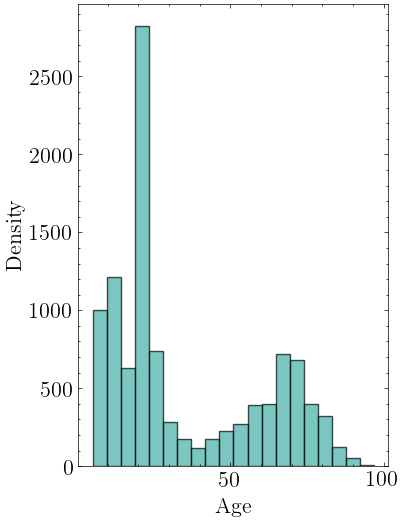

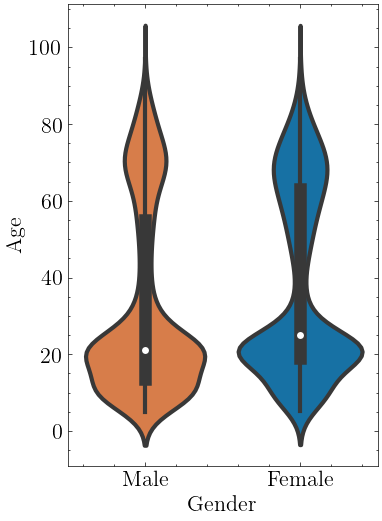

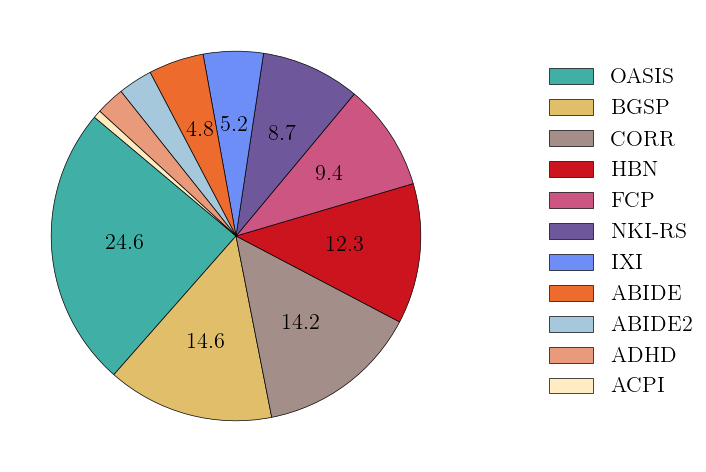

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import seaborn as sns

custom_colors = [
    "#40B0A6",  # muted blue
    "#E1BE6A",  # safety orange
    "#A38E89",  # cooked asparagus green
    "#CC141E",  # brick red
    "#CD5582",  # muted purple
    "#6E579A",  # chestnut brown
    "#6D8EF7",  # raspberry yogurt pink
    "#EC6B2D",  # middle gray
    "#A5C8DD",  # curry yellow-green
    "#E89A7A",  # blue-teal
    "#FFECC2"
]

t = ['Arial', 'Helvetica', 'Times New Roman', 'Times', 'Symbol', 'Courier']

plt.rcParams['font.size'] = 16
plt.style.use(['science', 'vibrant'])
plt.rcParams['font.family'] = t[0]
plt.rcParams['lines.linewidth'] = 3

df = pd.read_excel('Datause.xlsx')
age = df.iloc[:, 5]

def custom_autopct(pct):
    return ('%1.1f%%' % pct) if pct > 4 else ''

# 绘制第一个图
fig1, ax1 = plt.subplots(figsize=(4, 6))
ax1.hist(age, bins=20, alpha=0.7, color=custom_colors[0], edgecolor='black')
# ax1.set_title('Age Distribution', fontsize=17, fontweight='bold', y=-0.25)
ax1.set_xlabel('Age')
ax1.set_ylabel('Density')
fig1.savefig('figures/age_distribution.jpg', dpi=400)

# 绘制第二个图
fig2, ax2 = plt.subplots(figsize=(4, 6))
sns.violinplot(x='gender', y='age', data=df, ax=ax2)
# ax2.set_title('Violin Plot of Age Distribution', fontsize=17, fontweight='bold', y=-0.25)
ax2.set_xlabel('Gender')
ax2.set_ylabel('Age')
ax2.set_xticks(ticks=[0, 1])
ax2.set_xticklabels(labels=['Male', 'Female'])
fig2.savefig('figures/violin_plot.jpg', dpi=400)

# 绘制第三个图
fig3, ax3 = plt.subplots(figsize=(6, 6))
dataset_counts = df['dataset'].value_counts()
colors = sns.color_palette('deep', len(dataset_counts)+2)
wedge_properties = {"edgecolor": "black", 'linewidth': 0.5}
patches, texts, autotexts = ax3.pie(dataset_counts, autopct=custom_autopct, startangle=140, colors=custom_colors, wedgeprops=wedge_properties)
# ax3.set_title('Different Dataset Proportion', fontsize=17, fontweight='bold', y=-0.386)
fig3.legend(patches, dataset_counts.index, loc="center left", bbox_to_anchor=(1, 0.5))
fig3.savefig('figures/dataset_proportion.jpg', dpi=400)

plt.show()


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 模拟数据集

df = pd.read_excel('Datause.xlsx')

# 年龄与性别的关系箱线图
with plt.style.context(['nature','grid']):
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='gender', y='age', data=df)
    plt.title('Age Distribution by Gender')
    plt.xlabel('Gender')
    plt.ylabel('Age')
    plt.xticks(ticks=[0, 1], labels=['Male', 'Female'])  # 假设0是男性，1是女性
    plt.show()
    
    # 性别比例饼图
    gender_counts = df['gender'].value_counts()
    plt.figure(figsize=(8, 6))
    plt.pie(gender_counts, labels=['Male', 'Female'], autopct='%1.1f%%', startangle=140)
    plt.title('Gender Proportion in Dataset')
    plt.show()
    
    # 数据集比例饼图
    dataset_counts = df['dataset'].value_counts()
    plt.figure(figsize=(8, 6))
    plt.pie(dataset_counts, labels=dataset_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title('Dataset Proportion in Dataset')
    plt.show()



OSError: 'nature' not found in the style library and input is not a valid URL or path; see `style.available` for list of available styles

In [95]:

len(cmaps)

222

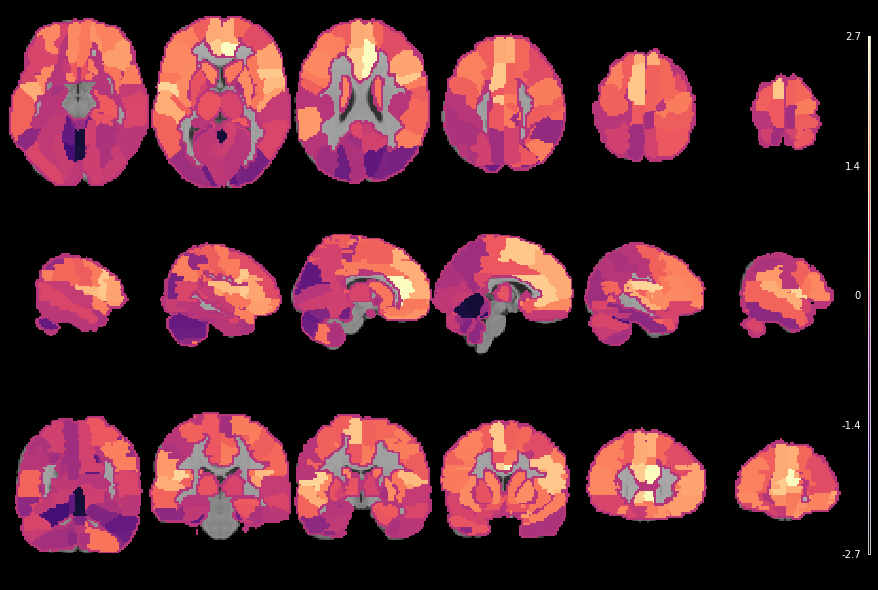

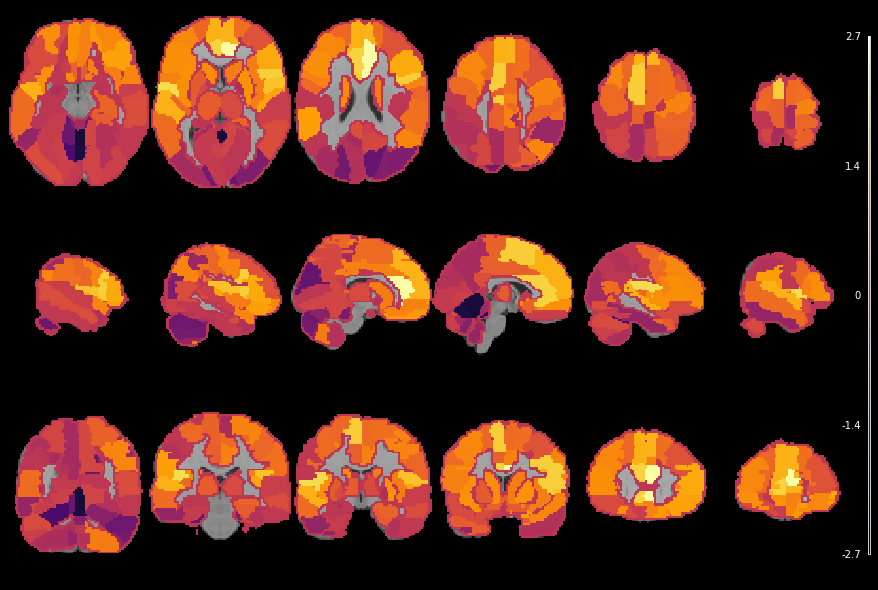

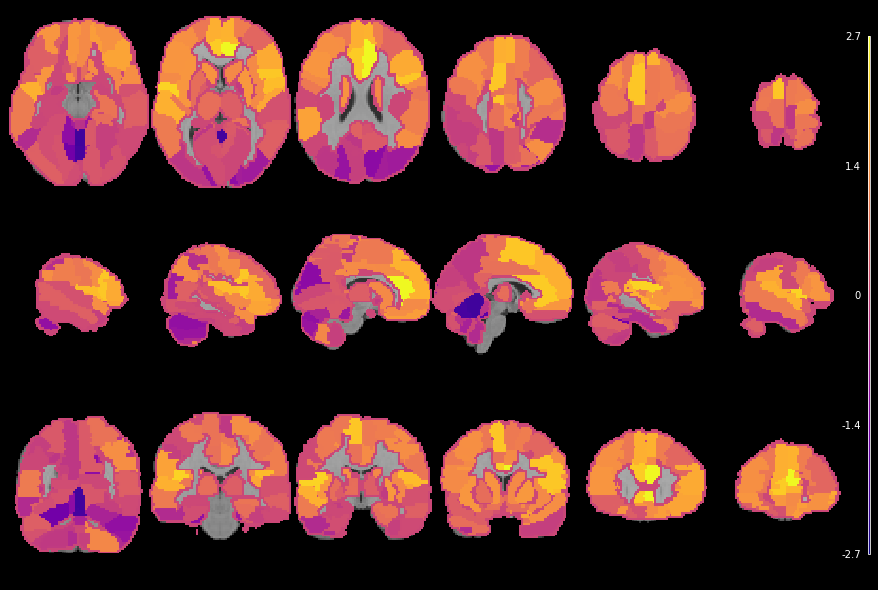

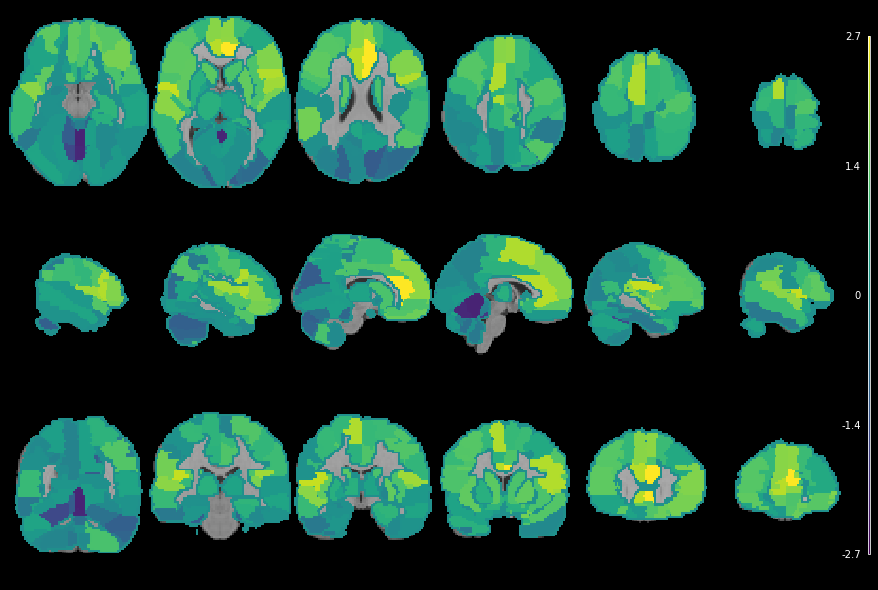

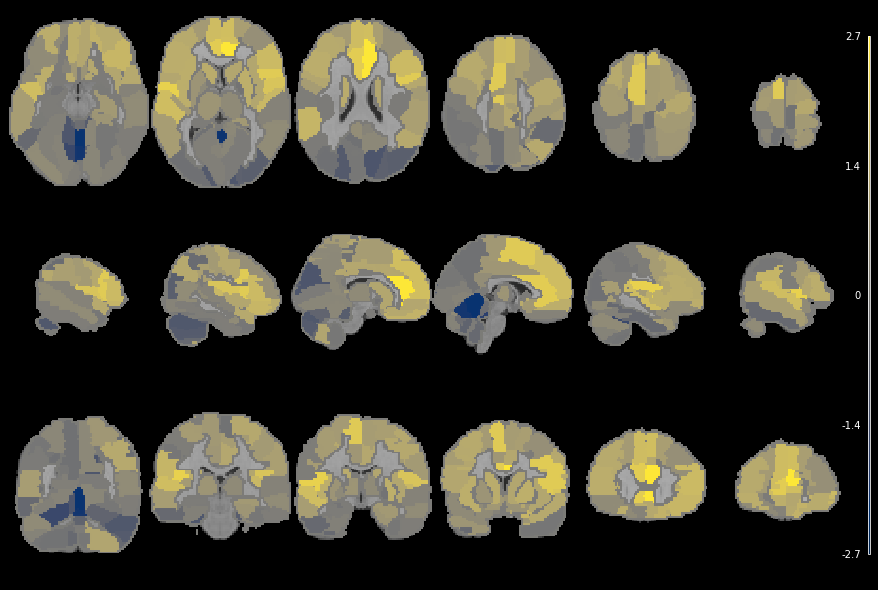

...

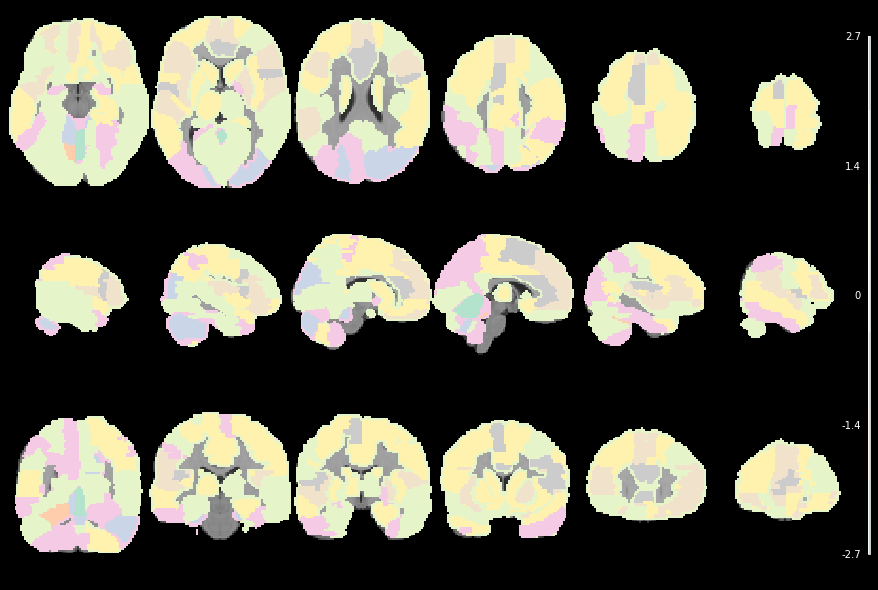

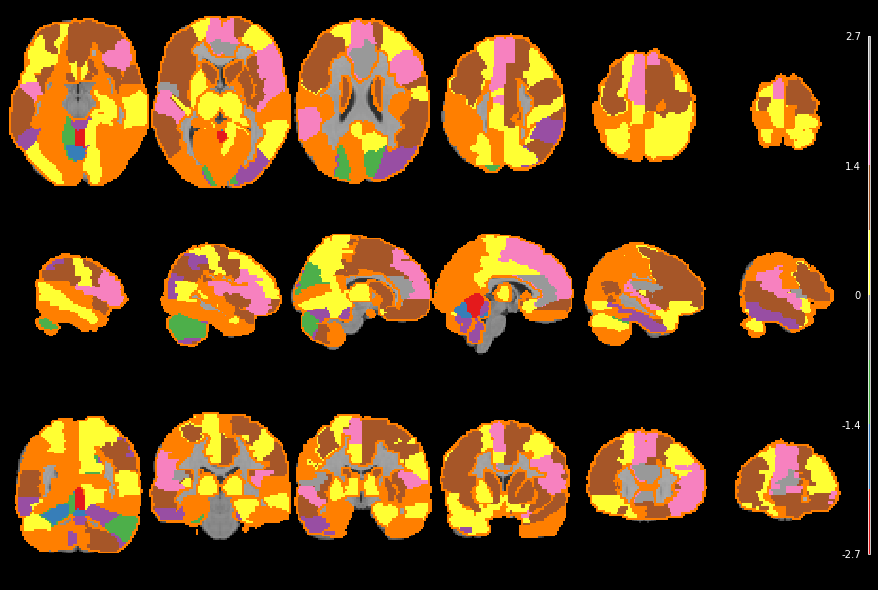

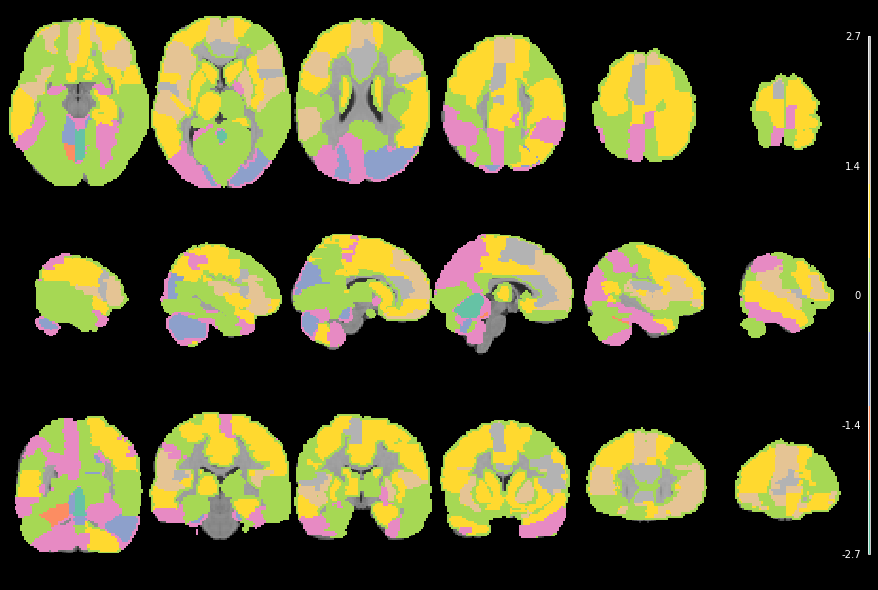

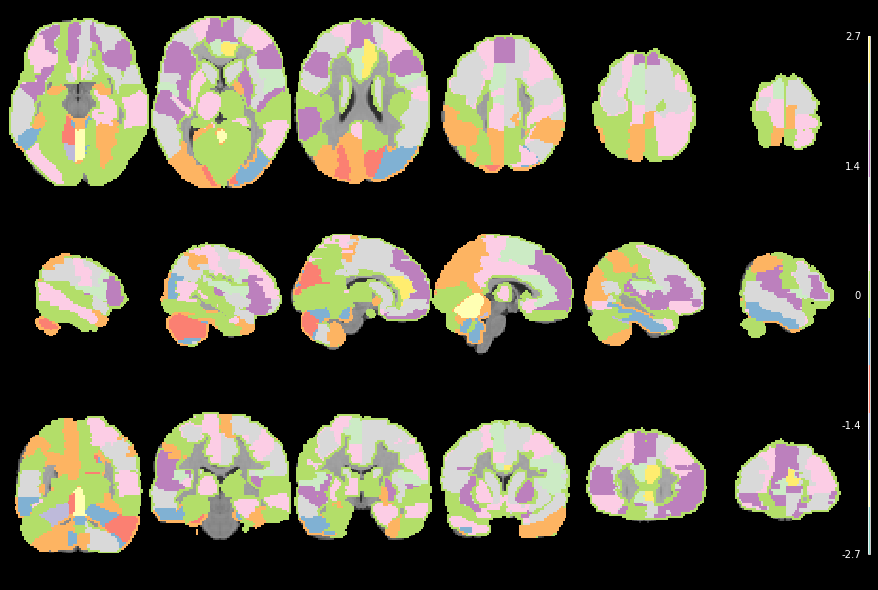

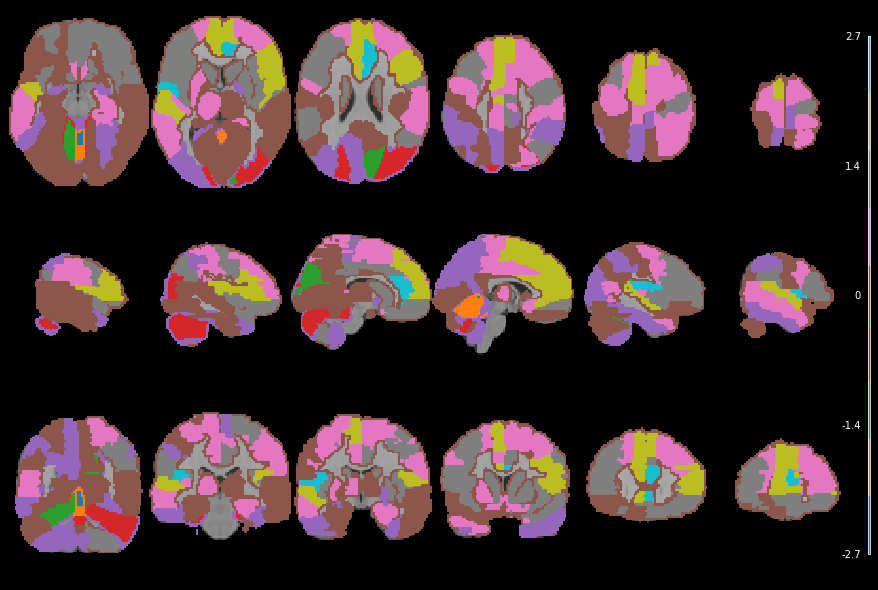

KeyboardInterrupt: 

<Figure size 864x576 with 0 Axes>

In [97]:
# colormap遍历
# 假设df是包含原始数据的DataFrame
# 我们创建一个DataFrame来演示如何进行计算
import numpy as np
import pandas as pd
from nilearn import plotting, image, datasets
from matplotlib.colors import LinearSegmentedColormap
from nilearn.image import math_img
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

df = pd.read_csv('../Data/2.csv')
anatomical_image = datasets.load_mni152_template()

# 定义权重
weight_T = 0.6
weight_D = 0.4

# 计算加权平均值
df['CN-MCL'] = df['CN-MCL-T'] * weight_T + df['CN-MCL-D'] * weight_D
df['CN-AD'] = df['CN-AD-T'] * weight_T + df['CN-AD-D'] * weight_D
df['CN-SZ'] = df['CN-SZ-T'] * weight_T + df['CN-SZ-D'] * weight_D
df['CN-PD'] = df['CN-PD-T'] * weight_T + df['CN-PD-D'] * weight_D
df['MCL-AD'] = df['MCL-AD-T'] * weight_T + df['MCL-AD-D'] * weight_D

# 显示新计算的列
data = df[['ID', 'CN-MCL', 'CN-AD', 'CN-SZ', 'CN-PD', 'MCL-AD']]


# AAL模板文件路径
aal_template = '../Data/ROI_MNI_V4.nii'  # 确保路径正确
cmaps = plt.colormaps()
# 读取AAL模板图像
aal_img = image.load_img(aal_template)

# 创建一个空的数组，与AAL模板相同的形状
brain_data = np.zeros(aal_img.shape)
brain_data2 = np.zeros(aal_img.shape)
# 假设第一列是AAL区域编号，其余列是不同条件下的值
# 以 'CN-MCL' 条件为例进行可视化
condition = 'CN-SZ'  # 可以更改为其他条件

# 将数据映射到脑图谱上
for index, row in data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data[aal_img.get_fdata() == region_index] = value

condition= 'CN-PD'
for index, row in data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data2[aal_img.get_fdata() == region_index] = value

# 创建新的Nifti图像
new_brain_img = image.new_img_like(aal_template, brain_data)
new_brain_img2 = image.new_img_like(aal_template, brain_data2)

# min_val, max_val = np.nanmin(new_brain_img.get_data()), np.nanmax(new_brain_img.get_data())
# normalized_brain_img = math_img("(img - {}) / ({})".format(min_val, max_val - min_val), img=new_brain_img)

# min_val, max_val = np.nanmin(new_brain_img2.get_data()), np.nanmax(new_brain_img2.get_data())
# normalized_brain_img2 = math_img("(img - {}) / ({})".format(min_val, max_val - min_val), img=new_brain_img2)

# 可视化热力图
# fig, axes = plt.subplots(2, 1, figsize=(20, 7))
smooth_img = image.smooth_img(new_brain_img, fwhm=1.5)
# 对于每个大脑图像，使用subplot
for cmap in cmaps:
    fig = plt.figure(figsize=(12, 8))
    fig.patch.set_facecolor('black') 
    plotting.plot_stat_map(smooth_img, bg_img=anatomical_image, display_mode='mosaic', figure=fig,
                                 cut_coords=(6, 6, 6), cmap=cmap, colorbar=True,draw_cross=False
                                 , black_bg=True, annotate=False)
    plt.show()
# fig = plt.figure(figsize=(12, 8))
# fig.patch.set_facecolor('black') 
# plotting.plot_stat_map(smooth_img, bg_img=anatomical_image, display_mode='mosaic', figure=fig,
#                                  cut_coords=(6, 6, 6), cmap='viridis', colorbar=True,draw_cross=False
#                                  , black_bg=True, annotate=False)

# img1_display = plotting.plot_glass_brain(new_brain_img, colorbar=False, cmap='rainbow',
#                           display_mode="ortho", plot_abs=False,
#                           symmetric_cbar=False, axes=axes[0])
# img2_display = plotting.plot_glass_brain(new_brain_img2, colorbar=False, cmap='rainbow',
#                           display_mode="ortho", plot_abs=False,
#                           symmetric_cbar=False, axes=axes[1])


# plotting.show()
# vmin = min(new_brain_img.get_data().min(), new_brain_img2.get_data().min())
# vmax = max(new_brain_img.get_data().max(), new_brain_img2.get_data().max())

# # 创建一个用于颜色条的假图像对象
# norm = Normalize(vmin=vmin, vmax=vmax)
# fake_img = plt.imshow(np.array([[vmin, vmax]]), cmap='rainbow', norm=norm)
# fake_img.set_visible(False)  # 隐藏假图像

# # 添加颜色条
# cbar_ax = fig.add_axes([0, 0.05, 1, 1])
# cbar_ax.set_visible(False)
# fig.colorbar(fake_img, ax=cbar_ax, orientation='horizontal', fraction=0.046, pad=1)
# plt.savefig('figures/SZPD.jpg',dpi=400)
# plt.show()
# fig.colorbar(img1, ax=axes, orientation='horizontal', fraction=0.046, pad=0.04)

# plotting.plot_stat_map(new_brain_img, title=condition, display_mode='mosaic', colorbar=True,cut_coords=(5, 5, 5), cmap='plasma')
# display = plotting.plot_roi(
#     colored_img,
#     title="Selected AAL Regions",
#     display_mode='mosaic',
#     cut_coords=(10, 10, 10),  # 可以调整以获取最佳视图
#     cmap=custom_cmap  # 使用自定义colormap
# )



/home/caojiaxiang/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:211: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.warn("The parameter 'fwhm' for smoothing is specified "


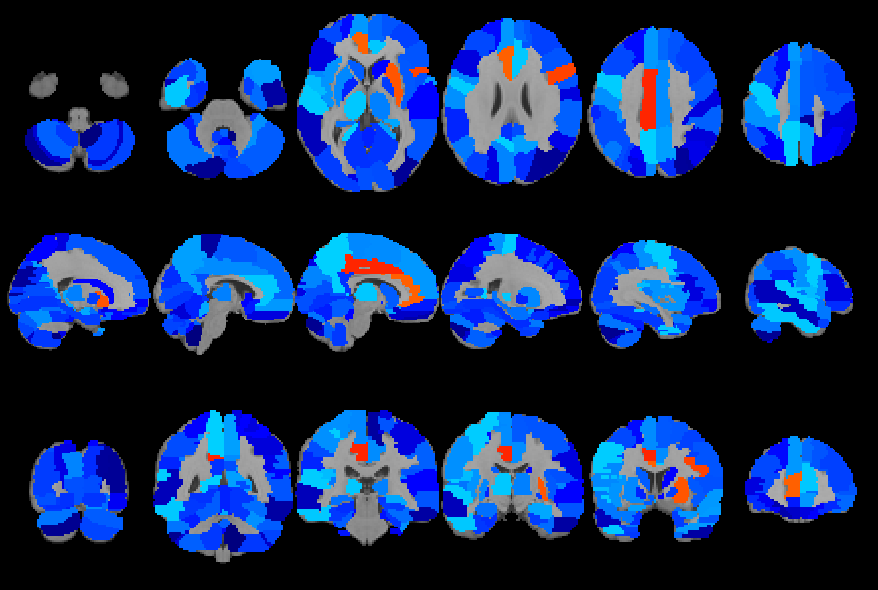

In [141]:
# colormap遍历
# MCI data[data > 2.1] += 0.5 data[data <= 2.1] -= 3
# AD data[data > 2.1] += 0.5 data[data <= 2.1] -= 3
# SZ data[data > 1.5] += 2 data[data <= 1.5] -= 3
# 假设df是包含原始数据的DataFrame
# 我们创建一个DataFrame来演示如何进行计算
import numpy as np
import pandas as pd
from nilearn import plotting, image, datasets
from matplotlib.colors import LinearSegmentedColormap
from nilearn.image import math_img
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

df = pd.read_csv('../Data/2.csv')
anatomical_image = datasets.load_mni152_template()

# 定义权重
weight_T = 0.6
weight_D = 0.4


# 计算加权平均值
df['CN-MCL'] = df['CN-MCL-T'] * weight_T + df['CN-MCL-D'] * weight_D
df['CN-AD'] = df['CN-AD-T'] * weight_T + df['CN-AD-D'] * weight_D
df['CN-SZ'] = df['CN-SZ-T'] * weight_T + df['CN-SZ-D'] * weight_D
df['CN-PD'] = df['CN-PD-T'] * weight_T + df['CN-PD-D'] * weight_D
df['MCL-AD'] = df['MCL-AD-T'] * weight_T + df['MCL-AD-D'] * weight_D

# 显示新计算的列
data = df[['ID', 'CN-MCL', 'CN-AD', 'CN-SZ', 'CN-PD', 'MCL-AD']]


# AAL模板文件路径
aal_template = '../Data/ROI_MNI_V4.nii'  # 确保路径正确

# 读取AAL模板图像
aal_img = image.load_img(aal_template)

# 创建一个空的数组，与AAL模板相同的形状
brain_data = np.zeros(aal_img.shape)

# 假设第一列是AAL区域编号，其余列是不同条件下的值
# 以 'CN-MCL' 条件为例进行可视化
condition = 'CN-PD'  # 可以更改为其他条件
# print(np.unique(aal_img.get_fdata()))
# 将数据映射到脑图谱上
for index, row in data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data[aal_img.get_fdata() == region_index] = value


# 创建新的Nifti图像
new_brain_img = image.new_img_like(aal_template, brain_data)
# new_brain_img2 = image.new_img_like(aal_template, brain_data2)

data = new_brain_img.get_fdata()
data[data == 0] = np.nan  # 将背景值设为NaN
new_brain_img = image.new_img_like(new_brain_img, data)

data = new_brain_img.get_fdata()
# min_data = np.nanmin(data)
# if min_data <= 0:
#     data = data + (-min_data + 1)  # 偏移所有值，使其为正

# 应用对数变换
# scale_factor = 10  # 可以调整这个因子来增加效果
# data = data * scale_factor

# data = np.log(data)
data[data > 1.5] += 1
data[data <= 1.5] -= 3
new_brain_img = image.new_img_like(new_brain_img, data)
smooth_img = image.smooth_img(new_brain_img, fwhm=0)
# 可以选择性地重新归一化数据
# min_val, max_val = np.nanmin(data), np.nanmax(data)
# normalized_data = (data - min_val) / (max_val - min_val)


# min_val, max_val = np.nanmin(new_brain_img2.get_data()), np.nanmax(new_brain_img2.get_data())
# normalized_brain_img2 = math_img("(img - {}) / ({})".format(min_val, max_val - min_val), img=new_brain_img2)
normalized_data = smooth_img.get_fdata()

normalized_data[np.isnan(normalized_data)] = 0
normalized_brain_img = image.new_img_like(new_brain_img, normalized_data)

# 可视化热力图
# fig, axes = plt.subplots(2, 1, figsize=(20, 7))

# 对于每个大脑图像，使用subplot

fig = plt.figure(figsize=(12, 8))
fig.patch.set_facecolor('black') 
plotting.plot_stat_map(normalized_brain_img, bg_img=anatomical_image, display_mode='mosaic', figure=fig,
                             cut_coords=(6, 6, 6), cmap='jet', colorbar=False,draw_cross=False
                             , black_bg=True, annotate=False)
plt.savefig('figures/PD.jpg',dpi=400)
plt.show()



/home/caojiaxiang/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:211: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.warn("The parameter 'fwhm' for smoothing is specified "


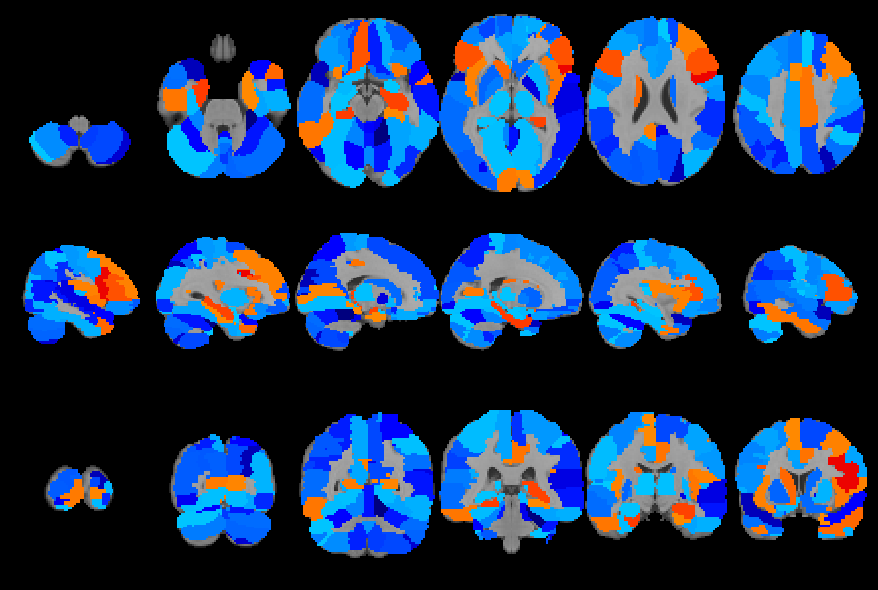

In [166]:
# 分男女 nan.csv其实是女性，nv.csv其实是男性
# 女性
# MCI data[data > 2.1] += 0.5 data[data <= 2.1] -= 3
# AD data[data > 2.1] += 0.5 data[data <= 2.1] -= 3

# 假设df是包含原始数据的DataFrame
# 我们创建一个DataFrame来演示如何进行计算
import numpy as np
import pandas as pd
from nilearn import plotting, image, datasets
from matplotlib.colors import LinearSegmentedColormap
from nilearn.image import math_img
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

df = pd.read_csv('../Data/nan.csv')
anatomical_image = datasets.load_mni152_template()

# 定义权重
weight_T = 0.6
weight_D = 0.4


# 计算加权平均值
df['CN-MCL'] = df['CN-MCL-T'] * weight_T + df['CN-MCL-D'] * weight_D
df['CN-AD'] = df['CN-AD-T'] * weight_T + df['CN-AD-D'] * weight_D
df['CN-SZ'] = df['CN-SZ-T'] * weight_T + df['CN-SZ-D'] * weight_D
df['CN-PD'] = df['CN-PD-T'] * weight_T + df['CN-PD-D'] * weight_D
df['MCL-AD'] = df['MCL-AD-T'] * weight_T + df['MCL-AD-D'] * weight_D

# 显示新计算的列
Data = df[['ID', 'CN-MCL', 'CN-AD', 'CN-SZ', 'CN-PD', 'MCL-AD']]


# AAL模板文件路径
aal_template = '../Data/ROI_MNI_V4.nii'  # 确保路径正确

# 读取AAL模板图像
aal_img = image.load_img(aal_template)

# 创建一个空的数组，与AAL模板相同的形状
# ___________________________________________________________________
brain_data = np.zeros(aal_img.shape)

# 假设第一列是AAL区域编号，其余列是不同条件下的值
# 以 'CN-MCL' 条件为例进行可视化
condition = 'CN-AD'  # 可以更改为其他条件
# print(np.unique(aal_img.get_fdata()))
# 将数据映射到脑图谱上
for index, row in Data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data[aal_img.get_fdata() == region_index] = value


# 创建新的Nifti图像
new_brain_img = image.new_img_like(aal_template, brain_data)
# new_brain_img2 = image.new_img_like(aal_template, brain_data2)

data = new_brain_img.get_fdata()
data[data == 0] = np.nan  # 将背景值设为NaN
new_brain_img = image.new_img_like(new_brain_img, data)

data = new_brain_img.get_fdata()
# min_data = np.nanmin(data)
# if min_data <= 0:
#     data = data + (-min_data + 1)  # 偏移所有值，使其为正

# 应用对数变换
# scale_factor = 10  # 可以调整这个因子来增加效果
# data = data * scale_factor

# data = np.log(data)
data[data > 1.4] += 1 
data[data <= 1.4] -= 3
new_brain_img = image.new_img_like(new_brain_img, data)
smooth_img = image.smooth_img(new_brain_img, fwhm=0)
# 可以选择性地重新归一化数据
# min_val, max_val = np.nanmin(data), np.nanmax(data)
# normalized_data = (data - min_val) / (max_val - min_val)


# min_val, max_val = np.nanmin(new_brain_img2.get_data()), np.nanmax(new_brain_img2.get_data())
# normalized_brain_img2 = math_img("(img - {}) / ({})".format(min_val, max_val - min_val), img=new_brain_img2)
normalized_data = smooth_img.get_fdata()

normalized_data[np.isnan(normalized_data)] = 0
normalized_brain_img = image.new_img_like(new_brain_img, normalized_data)
# ___________________________________________________________________

# 可视化热力图
# fig, axes = plt.subplots(2, 1, figsize=(20, 7))

# 对于每个大脑图像，使用subplot

fig = plt.figure(figsize=(12, 8))
fig.patch.set_facecolor('black') 
plotting.plot_stat_map(normalized_brain_img, bg_img=anatomical_image, display_mode='mosaic', figure=fig,
                             cut_coords=(6, 6, 6), cmap='jet', colorbar=False,draw_cross=False
                             , black_bg=True, annotate=False)

plt.savefig('figures/nv_AD.jpg',dpi=400)
plt.show()

/home/caojiaxiang/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:211: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.warn("The parameter 'fwhm' for smoothing is specified "


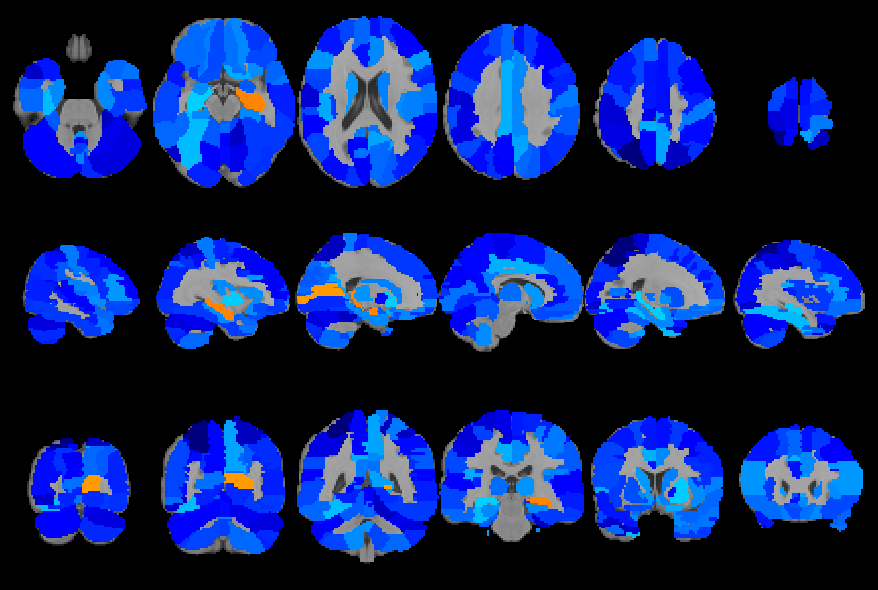

In [168]:
# 分男女 nan.csv其实是女性，nv.csv其实是男性
# 男性
# MCI data[data > 2.1] += 0.5 data[data <= 2.1] -= 3
# AD data[data > 2.1] += 0.5 data[data <= 2.1] -= 3

# 假设df是包含原始数据的DataFrame
# 我们创建一个DataFrame来演示如何进行计算
import numpy as np
import pandas as pd
from nilearn import plotting, image, datasets
from matplotlib.colors import LinearSegmentedColormap
from nilearn.image import math_img
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

df = pd.read_csv('../Data/nv.csv')
anatomical_image = datasets.load_mni152_template()

# 定义权重
weight_T = 0.6
weight_D = 0.4


# 计算加权平均值
df['CN-MCL'] = df['CN-MCL-T'] * weight_T + df['CN-MCL-D'] * weight_D
df['CN-AD'] = df['CN-AD-T'] * weight_T + df['CN-AD-D'] * weight_D
df['CN-SZ'] = df['CN-SZ-T'] * weight_T + df['CN-SZ-D'] * weight_D
df['CN-PD'] = df['CN-PD-T'] * weight_T + df['CN-PD-D'] * weight_D
df['MCL-AD'] = df['MCL-AD-T'] * weight_T + df['MCL-AD-D'] * weight_D

# 显示新计算的列
Data = df[['ID', 'CN-MCL', 'CN-AD', 'CN-SZ', 'CN-PD', 'MCL-AD']]


# AAL模板文件路径
aal_template = '../Data/ROI_MNI_V4.nii'  # 确保路径正确

# 读取AAL模板图像
aal_img = image.load_img(aal_template)

# 创建一个空的数组，与AAL模板相同的形状
# ___________________________________________________________________
brain_data = np.zeros(aal_img.shape)

# 假设第一列是AAL区域编号，其余列是不同条件下的值
# 以 'CN-MCL' 条件为例进行可视化
condition = 'CN-MCL'  # 可以更改为其他条件
# print(np.unique(aal_img.get_fdata()))
# 将数据映射到脑图谱上
for index, row in Data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data[aal_img.get_fdata() == region_index] = value


# 创建新的Nifti图像
new_brain_img = image.new_img_like(aal_template, brain_data)
# new_brain_img2 = image.new_img_like(aal_template, brain_data2)

data = new_brain_img.get_fdata()
data[data == 0] = np.nan  # 将背景值设为NaN
new_brain_img = image.new_img_like(new_brain_img, data)

data = new_brain_img.get_fdata()
# min_data = np.nanmin(data)
# if min_data <= 0:
#     data = data + (-min_data + 1)  # 偏移所有值，使其为正

# 应用对数变换
# scale_factor = 10  # 可以调整这个因子来增加效果
# data = data * scale_factor

# data = np.log(data)
data[data > 1.36] += 1
data[data <= 1.36] -= 3
new_brain_img = image.new_img_like(new_brain_img, data)
smooth_img = image.smooth_img(new_brain_img, fwhm=0)
# 可以选择性地重新归一化数据
# min_val, max_val = np.nanmin(data), np.nanmax(data)
# normalized_data = (data - min_val) / (max_val - min_val)


# min_val, max_val = np.nanmin(new_brain_img2.get_data()), np.nanmax(new_brain_img2.get_data())
# normalized_brain_img2 = math_img("(img - {}) / ({})".format(min_val, max_val - min_val), img=new_brain_img2)
normalized_data = smooth_img.get_fdata()

normalized_data[np.isnan(normalized_data)] = 0
normalized_brain_img = image.new_img_like(new_brain_img, normalized_data)
# ___________________________________________________________________

# 可视化热力图
# fig, axes = plt.subplots(2, 1, figsize=(20, 7))

# 对于每个大脑图像，使用subplot

fig = plt.figure(figsize=(12, 8))
fig.patch.set_facecolor('black') 
plotting.plot_stat_map(normalized_brain_img, bg_img=anatomical_image, display_mode='mosaic', figure=fig,
                             cut_coords=(6, 6, 6), cmap='jet', colorbar=False,draw_cross=False
                             , black_bg=True, annotate=False)

plt.savefig('figures/nan_MCL.jpg',dpi=400)
plt.show()

0.7736473884307271


/home/caojiaxiang/anaconda3/lib/python3.9/site-packages/nilearn/image/image.py:211: UserWarning: The parameter 'fwhm' for smoothing is specified as 0. Setting it to None (no smoothing will be performed)
  warnings.warn("The parameter 'fwhm' for smoothing is specified "


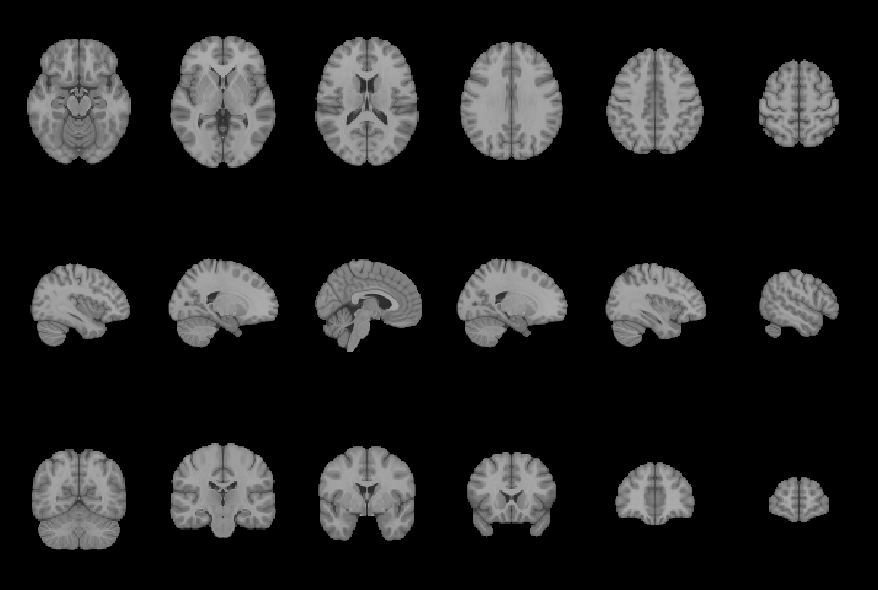

In [182]:
# 分年龄 nan.csv其实是女性，nv.csv其实是男性
# 男性
# MCI data[data > 2.1] += 0.5 data[data <= 2.1] -= 3
# AD data[data > 2.1] += 0.5 data[data <= 2.1] -= 3

# 假设df是包含原始数据的DataFrame
# 我们创建一个DataFrame来演示如何进行计算
import numpy as np
import pandas as pd
from nilearn import plotting, image, datasets
from matplotlib.colors import LinearSegmentedColormap
from nilearn.image import math_img
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

df = pd.read_csv('../Data/ageGroup1.csv')
anatomical_image = datasets.load_mni152_template()

# 定义权重
weight_T = 0.6
weight_D = 0.4


# 计算加权平均值
df['CN-MCL'] = df['CN-MCL-T'] * weight_T + df['CN-MCL-D'] * weight_D
# df['CN-AD'] = df['CN-AD-T'] * weight_T + df['CN-AD-D'] * weight_D
# df['CN-SZ'] = df['CN-SZ-T'] * weight_T + df['CN-SZ-D'] * weight_D
# df['CN-PD'] = df['CN-PD-T'] * weight_T + df['CN-PD-D'] * weight_D
# df['MCL-AD'] = df['MCL-AD-T'] * weight_T + df['MCL-AD-D'] * weight_D

# 显示新计算的列
Data = df[['ID', 'CN-MCL']]
# Data = df[['ID', 'CN-MCL', 'CN-AD', 'CN-SZ', 'CN-PD', 'MCL-AD']]

# AAL模板文件路径
aal_template = '../Data/ROI_MNI_V4.nii'  # 确保路径正确

# 读取AAL模板图像
aal_img = image.load_img(aal_template)

# 创建一个空的数组，与AAL模板相同的形状
# ___________________________________________________________________
brain_data = np.zeros(aal_img.shape)

# 假设第一列是AAL区域编号，其余列是不同条件下的值
# 以 'CN-MCL' 条件为例进行可视化
condition = 'CN-MCL'  # 可以更改为其他条件
# print(np.unique(aal_img.get_fdata()))
# 将数据映射到脑图谱上
for index, row in Data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data[aal_img.get_fdata() == region_index] = value


# 创建新的Nifti图像
new_brain_img = image.new_img_like(aal_template, brain_data)
# new_brain_img2 = image.new_img_like(aal_template, brain_data2)

data = new_brain_img.get_fdata()
data[data == 0] = np.nan  # 将背景值设为NaN
new_brain_img = image.new_img_like(new_brain_img, data)

data = new_brain_img.get_fdata()

min_new = -4
max_new = 4
original_value = 1.7


data_min = data[np.isnan(data) == False].min()  # 排除NaN找到最小值
data_max = data[np.isnan(data) == False].max()  # 排除NaN找到最大值

# 应用线性映射
data_mapped = (data - data_min) * (max_new - min_new) / (data_max - data_min) + min_new

mapped_value = (original_value - data_min) * (max_new - min_new) / (data_max - data_min) + min_new

print(mapped_value)

# 更新data_mapped中NaN值的处理，保留为NaN
data_mapped[np.isnan(data)] = np.nan
data = data_mapped


# data[data > 1.7] += 1
# data[data <= 1.7] -= 3
data[data > 1] += 2.5
data[data <= 1] -= 3
new_brain_img = image.new_img_like(new_brain_img, data)
smooth_img = image.smooth_img(new_brain_img, fwhm=0)
# 可以选择性地重新归一化数据
# min_val, max_val = np.nanmin(data), np.nanmax(data)
# normalized_data = (data - min_val) / (max_val - min_val)


# min_val, max_val = np.nanmin(new_brain_img2.get_data()), np.nanmax(new_brain_img2.get_data())
# normalized_brain_img2 = math_img("(img - {}) / ({})".format(min_val, max_val - min_val), img=new_brain_img2)
normalized_data = smooth_img.get_fdata()

normalized_data[np.isnan(normalized_data)] = 0
normalized_brain_img = image.new_img_like(new_brain_img, normalized_data)
# ___________________________________________________________________

# 可视化热力图
# fig, axes = plt.subplots(2, 1, figsize=(20, 7))

# 对于每个大脑图像，使用subplot

fig = plt.figure(figsize=(12, 8))
fig.patch.set_facecolor('black') 

# plotting.plot_anat(anatomical_image, display_mode='mosaic', figure=fig,
#                    cut_coords=(6, 6, 6), colorbar=False,draw_cross=False, 
#                    black_bg=True, annotate=False)

plotting.plot_stat_map(normalized_brain_img,bg_img=anatomical_image, display_mode='mosaic', figure=fig,
                             cut_coords=(6, 6, 6), cmap='jet', colorbar=True,draw_cross=False
                             , black_bg=True, annotate=False)

plt.savefig('figures/65_MCL.jpg',dpi=400)
plt.show()

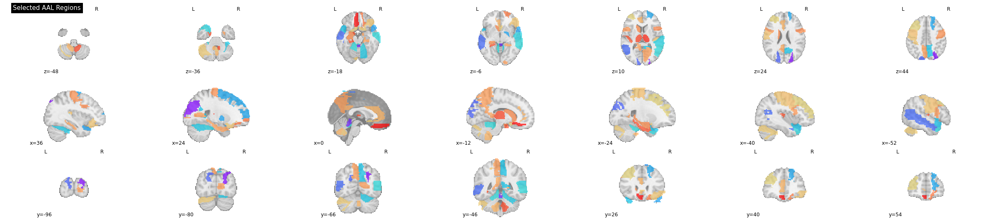

In [68]:
condition= 'MCL-AD'
brain_data3 = np.zeros(aal_img.shape)
for index, row in data.iterrows():
    region_index = int(row['ID'])  # 假设AAL区域编号列名为'ID'
    value = row[condition]
    brain_data3[aal_img.get_fdata() == region_index] = value

# 创建新的Nifti图像
new_brain_img3 = image.new_img_like(aal_template, brain_data3)
display = plotting.plot_roi(
    new_brain_img3,
    title="Selected AAL Regions",
    display_mode='mosaic',
    cut_coords=(7, 7, 7),  # 可以调整以获取最佳视图
    cmap='rainbow'  # 使用自定义colormap
)
plotting.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn import plotting
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
plt.rcParams['font.family'] = "Microsoft YaHei"
# 步骤1: 读取AAL脑图谱
aal_atlas_nii = 'ROI_MNI_V4.nii'  # 替换为你的AAL图谱文件路径
aal_atlas = nib.load(aal_atlas_nii)
aal_data = aal_atlas.get_fdata()
shape = aal_atlas.shape
print(f"每个维度的体素大小: {shape}")
# 指定你感兴趣的AAL脑区的标签
interested_regions = [6211,2101,2311,2001,4102,2201,7101,4022,7021]  # 举例，替换为实际标签
# interested_regions = [6211]  # 举例，替换为实际标签
names = ["缘上回","背外侧额上回","三角部额下回","中央前回","海马","额中回","丘脑","后扣带回","豆状苍白球"]
# 步骤2: 创建自定义colormap
# 为你选择的每个脑区分配一个颜色

# colors = [
#     '#FF0000',  # 红色
# ]
colors = [
    '#FF0000',  # 红色
    '#00FF00',  # 绿色
    '#0000FF',  # 蓝色
    '#FFFF00',  # 黄色
    '#FFA500',  # 橙色
    '#800080',  # 紫色
    '#FFC0CB',  # 粉红色
    '#A52A2A',  # 棕色
    '#00FFFF'   # 青色
]

# 创建一个字典，每个感兴趣的区域对应一个颜色
color_dict = {region: color for region, color in zip(interested_regions, colors)}
# 初始化背景颜色为灰色
color_dict[0] = '#808080'  # 灰色

# 创建一个新的数据数组，用于存储颜色索引
colored_data = np.zeros_like(aal_data)

# 将感兴趣的脑区设置为对应的颜色索引
for region in interested_regions:
    colored_data[aal_data == region] = interested_regions.index(region) + 1
colored_img = nib.Nifti1Image(colored_data, aal_atlas.affine)

# 使用 plot_roi 绘制
display = plotting.plot_roi(
    colored_img,
    title="Selected AAL Regions",
    display_mode='mosaic',
    cut_coords=(10, 10, 10),  # 可以调整以获取最佳视图
    cmap=custom_cmap  # 使用自定义colormap
)

plotting.show()
# 创建图例
fig, ax = plt.subplots(figsize=(5, 5))  # 调整大小以适应图例

# 为每个感兴趣的区域添加一个代表性的点和标签
for region_name, color in zip(interested_regions, colors):
    ax.scatter([], [], c=color, label=region_name)

# 添加图例
ax.legend(scatterpoints=1, frameon=False, labelspacing=1, title='AAL Regions')

# 隐藏坐标轴
ax.axis('off')

plt.show()

<Figure size 1200x600 with 0 Axes>

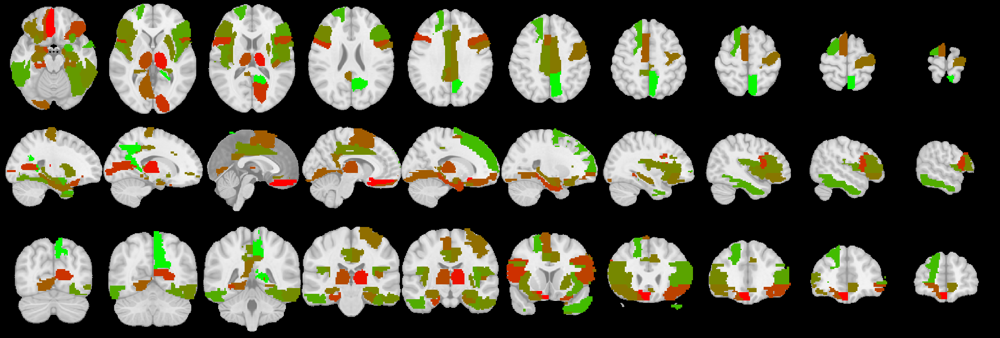

In [38]:
# MCI和AD 单独分析
import matplotlib.pyplot as plt 
from nilearn import plotting, image, datasets
import matplotlib.lines as lines
from matplotlib.colors import LinearSegmentedColormap
import numpy as np 
str1 = "CN VS MCI 脑区重要性排序： 4102 2332 6402 2312 6302 2002 2101 4202 4101 3002 2311 7012 4021 4201 8212 4112 2331 2402 7101 2612 2102 8102 2321 2211 4011 8201 6202 8302 2302 5102 9140 8301 5012 8122 5402 2611 4111 2401 3001 6002 5002 4012 2322 2301 2701 7102 2111 5021 6221"
str2 = "CN VS AD  脑区重要性排序： 2002 7101 4102 2701 4101 4201 4021 2332 4112 2302 7102 8102 7012 2311 4111 2312 5002 2612 2301 2321 2112 3002 7001 2322 2331 2101 2401 4202 4011 4001 9051 8302 2111 8212 9072 2611 5021 2501 9001 4012 3001 2602 6302 5402 6001 8301 9071"
a = str1.split(' ')[4:]
b = str2.split(' ')[5:]

# 创建一个自定义的colormap
# 负值将映射到绿色，正值将映射到红色
colors = [(0, 1, 0), (1, 0, 0)]  # R -> G -> B
n_bins = 100  # 离散化的颜色数
cmap_name = 'custom_red_green'
anatomical_image = datasets.load_mni152_template()
# 创建LinearSegmentedColormap
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# 使用字典来存储脑区和对应的差值  
result = {}
fig = plt.figure(figsize=(12, 6))
# 对于str1中的每个元素，查找其在str2中的位置，并计算差值  
for i, item in enumerate(a):  
    if item in b:  
        result[item] = i - b.index(item)  # i是str1中元素的位置，str2_list.index(item)是str2中元素的位置  
    else:  
        result[item] = 2 * len(a) - i # 如果在str1中但不在str2中，赋值为-len(str2_list)
for i, item in enumerate(b):  
    if item not in a:  
        
        result[item] = -2 * len(a) + i  # 如果在str2中但不在str1中，赋值为原来的值的相反数  

sorted_items = sorted(result.items(), key=lambda item: item[1])
category1 = {}  # 第二项 > 0 且 < len(a) 相比于MCI，AD排序靠前，越大，排序越靠前
category2 = {}  # 第二项 < 0 且 > -len(a) 相比于MCI，AD排序靠后，越小，排序AD中排序越靠后
category3 = {}  # 第二项 < -len(a) AD独有，越小AD排序越靠前
category4 = {}  # 第二项 > len(a) MCI独有，越大MCI排序越靠前

# 分类
for item in sorted_items:
    key, value = item
    if 0 < value < len(a):
        category1[key] = value
    elif -len(a) < value < 0:
        category2[key] = value
    elif value < -len(a):
        category3[key] = value
    elif value > len(a):
        category4[key] = value

aal_template = '../Data/ROI_MNI_V4.nii'  # 确保路径正确

# 读取AAL模板图像
aal_img = image.load_img(aal_template)

# 创建一个空的数组，与AAL模板相同的形状
brain_data = np.zeros(aal_img.shape)

combined_categories = {**category1, **category2}

# AAL模板的数据
aal_data = aal_img.get_fdata()

# 遍历合并后的字典，映射脑区编号到AAL模板
for region_number, value in combined_categories.items():
    # 将字典中的脑区编号转换为整数
    region_number = int(region_number)
    # 在AAL模板中找到对应的脑区并替换值
    brain_data[aal_data == region_number] = value

new_brain_img = image.new_img_like(aal_template, brain_data)

fig = plt.figure(figsize=(24, 8))
fig.patch.set_facecolor('black') 
plotting.plot_stat_map(new_brain_img, bg_img=anatomical_image, display_mode='mosaic', figure=fig,
                             cut_coords=(10, 10, 10), cmap=custom_cmap, colorbar=False,draw_cross=False
                             , black_bg=False, annotate=False)

plt.savefig('figures/MCIAD.jpg',dpi=400)
plt.show()


In [6]:
import os
gpu_ids = "0"
#     gpu_ids = "4,5,6,7"
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_ids  
import pandas as pd
from audtorch.metrics.functional import pearsonr
from mydata1D import dataGenerator,get_Dataframe_Data
from mydata1T import dataGenerator as dataG
from torch import nn
from tqdm import tqdm
from torch.utils.data import Dataset,ConcatDataset,DataLoader
import warnings
import torch
from torch.optim.lr_scheduler import LambdaLR,CosineAnnealingLR
from model.au128 import UNetWithTransformerEncoder
import logging  
from torch.nn.parallel import DistributedDataParallel as DDP
from torch.utils.data.distributed import DistributedSampler
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.cuda.amp import GradScaler, autocast
from accelerate import Accelerator
from utils.utils_datasetDisease import *
import lmdb
from noise import UNetn
import pytorch_warmup as warmup
from model.SQET import SQET

torch.backends.cuda.matmul.allow_tf32 = False
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.allow_tf32 = True


class NoiseModel(nn.Module):
    def __init__(
        self,
        util_model,
        learning_rate=1e-3,
        noise_coeff=15,
        min_scale=0,
        max_scale=1,
        batch_size=16,
        pretrained=None
    ):
        super().__init__()
        self.util_model = util_model
        # for layer in self.util_model.layers:
        #     layer.trainable = False
        for param in self.util_model.parameters():
            param.requires_grad = False

        self.noise_model = UNetn()


        self.normal = torch.distributions.normal.Normal(0, 1)
        self.learning_rate = learning_rate
        self.min_scale = min_scale
        self.max_scale = max_scale
        self.noise_coeff = noise_coeff
        self.criterion = nn.MSELoss()
        self.batch_size = batch_size

    def forward(self, x):

        B = torch.sigmoid(self.noise_model(x))

        # sample from normal  distribution
#         epsilon = self.normal.sample(B.shape).type_as(B)

        # reparametiation trick
        # print('B',torch.mean(B),torch.max(B),torch.min(B))
        # print('epsilon',torch.mean(epsilon),torch.max(epsilon),torch.min(epsilon))
        noise = B * 10
        age_pred = self.util_model((x + noise).float()).squeeze()

        return B,noise,age_pred

def train(model,criterion,L1,optimizer,train_loader,epoch,epochs,lr,k,scheduler,warmup_scheduler,device):
    model.train()
    Loss = 0
    BS = 0
    MSE = 0
    bloss = 10000
    Res = []
    samples = []
    with torch.no_grad():
        for imgs,age in tqdm(train_loader):
            samples.append(imgs)
            optimizer.zero_grad()
            imgs, age = imgs.to(device), age.to(device)
            B,noise,age_pred = model(imgs)
            bs = torch.mean(B.log())

            mse = criterion(age_pred.float(), age.float())
            loss =  mse * 1.5 - torch.var(B) * 10 ** 2 - 15 * bs
            Loss += loss.data
            BS += bs.data
            MSE += mse.data
            Res.append(B)
            

    #         print(f'loss:{loss}-----mse:{mse}---------bs:{bs}')
        # 将tensor列表堆叠到一个新的维度（例如，第0维）  
        Res = torch.stack(Res, dim=0)  
        S = torch.stack(samples, dim=0)  
        # 现在，stacked_tensors 的维度是 [5, 91, 91, 109]  

        # 沿着第0维（即tensor的列表维度）计算平均值  
        Res = Res.mean(dim=0)
        S = S.mean(dim=0)
        Loss = Loss / len(train_loader)
        BS = BS / len(train_loader)
        MSE = MSE / len(train_loader)
        print(f'{epoch}/{epochs}-------Loss:{Loss}----BS:{BS}----MSE:{MSE}')
    return Res,S
    


def main(dataframe_paths, env, batch_size, epochs,k):
    accelerator = Accelerator(split_batches=True)

    # 数据准备

    
    # 实例化dataGenerator
    # train_dataset = dataGenerator(train_IXI, lmdb_path)
    # val_dataset = dataGenerator(val_IXI, lmdb_path)
    train_dataset = my_dataset(dataframe_paths[0], env, True, 0)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=0, pin_memory=True,drop_last=True)    # nw 一般为0


    # train_dataset = dataGenerator(train_IXI, lmdb_path)
    # val_dataset = dataGenerator(val_IXI, lmdb_path)

    # train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=0, pin_memory=True,drop_last=True)
    # val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=0, pin_memory=True,drop_last=True)
    # 模型配置
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model_path = "./results_checkpoint/Unet3/checkpoint_best.tar"

    util_model = UNetWithTransformerEncoder(32, 8, 6, 128, 0.1).to(device)
    checkpoint1 = torch.load(model_path)
    util_model.load_state_dict(checkpoint1['model_state_dict'], strict=False)
    model = NoiseModel(util_model).to(device)
    state_dict = torch.load(f"unoise{k}.pth")

    # 应用状态字典到模型中
    model.load_state_dict(state_dict)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-1)
    
    # optimizer = torch.optim.SGD(params=model.parameters(),lr = 0.00001, momentum=0.5)
    #     scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.9, patience=2, verbose=False, threshold=0.0001, threshold_mode='rel', cooldown=0, min_lr=1e-8, eps=1e-08)
    # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.7, patience=2, verbose=False, threshold=0.0001, threshold_mode='rel', cooldown=0, min_lr=1e-6, eps=1e-08)
    scheduler =  CosineAnnealingLR(optimizer, T_max=50, eta_min=1e-5)
    # scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=100, T_mult=2, eta_min=7e-6)
    # scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
    #     optimizer = torch.optim.AdamW(model.parameters(), lr=args.learning_rate,
    #                                   weight_decay=args.weight_decay)
    #     # TODO 学习率
    #     scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=500, T_mult=2, eta_min=2e-5)
    #     # scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.98)
    warmup_scheduler = warmup.LinearWarmup(optimizer, warmup_period=4)
    # accelerator.print('training...')
    criterion = nn.MSELoss()
    L1 = nn.L1Loss()
    epoch = 1
    # 训练循环

        # ... 训练和验证过程 ...
        # 记录日志、保存模型等
    lr = optimizer.state_dict()['param_groups'][0]['lr']
    return train(model,criterion,L1,optimizer,train_loader,epoch,epochs,lr,k,scheduler,warmup_scheduler,device)
        


            
            
if __name__ == '__main__':
    
    
    k = 'PD'
    dataframe_paths = [f'csvs/{k}.csv', f'csvs/{k}.csv']
    # dataframe_paths = ['5-fold/train_2.csv', '5-fold/val_2.csv']
    batch_size = 1
    epochs = 200
    env = lmdb.open("/home/caojiaxiang/disease_data", readonly=True, lock=False, readahead=False,
                        meminit=False)
    B,S = main(dataframe_paths, env, batch_size, epochs,k)


Detected kernel version 4.15.0, which is below the recommended minimum of 5.5.0; this can cause the process to hang. It is recommended to upgrade the kernel to the minimum version or higher.
100%|██████████| 166/166 [00:21<00:00,  7.62it/s]


1/200-------Loss:49.714237213134766----BS:-0.3146972060203552----MSE:35.294734954833984


In [7]:
from monai import transforms

A = 1-B.squeeze().cpu().numpy() 




S1 = S.squeeze().numpy()




print(A.shape)
print(S1.shape)

(128, 128, 128)
(128, 128, 128)


(array([1.550726e+06, 4.241700e+04, 4.962200e+04, 6.187400e+04,
        7.967900e+04, 1.142890e+05, 1.833140e+05, 1.511800e+04,
        1.060000e+02, 7.000000e+00]),
 array([0.        , 0.07479408, 0.14958815, 0.22438224, 0.29917631,
        0.37397039, 0.44876447, 0.52355856, 0.59835261, 0.67314672,
        0.74794078]),
 <BarContainer object of 10 artists>)

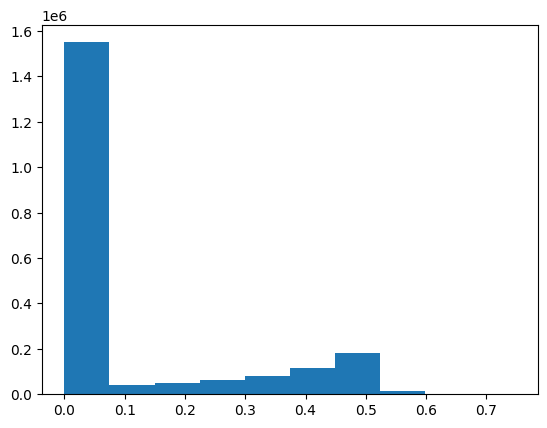

In [14]:
env = lmdb.open("/home/caojiaxiang/disease_data", readonly=True, lock=False, readahead=False,
                        meminit=False)
# 假设 weight_matrix 是你的 128x128x128 权重矩阵  
# 假设 image_matrix 是你的 128x128 图像矩阵，并且已经归一化到 [0, 1] 范围  
train_dataset = my_dataset('csvs/CN.csv', env, True, 0)
k = train_dataset[0][0].squeeze().numpy().ravel()
plt.hist(k)

In [25]:
import nibabel as nib
from monai import transforms
def average(img,hcpex,aaa):
    res = []
    for i in aaa:
        if i == 0:
            img[hcpex == i] = 0
            continue
        temp = img[hcpex == i]
        mean = np.sum(temp) / len(temp)
        res.append((i,mean))

    return res

noise = A
image_obj1 = nib.load('ROI_MNI_V4.nii')
image_data1 = np.array(image_obj1.get_fdata())
aa = np.unique(image_data1)
print(image_data1.shape)
img = np.expand_dims(image_data1, 0)
image_data1 = torch.from_numpy(img)
resize_op = transforms.Resize([128, 128, 128])
image_data1 = resize_op(image_data1).squeeze().numpy()
print(image_data1.shape)



res = average(noise,image_data1,aa)
k = sorted(res, key=lambda x:x[1],reverse=True)
kk = [x[0] for x in k]
print(k)
print(kk)
# sss = []
# for i in range(116):
#     key = gg[0][i][0]
#     value = gg[0][i][1] + gg[1][i][1] + gg[2][i][1] +gg[3][i][1]
#     print(key,value)
#     sss.append((key,value))



(91, 109, 91)
(128, 128, 128)
[(9082.0, 0.7173758398128461), (9170.0, 0.6943616000088778), (2212.0, 0.6928207006209935), (2112.0, 0.6704103586883292), (9052.0, 0.6670156144335493), (9081.0, 0.659988993983115), (3002.0, 0.6505744605014272), (2331.0, 0.6391345805053242), (8302.0, 0.6363909641901652), (2322.0, 0.6358019966990226), (2111.0, 0.6344839485424741), (2332.0, 0.6336609336609337), (2701.0, 0.624606471058783), (9051.0, 0.6245955567498602), (8301.0, 0.6203884348819279), (4102.0, 0.6186258734726324), (9062.0, 0.6051112964092038), (9022.0, 0.5950743446887379), (2321.0, 0.588119609679851), (2302.0, 0.5777978044215256), (9011.0, 0.5727004220308117), (5401.0, 0.5705690056538407), (9100.0, 0.5682367891878695), (5402.0, 0.567666689795131), (9061.0, 0.5661832187087666), (2611.0, 0.5657875562621648), (2601.0, 0.5649005997636977), (4001.0, 0.5644341330045849), (5021.0, 0.5627010742775437), (5002.0, 0.555167441500718), (2501.0, 0.554307233892931), (4101.0, 0.55313259497621), (2211.0, 0.552896

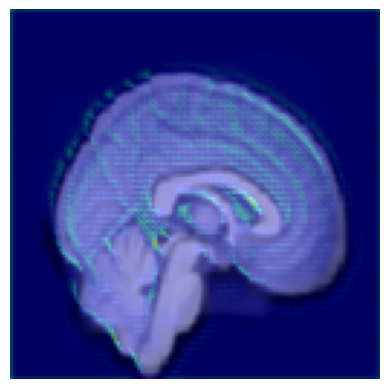

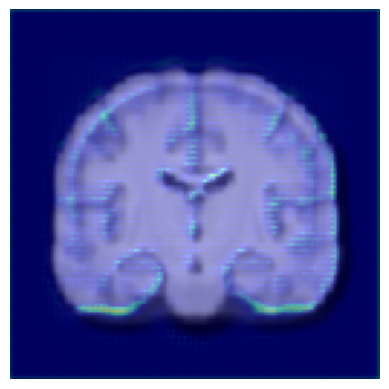

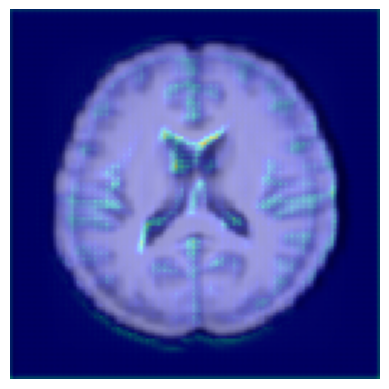

In [3]:
import numpy as np  
import matplotlib.pyplot as plt  
from matplotlib.cm import get_cmap  
from PIL import Image  
from pytorch_grad_cam.utils.image import show_cam_on_image


# for i in range(128):
#     heatmap_data = A[i, :, :]  # 选择中间的切片作为示例  
#     l = S1[i,:,:]
#     l = np.stack((l,) * 3, axis=-1)
#     # plt.imshow(l)
#     visualization = show_cam_on_image(l, heatmap_data, use_rgb=True,image_weight=0.5)
#     visualization = np.rot90(visualization,k=1)
#     plt.figure(i)
#     plt.axis('off')
#     plt.imshow(visualization)

# i = 64 j = 64
  
heatmap_data = A[64, :, :]  # 选择中间的切片作为示例  
l = S1[64,:,:]
l = np.stack((l,) * 3, axis=-1)
# plt.imshow(l)
visualization = show_cam_on_image(l, heatmap_data, use_rgb=True,image_weight=0.7)
visualization = np.rot90(visualization,k=1)
plt.figure(0)
plt.axis('off')
plt.imshow(visualization)
plt.savefig(f"figures/{k}x.png",dpi=300, bbox_inches='tight', pad_inches=0)


heatmap_data = A[:, 64, :]  # 选择中间的切片作为示例  
l = S1[:, 64, :]
l = np.stack((l,) * 3, axis=-1)
# plt.imshow(l)
visualization = show_cam_on_image(l, heatmap_data, use_rgb=True,image_weight=0.7)
visualization = np.rot90(visualization,k=1)
plt.figure(1)
plt.axis('off')
plt.imshow(visualization)
plt.savefig(f"figures/{k}y.png",dpi=300, bbox_inches='tight', pad_inches=0)

heatmap_data = A[:, :, 64]  # 选择中间的切片作为示例  
l = S1[:, :, 64]
l = np.stack((l,) * 3, axis=-1)
# plt.imshow(l)
visualization = show_cam_on_image(l, heatmap_data, use_rgb=True,image_weight=0.7)
visualization = np.rot90(visualization,k=1)
plt.figure(2)
plt.axis('off')
plt.imshow(visualization)
plt.savefig(f"figures/{k}z.png",dpi=300, bbox_inches='tight', pad_inches=0)


#     plt.imshow(k+b)

#     plt.axis('off')  # 关闭坐标轴  
#     plt.show()
# newData = []  
# for item in datas:  
#     if item[0] == 255 and item[1] == 255 and item[2] == 255:  
#         newData.append((255, 255, 255, 0))  # 白色透明  
#     else:  
#         newData.append(item[:3] + (128,))  # 假设透明度为50%  

# heatmap_image.putdata(newData)  
  
# 将热力图叠加到原始图像上（这里只是简单地合并，可能需要更复杂的融合算法）  
# 首先将原始图像转换为RGBA  

  
# 使用PIL的alpha_composite方法叠加图像（如果PIL版本支持）  
# 注意：PIL的Image模块默认不包含alpha_composite方法，你可能需要安装Pillow库  
# 或者你可以使用numpy直接操作数组来叠加图像，但需要处理alpha通道  
  
# 假设你有一个alpha_composite函数（这里只是伪代码）  
# result_image = alpha_composite(image_rgba, heatmap_image)  
  
# ... 在这里实现你的alpha_composite函数或使用其他方法叠加图像 ...  
  
# 显示或保存结果图像  
# result_image.show()  
# result_image.save('result.png')

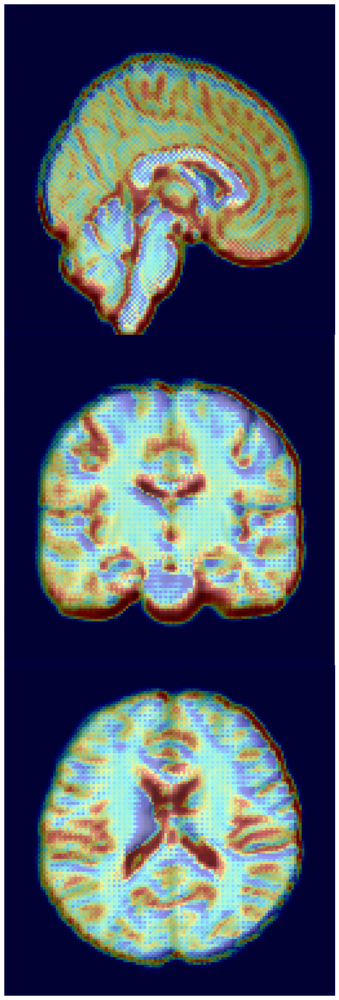

In [8]:
import numpy as np  
import matplotlib.pyplot as plt  
from matplotlib.cm import get_cmap  
from PIL import Image  
from pytorch_grad_cam.utils.image import show_cam_on_image

# 假设 A 和 S1 已经定义
# 假设 k 已经定义

fig, axes = plt.subplots(3, 1, figsize=(10, 30))  # 创建一个三行一列的图

# 第一张图
heatmap_data = A[64, :, :]  # 选择中间的切片作为示例  
l = S1[64, :, :]
l = np.stack((l,) * 3, axis=-1)
visualization = show_cam_on_image(l, heatmap_data, use_rgb=True, image_weight=0.7)
visualization = np.rot90(visualization, k=1)
axes[0].imshow(visualization)
axes[0].axis('off')

# 第二张图
heatmap_data = A[:, 64, :]  # 选择中间的切片作为示例  
l = S1[:, 64, :]
l = np.stack((l,) * 3, axis=-1)
visualization = show_cam_on_image(l, heatmap_data, use_rgb=True, image_weight=0.7)
visualization = np.rot90(visualization, k=1)
axes[1].imshow(visualization)
axes[1].axis('off')

# 第三张图
heatmap_data = A[:, :, 64]  # 选择中间的切片作为示例  
l = S1[:, :, 64]
l = np.stack((l,) * 3, axis=-1)
visualization = show_cam_on_image(l, heatmap_data, use_rgb=True, image_weight=0.7)
visualization = np.rot90(visualization, k=1)
axes[2].imshow(visualization)
axes[2].axis('off')

plt.subplots_adjust(hspace=0)  # 调整行间距为0

plt.savefig(f"figures/{k}_combined.png", dpi=300, bbox_inches='tight', pad_inches=0)
plt.show()


In [33]:
# 整体对比
import os
gpu_ids = "4,5"
#     gpu_ids = "4,5,6,7"
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_ids  
import nibabel as nib
import torch
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cv2
import pytorch_lightning as pl
from argparse import ArgumentParser
import numpy as np
from torch import nn
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.models import load_model
from torch.utils.data import Dataset,ConcatDataset,DataLoader
from model.au128 import UNetWithTransformerEncoder
import pandas as pd
from mydata1T import dataGenerator as dataG
from tqdm import tqdm
from torch.utils.data import Dataset,ConcatDataset,DataLoader
import warnings
import lmdb
from sklearn.model_selection import train_test_split
from torch.optim.lr_scheduler import LambdaLR,CosineAnnealingLR
from utils.utils_datasetDisease import *
from model.SQET import SQET

def mainNq(val_IXI,env):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#     lis = [2002,7101,4102,2701,4101,4201,4021,2332,4112,2302,7102,8102,7012,2311,4111,2312,5002,2612,2301,2321,2112,3002,7001,2322,2331,2101,2401,4202,4011,4001,9051,8302,2111,8212,9072,2611,5021,2501,9001,4012,3001,2602,6302,5402,6001,8301,9071,8101,2502,2201,9081,6401,2702,2211,6212,6301,6002,9140,5012,6202,4002,6201,2202,5001,5201,2601,6221,9062,9012,2001,4022,5022,5202,6211,6102,7011,5401,9002,2102,2402,9130,6402,2212,7002,8201,5011,6222,7021,9082,8122,9150,6101,5302,9011,8202,9160,9031,9042,9061,9041,9170,8211,9022,5102,8111,5101,8112,8121,9120,5301,9100,9021,9052,7022,9110,9032]
    MSE_l = []
    MAE_l = []

    maeList = []
    mseList = []
    data = my_dataset(val_IXI, env, False, 0)
    val_loader = DataLoader(data, batch_size  = 1,  shuffle = False)
    model_path = "./results_checkpoint/Unet3/checkpoint_best.tar"
    model = UNetWithTransformerEncoder(32, 8, 6, 128, 0.1).to(device)
    
    checkpoint1 = torch.load(model_path)
    model.load_state_dict(checkpoint1['model_state_dict'], strict=False)
    criterion = nn.MSELoss()
    test_loss = 0
    mae = 0
    with torch.no_grad():
        model.eval()
        for imgs, age in val_loader:
            imgs, age = imgs.to(device), age.to(device)
            imgs = imgs.float()
            pred = model(imgs).float().squeeze()
            loss = criterion(pred, age.float())
            l1 =  pred.float()- age.float()
            mseList.append(float(loss.data))
            maeList.append(float(l1.data))
        MSE_l.append(mseList)
        MAE_l.append(maeList)
    MAE_csv = pd.DataFrame(MAE_l)
    MSE_csv = pd.DataFrame(MSE_l)
    return MAE_csv

path = '/home/huyixiao/ba-dataset/data/disease/ADNI.csv'
env = lmdb.open("/home/caojiaxiang/disease_data", readonly=True, lock=False, readahead=False,
                    meminit=False)



cn = mainNq('csvs/ADNICN.csv',env)
mci = mainNq('csvs/MCI.csv',env)
ad = mainNq('csvs/AD.csv',env)


/home/user/anaconda3/envs/torch112/lib/python3.9/site-packages/torch/_tensor.py:1121: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  ret = func(*args, **kwargs)


In [13]:
cn

,0,1,2,3,4,5,6,7,8,9,...,87,88,89,90,91,92,93,94,95,96
0,-18.208672,-19.968033,-0.727119,-13.352455,-1.239853,-4.912987,-14.374275,-2.948128,-8.622658,-19.025154,...,-8.043434,-6.69944,-8.96109,-9.200798,-6.690262,-0.985786,-0.567856,-3.019127,-7.956444,-9.18956


97


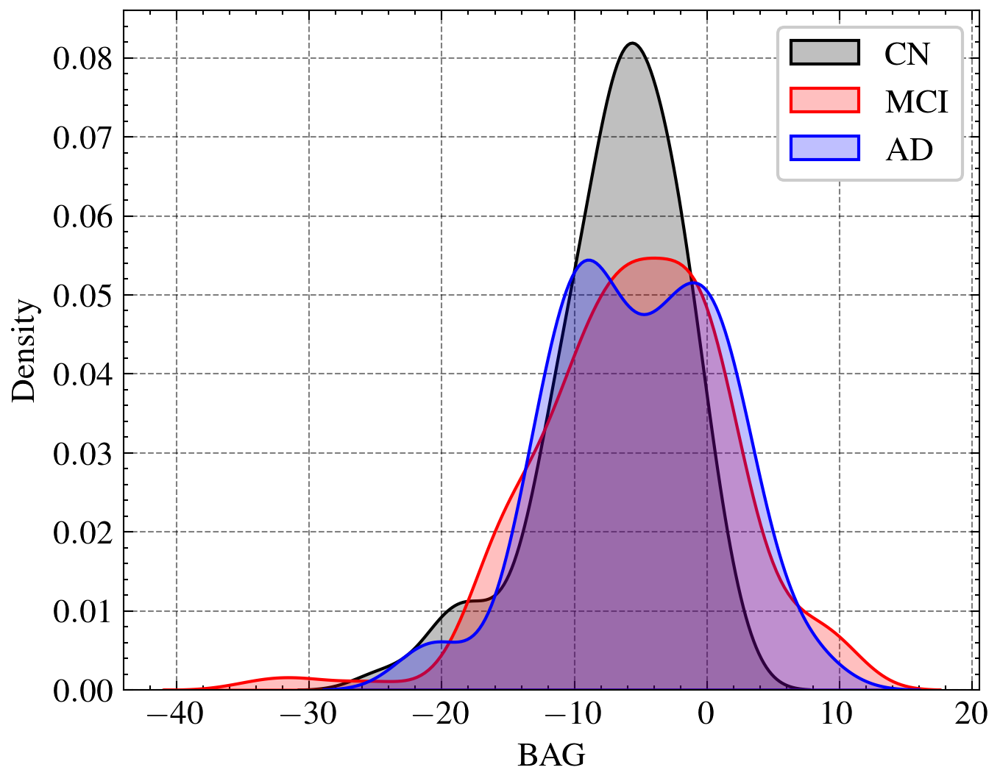

In [43]:
import seaborn as sns
i=0
lis = ['CNADT']
    
n = cn.iloc[i].values
print(len(n))
m = mci.iloc[i].values
d = ad.iloc[i].values
plt.figure(figsize=(5,4))
sns.kdeplot(n,shade=True,label="CN")
sns.kdeplot(m,shade=True,label="MCI")
sns.kdeplot(d,shade=True,label="AD")
# plt.xlim(-20, 20) 
plt.xlabel('BAG')
plt.legend()
# plt.title(str(lis[i]))
plt.savefig(f"figures/{str(lis[i])}.png",dpi=300)
plt.show()

In [6]:
import pandas as pd
import lmdb
path = '/home/huyixiao/ba-dataset/data/disease/ADNI.csv'
env = lmdb.open("/home/caojiaxiang/disease_data", readonly=True, lock=False, readahead=False,
                    meminit=False)
data = pd.read_csv(path,header=None)
a = data[data[5] == 'CN'].iloc[:,2:4]
a.to_csv('csvs/ADNICN.csv',index=False)